### Установка

In [8]:
!git clone https://github.com/uivvyd/Diffusion-samplers-for-TSF.git

Cloning into 'Diffusion-samplers-for-TSF'...
remote: Enumerating objects: 949, done.
remote: Counting objects: 100% (464/464), done.
remote: Compressing objects: 100% (210/210), done.
remote: Total 949 (delta 346), reused 253 (delta 253), pack-reused 485 (from 2)
Receiving objects: 100% (949/949), 9.15 MiB | 609.00 KiB/s, done.
Resolving deltas: 100% (556/556), done.


In [1]:
%cd Diffusion-samplers-for-TSF

/workdir/Diffusion-samplers-for-TSF


/home/mlcore/.local/lib/python3.10/site-packages/IPython/core/magics/osm.py:417: UserWarning: This is now an optional IPython functionality, setting dhist requires you to install the `pickleshare` library.
  self.shell.db['dhist'] = compress_dhist(dhist)[-100:]


In [2]:
!ls

checkpoints	    LICENSE	    results	 traffic_timegrad_samplers_res
CODE_OF_CONDUCT.md  __MACOSX	    run.py	 weather_sssd_samplers_res
config		    notebook	    run.sh	 weather_timegrad_samplers_res
datasets	    probts	    scripts
docs		    pyproject.toml  SECURITY.md
exps		    README.md	    submodules


In [4]:
!sudo apt-get install zip unzip -y

sudo: unable to open log file /run/ml-core-sys/sudo.log: Permission denied
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
zip is already the newest version (3.0-12build2).
The following NEW packages will be installed:
  unzip
0 upgraded, 1 newly installed, 0 to remove and 2 not upgraded.
Need to get 175 kB of archives.
After this operation, 386 kB of additional disk space will be used.
Get:1 http://repo-linux.tcsbank.ru/ubuntu jammy-updates/main amd64 unzip amd64 6.0-26ubuntu3.2 [175 kB]
Fetched 175 kB in 0s (507 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/Debconf/FrontEnd/Dialog.pm line 78, <> line 1.)
debconf: falling back to frontend: Readline
Selecting previously unselected package unzip.
(Reading database ... 22918 files and directories currently installed.)
Preparing to unpack .../unzip_6.0-26ubuntu3.2_am

In [11]:
!unzip datasets/all_six_datasets.zip

Archive:  datasets/all_six_datasets.zip
   creating: all_six_datasets/
   creating: all_six_datasets/traffic/
  inflating: __MACOSX/all_six_datasets/._traffic  
  inflating: all_six_datasets/.DS_Store  
  inflating: __MACOSX/all_six_datasets/._.DS_Store  
   creating: all_six_datasets/illness/
  inflating: __MACOSX/all_six_datasets/._illness  
   creating: all_six_datasets/ETT-small/
  inflating: __MACOSX/all_six_datasets/._ETT-small  
   creating: all_six_datasets/weather/
  inflating: __MACOSX/all_six_datasets/._weather  
   creating: all_six_datasets/exchange_rate/
  inflating: __MACOSX/all_six_datasets/._exchange_rate  
   creating: all_six_datasets/electricity/
  inflating: __MACOSX/all_six_datasets/._electricity  
  inflating: all_six_datasets/traffic/.DS_Store  
  inflating: __MACOSX/all_six_datasets/traffic/._.DS_Store  
  inflating: all_six_datasets/traffic/traffic.csv  
  inflating: all_six_datasets/illness/national_illness.csv  
  inflating: all_six_datasets/ETT-small/ETTh1.

In [12]:
import shutil
import os
import argparse

def move_files_up_one_level(directory):
    for item in os.listdir(directory):
        if item in ['__MACOSX', '.DS_Store', 'all_datasets.zip']:
            continue 
        s = os.path.join(directory, item)
        d = os.path.join(os.path.dirname(directory), item)
        if not os.path.exists(d):
            shutil.move(s, d)
        else:
            print(f"skip {item} due to file exist")
            delete_path(s)
    
    try:
        delete_path(directory)
    except:
        print(f'cannot delete {directory}, skip...')
    
def cleanup_directory(directory):
    for root, dirs, files in os.walk(directory):
        for name in dirs:
            if name in ['__MACOSX']:
                shutil.rmtree(os.path.join(root, name))
                
        for name in files:
            if name in ['.DS_Store', 'all_datasets.zip']:
                os.remove(os.path.join(root, name))

def delete_path(path):
    if os.path.exists(path):
        if os.path.isfile(path):
            os.remove(path)
        elif os.path.isdir(path):
            shutil.rmtree(path)
                
move_files_up_one_level('datasets/all_six_datasets')              

In [13]:
!pip install lightning

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 819.0/819.0 kB 41.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.4/194.4 kB 116.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 51.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 865.2/865.2 MB 14.7 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 961.5/961.5 kB 31.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 823.1/823.1 kB 47.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 156.7 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 90.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.7/23.7 MB 181.0 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 897.7/897.7 kB 198.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.9/8.9 MB 153.1 MB/s eta 0:00:0

In [14]:
!pip install gluonts

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 61.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 443.9/443.9 kB 154.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.1/56.1 kB 5.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 118.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [15]:
!pip install dotenv

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [16]:
!pip install reformer-pytorch

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 8.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [17]:
!pip install linear-attention-transformer

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [18]:
!pip install utilsforecast

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 kB 8.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [19]:
!pip install transformers 

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.4/10.4 MB 176.8 MB/s eta 0:00:0000:010:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 484.2/484.2 kB 29.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 781.7/781.7 kB 194.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.0/3.0 MB 108.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 471.6/471.6 kB 72.7 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [20]:
!pip install jax

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.3/2.3 MB 90.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 MB 86.3 MB/s eta 0:00:0000:0100:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 133.2 MB/s eta 0:00:0000:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 71.9/71.9 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.7/37.7 MB 152.9 MB/s eta 0:00:0000:0100:01

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [21]:
!pip install scikit-learn

Looking in indexes: https://artifactory.tcsbank.ru/artifactory/api/pypi/python-all/simple
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.5/13.5 MB 209.2 MB/s eta 0:00:00a 0:00:01
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 307.7/307.7 kB 46.4 MB/s eta 0:00:00

[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python3.10 -m pip install --upgrade pip


In [3]:
%load_ext autoreload
%autoreload 2

In [5]:
from probts.model.forecaster import LinearForecaster, NaiveForecaster, CSDI
from probts.model.forecast_module import ProbTSForecastModule
from probts.data import ProbTSDataModule, DataManager, ProbTSBatchData
from probts.utils import find_best_epoch
from lightning import Trainer
import torch
import matplotlib.pyplot as plt

In [6]:
import pytorch_lightning as pl
pl.seed_everything(0)

Seed set to 0


0

In [7]:
import warnings
warnings.filterwarnings("ignore")

## CSDI, Weather

In [26]:
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

In [34]:
import matplotlib.pyplot as plt
import numpy as np

def forecast_and_visualize(batch, model, num_chan=10, num_samples=100, batch_idx=0, context_length=96, prediction_length=96):
    model = model.to(DEVICE)
    batch_data = ProbTSBatchData(batch, model.device)
    past_target_cdf = batch_data.past_target_cdf
    future_target_cdf = batch_data.future_target_cdf
    batch_data.past_target_cdf = model.scaler.transform(batch_data.past_target_cdf)

    with torch.no_grad():
        prediction = model.forecaster.forecast(batch_data, num_samples=num_samples)
        prediction = model.scaler.inverse_transform(prediction).cpu()
    prediction = prediction[batch_idx]

    past_range = range(0, context_length)
    future_range = range(context_length, context_length + prediction_length)
    full_range = range(0, context_length + prediction_length)

    q05 = np.quantile(prediction, 0.05, axis=0)
    q25 = np.quantile(prediction, 0.25, axis=0)
    q75 = np.quantile(prediction, 0.75, axis=0)
    q95 = np.quantile(prediction, 0.95, axis=0)
    avg = prediction.mean(axis=0)
    med = np.quantile(prediction, 0.5, axis=0)

    if type(num_chan) is int:
        num_chan = range(num_chan)
    for i in num_chan:
        target = torch.cat([past_target_cdf[batch_idx, -context_length:, i], future_target_cdf[batch_idx, :, i]]).cpu()
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        ax.plot(future_range, avg[:, i], color='orange', label='average forecasts')
        ax.fill_between(future_range, q05[:, i], q95[:, i], color='orange', alpha=.4, label='interval:0.9')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5))
        plt.show()
        
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        ax.plot(future_range, med[:, i], color='green', label='median forecasts')
        ax.fill_between(future_range, q25[:, i], q75[:, i], color='green', alpha=.4, label='interval:0.5')
        plt.legend(loc="center left", bbox_to_anchor=(1.04, 0.5))
        plt.show()

In [28]:
import time

def time_for_forecast(batch, model, n_repeats=10):
    model = model.to(DEVICE)
    batch_data = ProbTSBatchData(batch, model.device)
    total_time = 0
    for i in range(n_repeats):
        start_time = time.time()
        with torch.no_grad():
            prediction = model.forecaster.forecast(batch_data, num_samples=1)
        total_time += (time.time() - start_time)
    total_time /= n_repeats
    return total_time

In [29]:
from tqdm import tqdm

def check_metrics_for_samplers(test_dataloader, model, trainer, steps):
    metrics = []
    for num_steps in tqdm(steps):
        model.forecaster.solver_num_steps = num_steps
        res = trainer.test(model=model, dataloaders=test_dataloader)
        metrics += res
    return metrics

In [11]:
data_manager = DataManager(
    dataset='weather_ltsf',
    path='datasets',
    context_length=96,
    prediction_length=96,
    scaler='standard',
)

data_module = ProbTSDataModule(
    data_manager=data_manager,
    batch_size=8,
    test_batch_size=8,
    num_workers=8,
)
test_dataloader = data_module.test_dataloader()

Loading Long-term Dataset: weather_ltsf
val  pred_len: 96 : num_test_windows: 54
test  pred_len: 96 : num_test_windows: 109
Test context length: [96], prediction length: [96]
Validation context length: [96], prediction length: [96]
Training context length: [96], prediction lengths: [96]
Test rolling length: 96
Variable-specific normalization: True


In [12]:
for batch in test_dataloader:
    break
    
def vis(batch, model, num_chan=21, batch_idx=0, context_length=96, prediction_length=96):
    batch_data = ProbTSBatchData(batch, model.device)
    past_target_cdf = model.scaler.transform(batch_data.past_target_cdf)
    future_target_cdf = model.scaler.transform(batch_data.future_target_cdf)
    past_target_cdf = batch_data.past_target_cdf
    future_target_cdf = batch_data.future_target_cdf
    batch_data.past_target_cdf = past_target_cdf

    past_range = range(0, context_length)
    future_range = range(context_length, context_length + prediction_length)
    full_range = range(0, context_length + prediction_length)

    if type(num_chan) is int:
        num_chan = range(num_chan)
    for i in num_chan:
        target = torch.cat([past_target_cdf[batch_idx, -context_length:, i], future_target_cdf[batch_idx, :, i]])
        fig, ax = plt.subplots(figsize=(10, 2))
        ax.plot(full_range, target, color='black', alpha=0.7, label='ground truth')
        plt.show()

In [13]:
k = 0
for data in test_dataloader:
    print(data['future_target_cdf'].shape)
    break

torch.Size([8, 96, 21])


In [14]:
forecaster = CSDI(
    target_dim=data_manager.target_dim,
    context_length=data_manager.context_length,
    prediction_length=data_manager.prediction_length,
    freq=data_manager.freq,
    lags_list=data_manager.lags_list,
    time_feat_dim=data_manager.time_feat_dim,
    dataset=data_manager.dataset,

      emb_time_dim= 128,
      emb_feature_dim=16,
      channels= 64,
      n_layers= 4,
      num_heads= 8,
      num_steps= 500,
      diffusion_embedding_dim= 128,
      beta_start= 0.0001,
      beta_end= 0.1,
      schedule='linear',
      sample_size= 64,
      linear_trans= False,
      use_lags=False,
      use_feat_idx_emb=False,
      use_time_feat=False,
      feat_idx_emb_dim=1
)
     
model = ProbTSForecastModule(
    forecaster=forecaster,
    scaler=data_manager.scaler,
    learning_rate=0.001,
    quantiles_num=20,
)
model = model.load_from_checkpoint('../weather_csdi_epoch=69-step=1750.ckpt')

sampling_weight_scheme: none
sampling_weight_scheme: none


In [15]:
trainer = Trainer(
    accelerator="gpu",
    devices=1,
    strategy="auto",
    max_epochs=50,
    use_distributed_sampler=False,
    limit_train_batches=100,
    log_every_n_steps=1,
    accumulate_grad_batches=1,
    default_root_dir='./results',
  check_val_every_n_epoch= 1,
  gradient_clip_val=0.5
)

Using default `ModelCheckpoint`. Consider installing `litmodels` package to enable `LitModelCheckpoint` for automatic upload to the Lightning model registry.
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


### DDPM

In [17]:
model.num_samples = 25

In [18]:
model.scaler = data_manager.scaler
model.forecaster.solver = 'ddpm'
model.forecaster.solver_num_steps = 500
model.forecaster.solver_schedule = 'linear'

In [30]:
for batch in test_dataloader:
    break

time_for_forecast(batch, model, n_repeats=1)

3.5324225425720215

In [21]:
res = trainer.test(model=model, dataloaders=test_dataloader);

You are using a CUDA device ('NVIDIA H100 80GB HBM3') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.06427552551031113
    96_test_CRPS-Sum        0.04288437217473984
      96_test_MASE          15.638076782226562
       96_test_MSE             7121436160.0
     96_test_MSE-Sum          149594030080.0
       96_test_ND           0.08051588386297226
     96_test_ND-Sum         0.05226737633347511
      96_test_NRMSE          70.29817199707031
    96_test_NRMSE-Sum       15.362608909606934
   96_test_weighted_ND      0.08051588386297226
 96_test_weighted_ND-Sum    0.05226737633347511
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [22]:
res

[{'96_test_ND': 0.08051588386297226,
  '96_test_ND-Sum': 0.05226737633347511,
  '96_test_weighted_ND': 0.08051588386297226,
  '96_test_weighted_ND-Sum': 0.05226737633347511,
  '96_test_CRPS': 0.06427552551031113,
  '96_test_CRPS-Sum': 0.04288437217473984,
  '96_test_NRMSE': 70.29817199707031,
  '96_test_NRMSE-Sum': 15.362608909606934,
  '96_test_MSE': 7121436160.0,
  '96_test_MSE-Sum': 149594030080.0,
  '96_test_MASE': 15.638076782226562}]

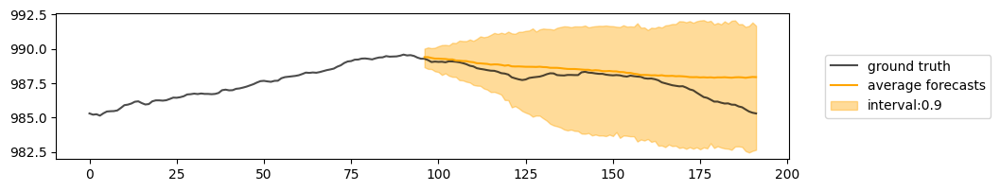

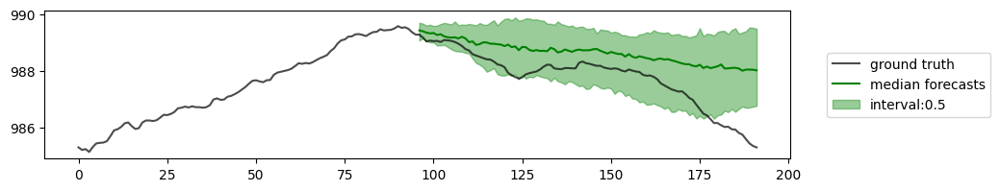

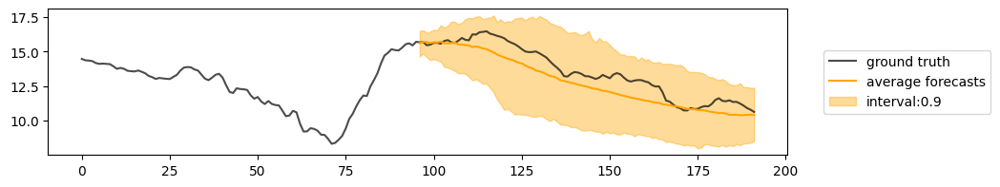

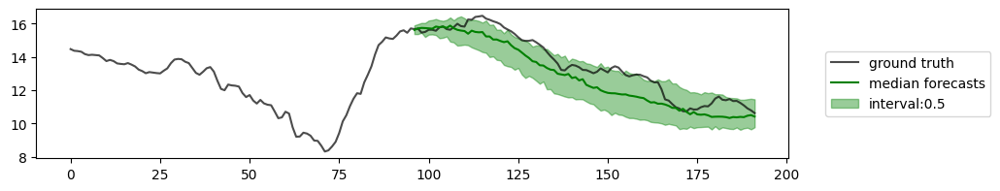

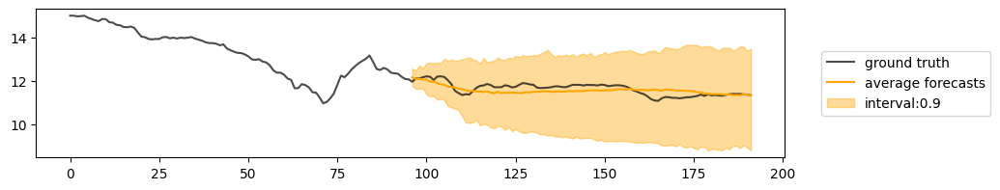

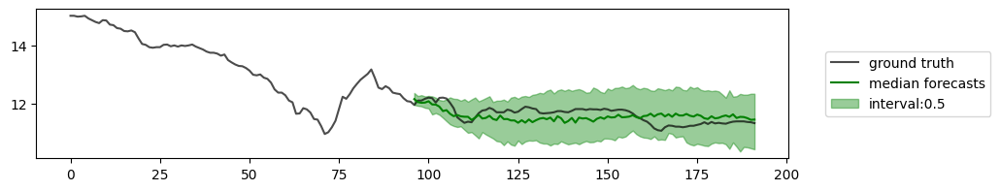

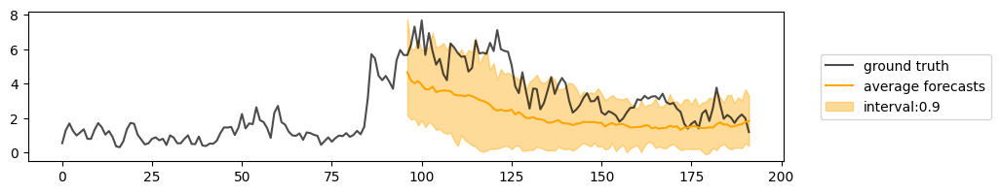

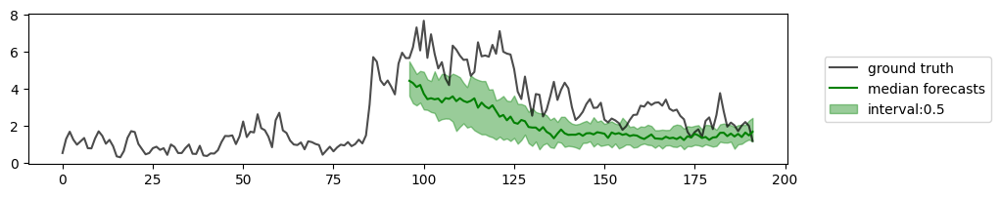

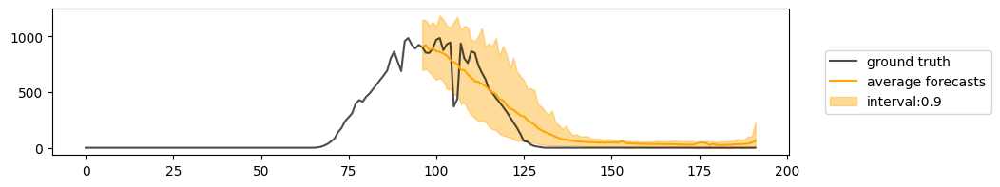

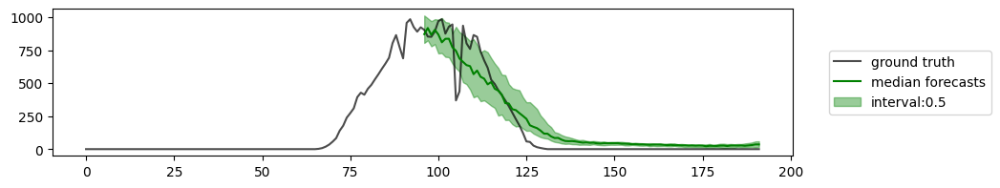

In [35]:
forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96)

### Euler

In [36]:
model.scaler = data_manager.scaler
model.forecaster.solver = 'euler'
model.forecaster.solver_num_steps = 15
model.forecaster.solver_schedule = 'linear'

for batch in test_dataloader:
    break

In [37]:
steps = [10, 15, 20, 30, 50, 100]
euler_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    euler_time.append(time_for_forecast(batch, model, n_repeats=1))
euler_time

100%|██████████| 6/6 [00:01<00:00,  3.80it/s]


[0.07794594764709473,
 0.09746742248535156,
 0.134751558303833,
 0.2033977508544922,
 0.34551000595092773,
 0.7015988826751709]

In [38]:
euler_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=[10, 15, 20, 30, 50, 100])

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:37<03:06, 37.24s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          175.77337646484375
    96_test_CRPS-Sum         150.9296417236328
      96_test_MASE            26438.283203125
       96_test_MSE             9702119424.0
     96_test_MSE-Sum          826775306240.0
       96_test_ND           134.09454345703125
     96_test_ND-Sum          213.6732635498047
      96_test_NRMSE          589.6181030273438
    96_test_NRMSE-Sum       259.22039794921875
   96_test_weighted_ND      134.09454345703125
 96_test_weighted_ND-Sum     213.6732635498047
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [01:25<02:54, 43.69s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           77.62808990478516
    96_test_CRPS-Sum        138.21652221679688
      96_test_MASE             3265.91796875
       96_test_MSE             19408812032.0
     96_test_MSE-Sum          1477265195008.0
       96_test_ND           21.091203689575195
     96_test_ND-Sum          171.9841766357422
      96_test_NRMSE          829.3217163085938
    96_test_NRMSE-Sum        344.3135681152344
   96_test_weighted_ND      21.091203689575195
 96_test_weighted_ND-Sum     171.9841766357422
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [02:24<02:32, 50.71s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          2.5366761684417725
    96_test_CRPS-Sum         9.732090950012207
      96_test_MASE          27.495859146118164
       96_test_MSE             3108466176.0
     96_test_MSE-Sum          121233252352.0
       96_test_ND           0.19789347052574158
     96_test_ND-Sum          4.564090728759766
      96_test_NRMSE           322.44775390625
    96_test_NRMSE-Sum        95.52631378173828
   96_test_weighted_ND      0.19789347052574158
 96_test_weighted_ND-Sum     4.564090728759766
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.12257236242294312
    96_test_CRPS-Sum        0.15567074716091156
      96_test_MASE           21.46639633178711
       96_test_MSE              569460416.0
     96_test_MSE-Sum           12513314816.0
       96_test_ND           0.11954253911972046
     96_test_ND-Sum         0.07243461906909943
      96_test_NRMSE         109.43641662597656
    96_test_NRMSE-Sum        24.42715072631836
   96_test_weighted_ND      0.11954253911972046
 96_test_weighted_ND-Sum    0.07243461906909943
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


 67%|██████▋   | 4/6 [03:46<02:06, 63.07s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [05:50<01:25, 85.19s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.08141104876995087
    96_test_CRPS-Sum        0.05381127446889877
      96_test_MASE          19.359949111938477
       96_test_MSE              217164944.0
     96_test_MSE-Sum           4581903872.0
       96_test_ND           0.10157263278961182
     96_test_ND-Sum         0.06527934968471527
      96_test_NRMSE         36.094322204589844
    96_test_NRMSE-Sum        7.934581756591797
   96_test_weighted_ND      0.10157263278961182
 96_test_weighted_ND-Sum    0.06527934968471527
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [09:44<00:00, 97.40s/it] 

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.0710090771317482
    96_test_CRPS-Sum       0.046181079000234604
      96_test_MASE           17.45994758605957
       96_test_MSE              821568192.0
     96_test_MSE-Sum           17263962112.0
       96_test_ND            0.091254323720932
     96_test_ND-Sum        0.059604763984680176
      96_test_NRMSE          51.86654281616211
    96_test_NRMSE-Sum       11.339554786682129
   96_test_weighted_ND       0.091254323720932
 96_test_weighted_ND-Sum   0.059604763984680176
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [39]:
import pickle
with open("euler_metrics.pkl", "wb") as fp:
   pickle.dump(euler_metrics, fp)

10


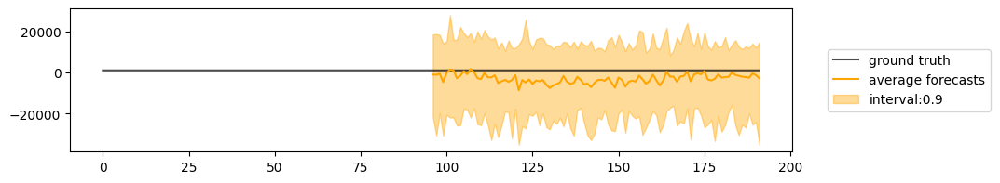

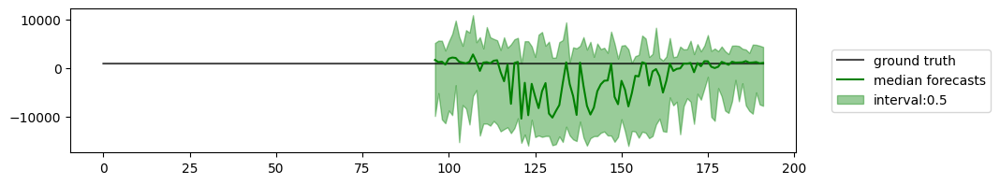

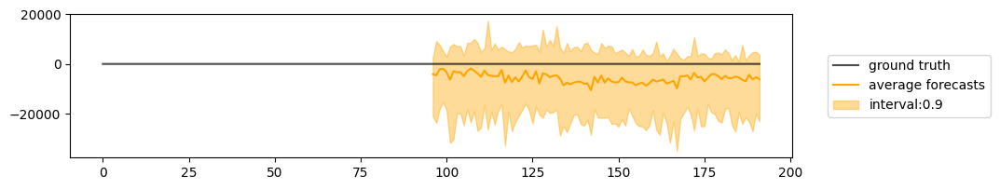

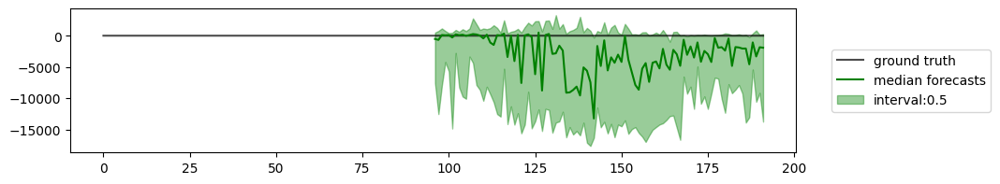

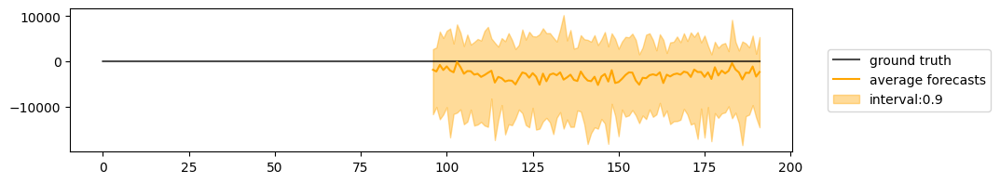

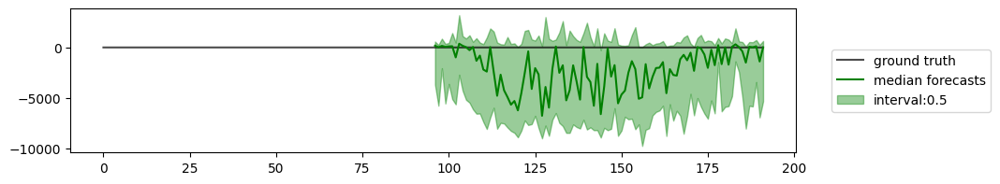

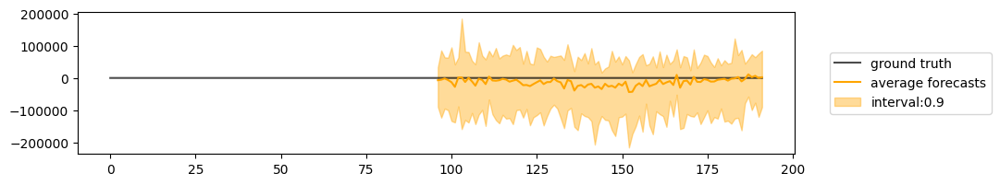

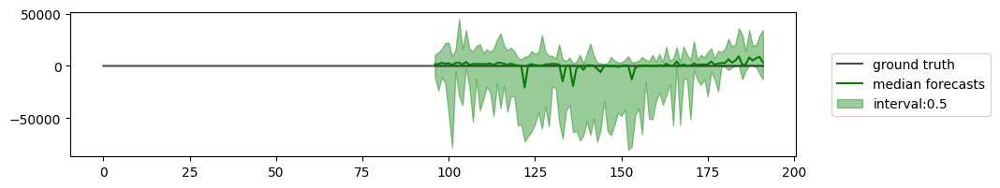

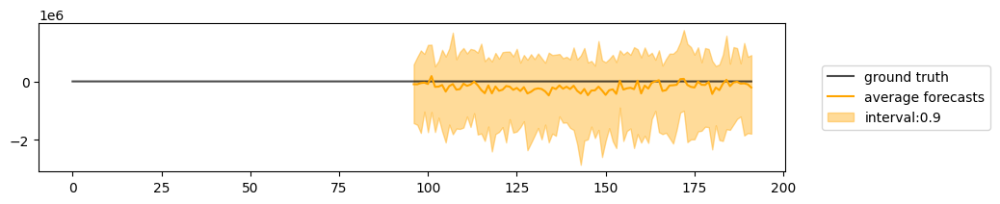

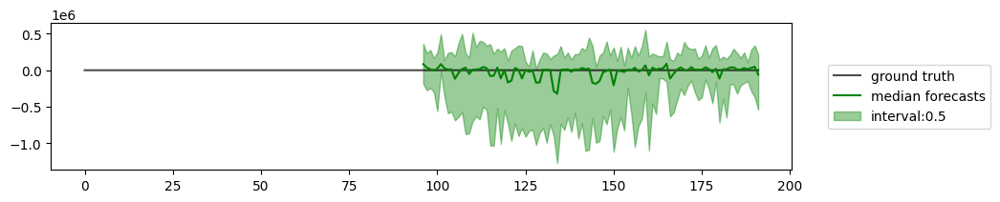

15


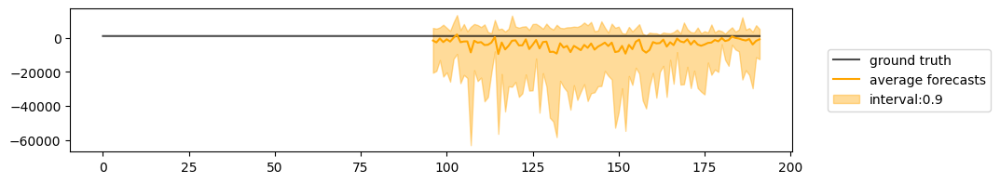

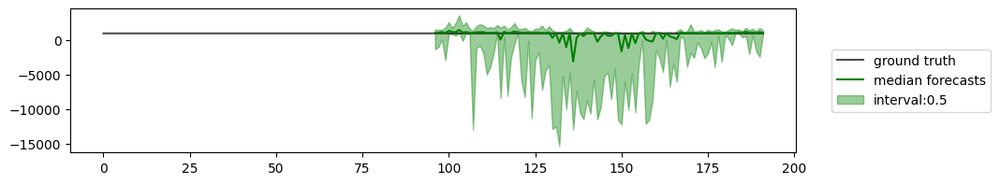

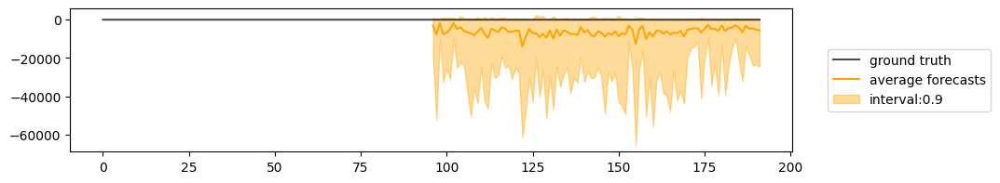

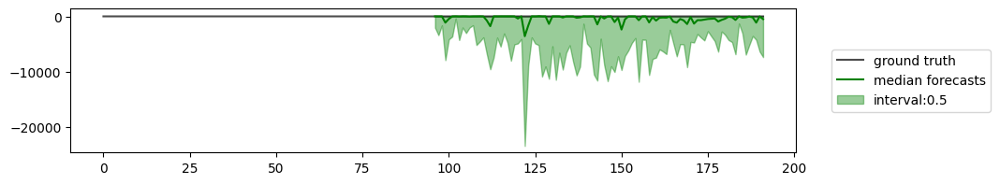

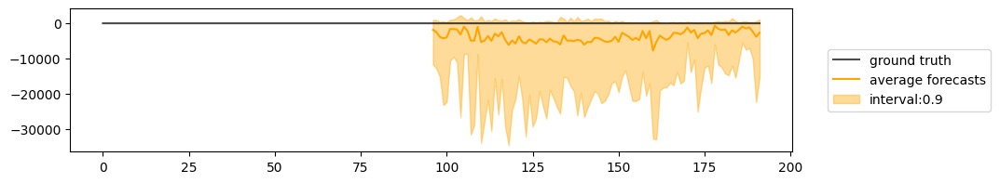

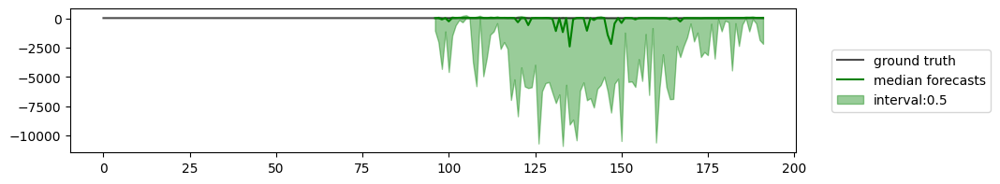

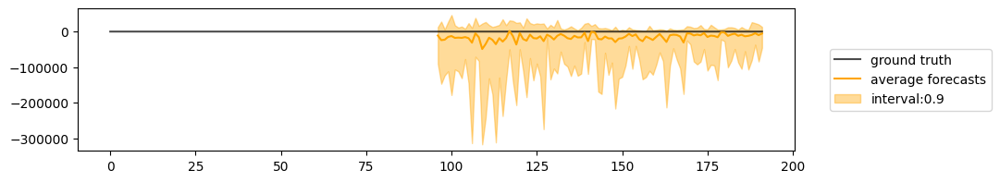

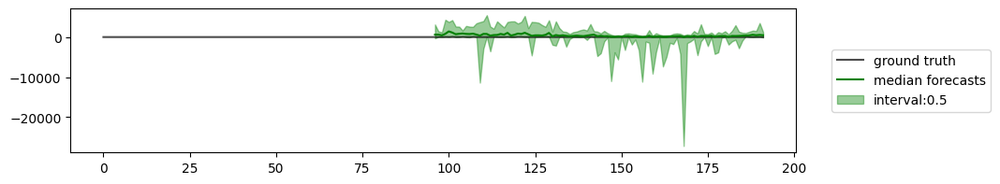

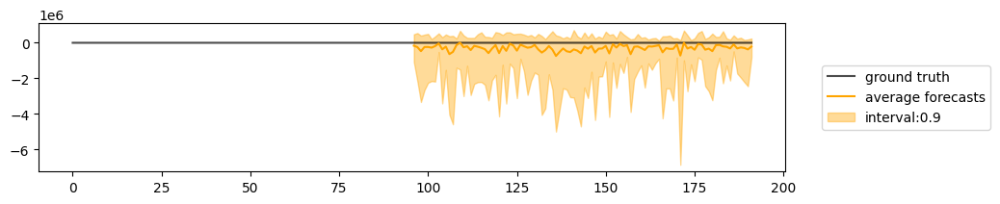

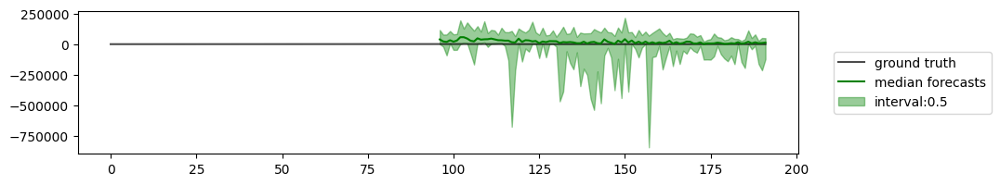

20


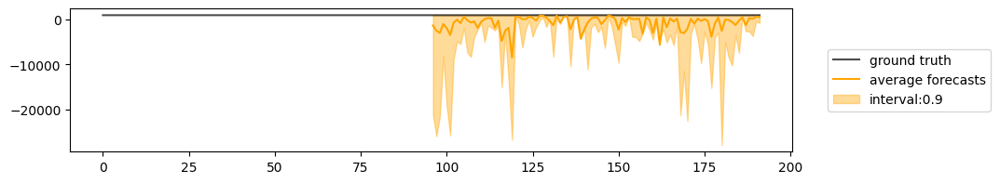

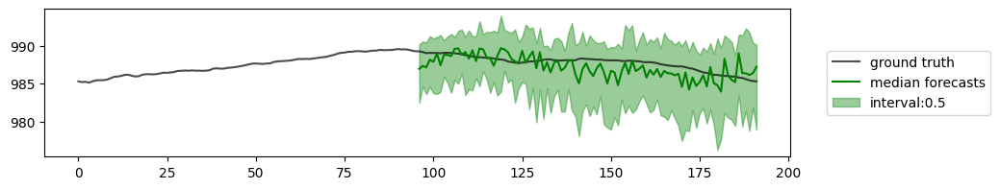

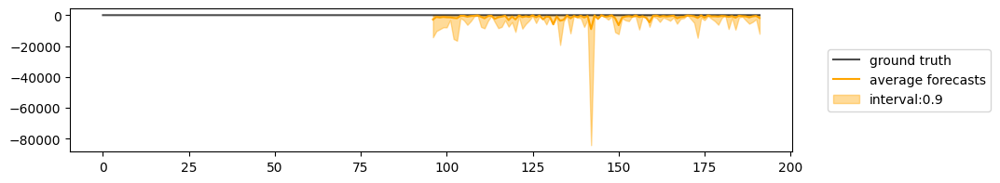

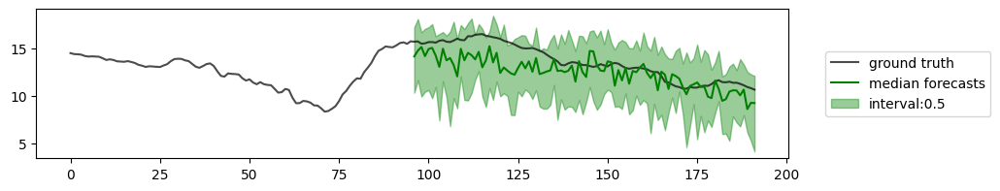

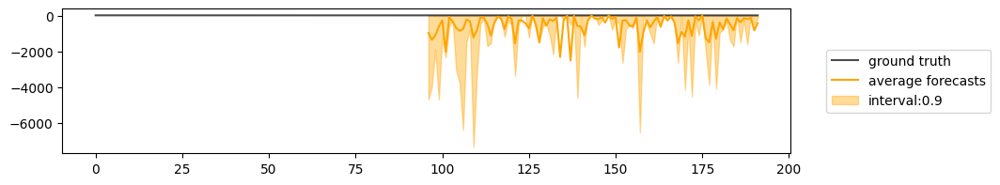

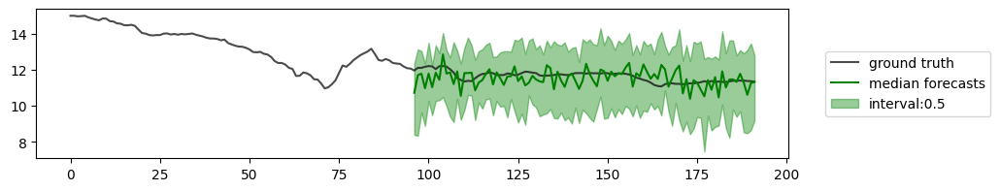

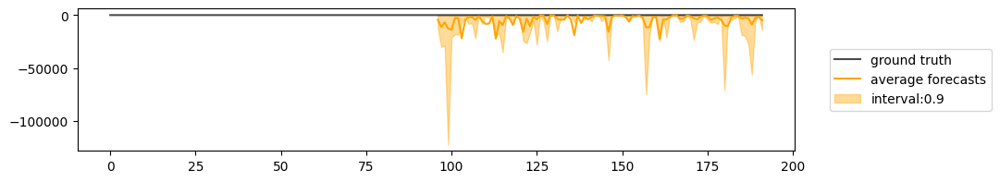

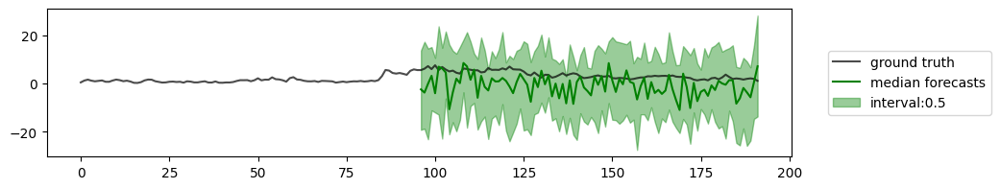

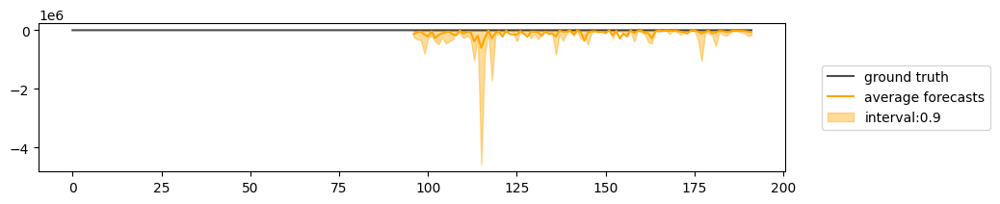

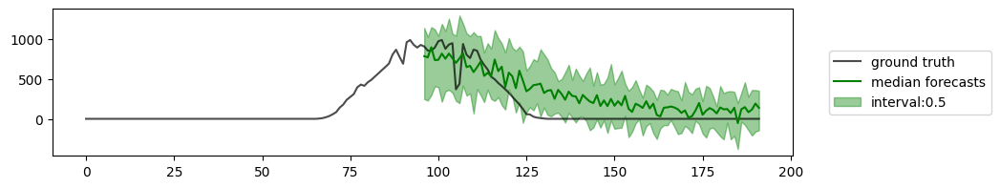

30


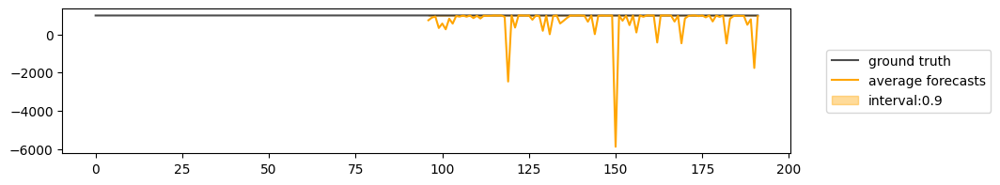

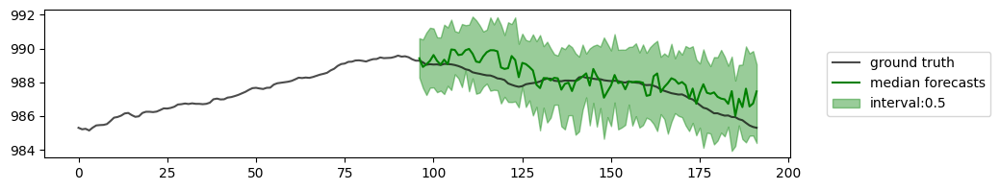

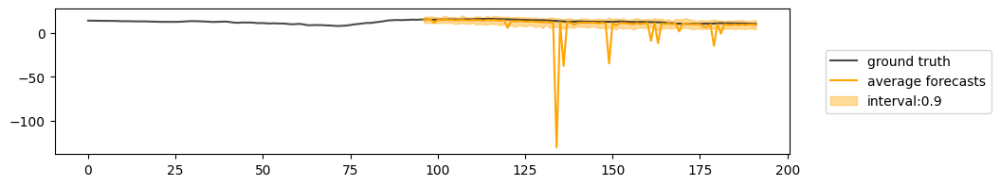

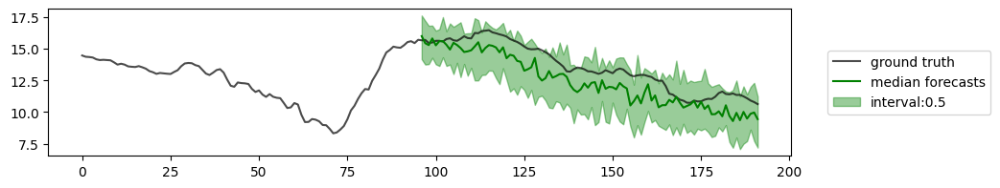

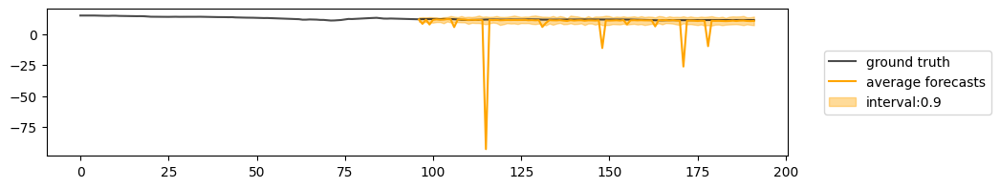

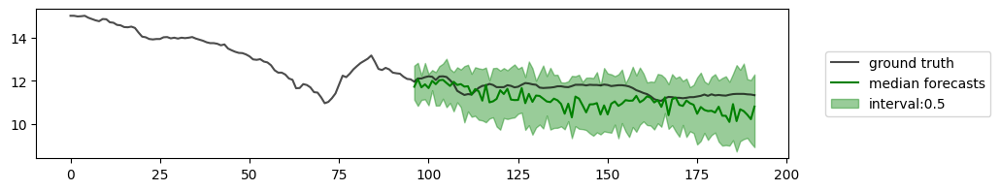

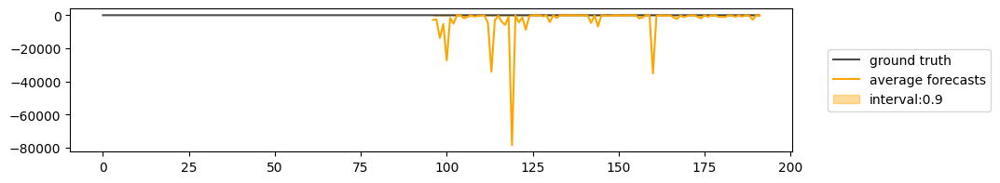

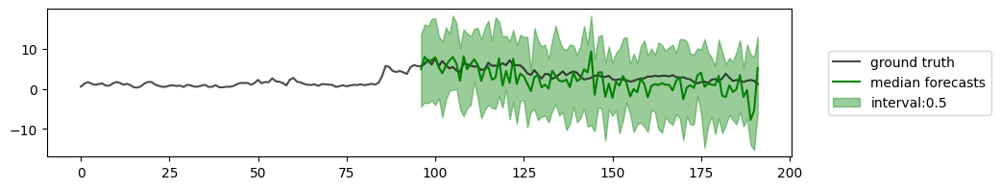

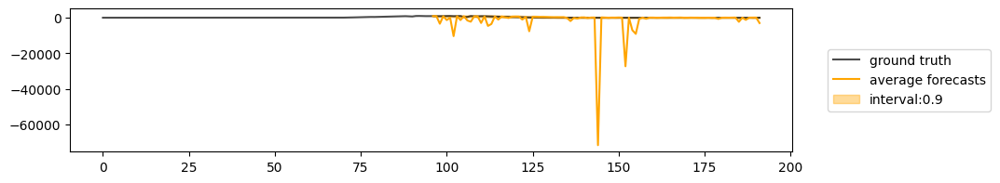

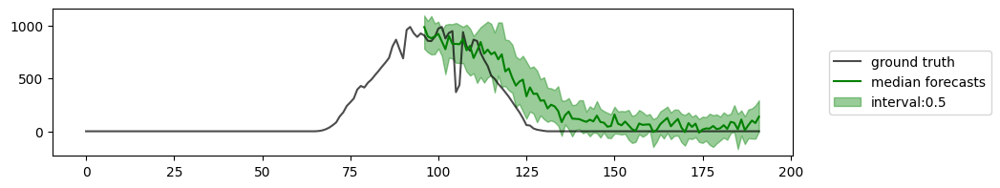

50


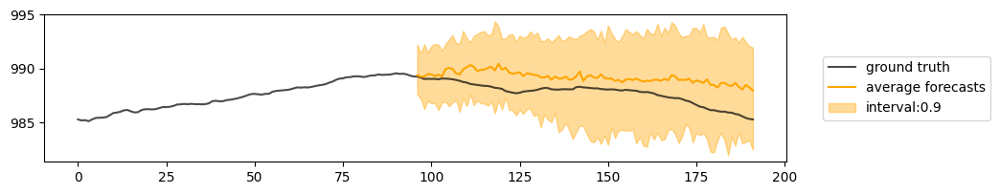

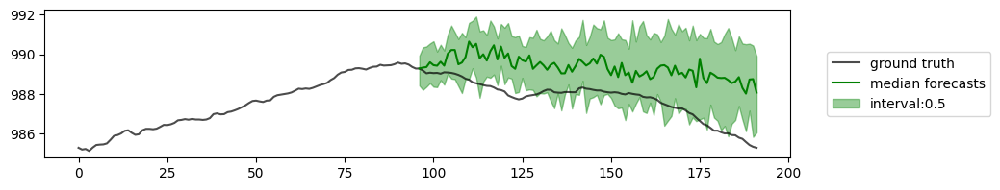

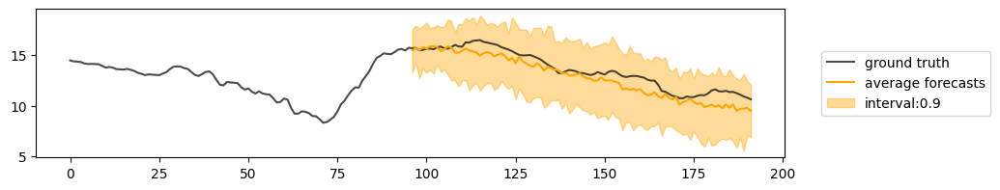

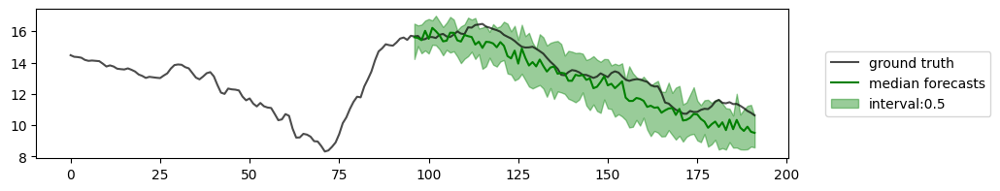

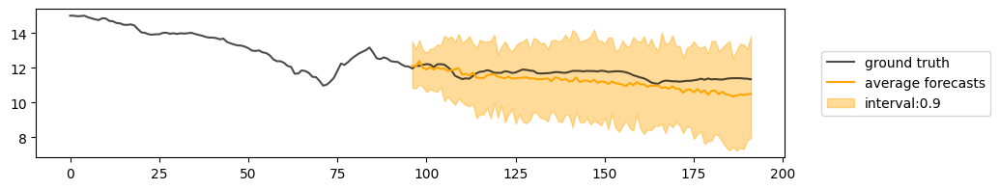

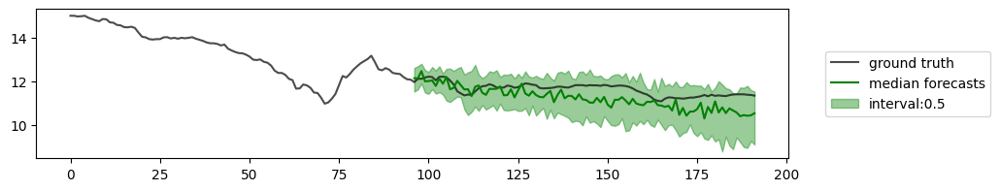

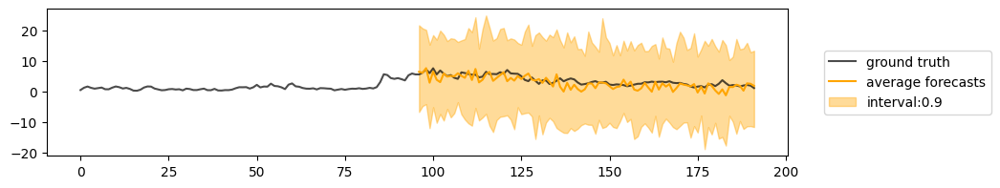

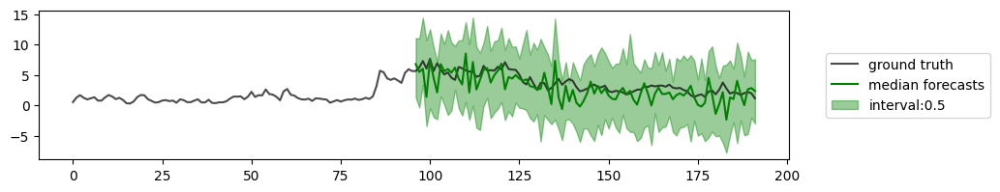

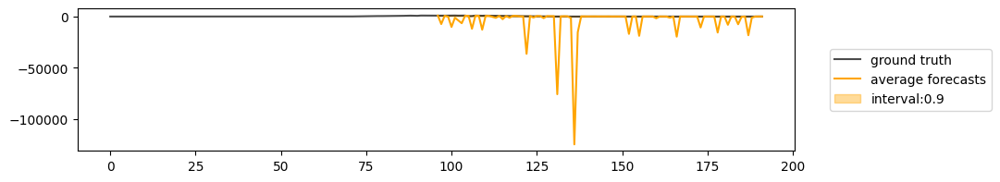

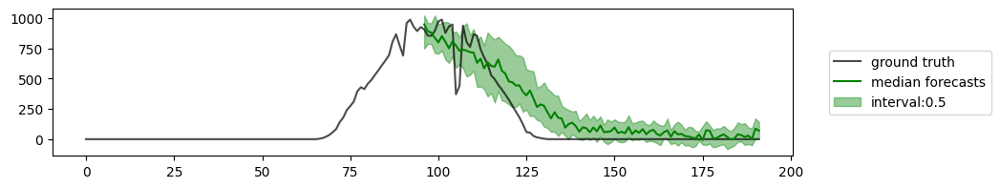

100


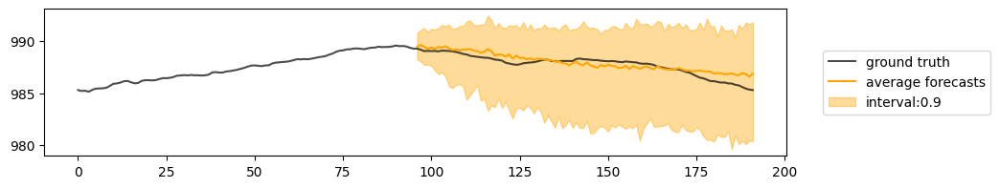

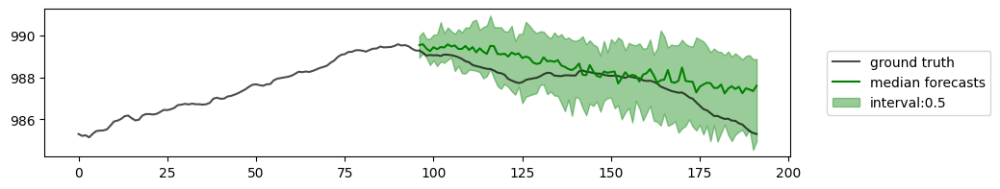

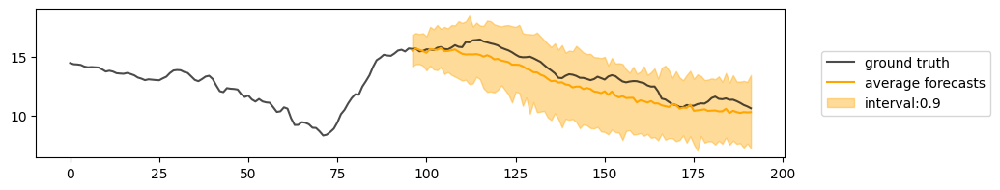

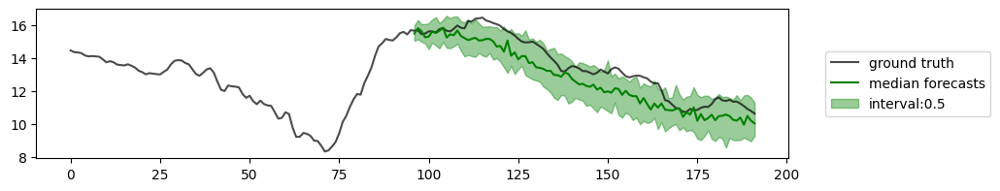

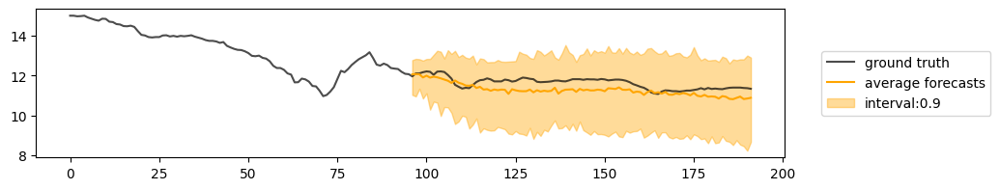

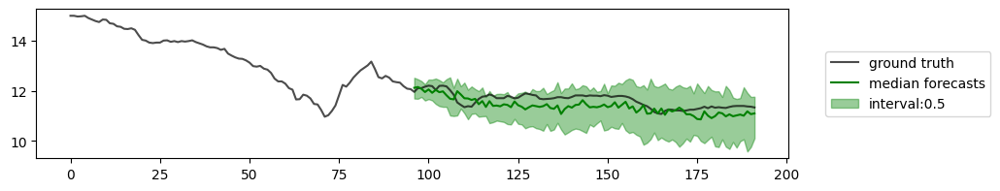

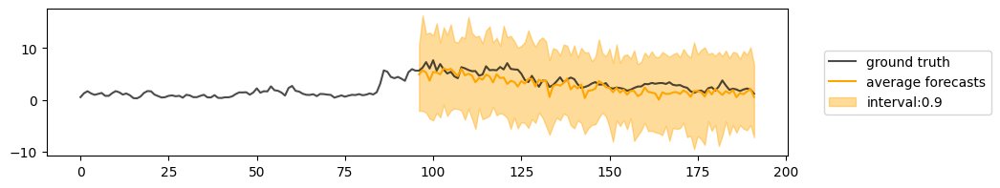

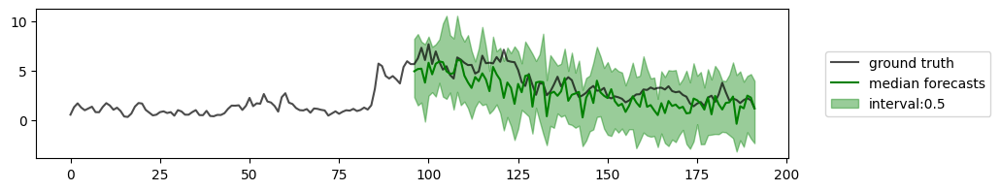

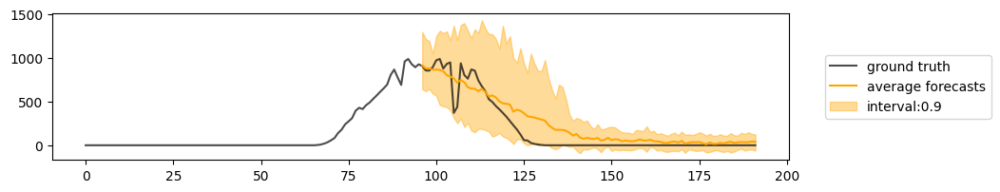

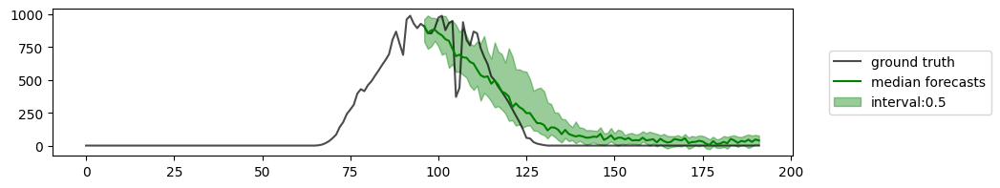

In [40]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96)
    plt.show()

### Heun

In [41]:
model.forecaster.solver = 'heun'
model.scaler = data_manager.scaler
model.forecaster.solver_num_steps = 15
model.forecaster.solver_schedule = 'linear'
steps = [10, 15, 20, 30, 50, 100]

for batch in test_dataloader:
    break

In [44]:
heun_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps // 2
    heun_time.append(time_for_forecast(batch, model, n_repeats=1))
heun_time

100%|██████████| 6/6 [00:01<00:00,  3.95it/s]


[0.05685257911682129,
 0.08300971984863281,
 0.1254565715789795,
 0.19604849815368652,
 0.34342503547668457,
 0.6970465183258057]

In [46]:
heun_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)


  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]


 17%|█▋        | 1/6 [00:56<04:44, 56.88s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          1387.7254638671875
    96_test_CRPS-Sum         1405.197998046875
      96_test_MASE             193635.359375
       96_test_MSE            922179010560.0
     96_test_MSE-Sum         77904096526336.0
       96_test_ND            892.3521728515625
     96_test_ND-Sum           1984.7119140625
      96_test_NRMSE            5742.5546875
    96_test_NRMSE-Sum        2514.768310546875
   96_test_weighted_ND       892.3521728515625
 96_test_weighted_ND-Sum      1984.7119140625
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]


 33%|███▎      | 2/6 [02:15<04:38, 69.62s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          186.79571533203125
    96_test_CRPS-Sum         586.486572265625
      96_test_MASE           2373.971923828125
       96_test_MSE            787605684224.0
     96_test_MSE-Sum         52026880819200.0
       96_test_ND           11.124692916870117
     96_test_ND-Sum          580.6250610351562
      96_test_NRMSE          5270.68896484375
    96_test_NRMSE-Sum       2037.3468017578125
   96_test_weighted_ND      11.124692916870117
 96_test_weighted_ND-Sum     580.6250610351562
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]


 50%|█████     | 3/6 [03:55<04:10, 83.65s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           7.046845436096191
    96_test_CRPS-Sum        32.221763610839844
      96_test_MASE           19.74501609802246
       96_test_MSE            131149840384.0
     96_test_MSE-Sum          4236056723456.0
       96_test_ND           0.12168249487876892
     96_test_ND-Sum          9.556998252868652
      96_test_NRMSE          2082.32861328125
    96_test_NRMSE-Sum        561.9918823242188
   96_test_weighted_ND      0.12168249487876892
 96_test_weighted_ND-Sum     9.556998252868652
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]


 67%|██████▋   | 4/6 [06:19<03:35, 107.53s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.10924482345581055
    96_test_CRPS-Sum        0.30966219305992126
      96_test_MASE          17.241567611694336
       96_test_MSE             20195117056.0
     96_test_MSE-Sum          441072910336.0
       96_test_ND           0.0972554162144661
     96_test_ND-Sum        0.061765946447849274
      96_test_NRMSE          585.1925048828125
    96_test_NRMSE-Sum        130.3720245361328
   96_test_weighted_ND      0.0972554162144661
 96_test_weighted_ND-Sum   0.061765946447849274
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]


 83%|████████▎ | 5/6 [10:11<02:32, 152.20s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.07183793187141418
    96_test_CRPS-Sum        0.05015305057168007
      96_test_MASE          17.223581314086914
       96_test_MSE             3467820288.0
     96_test_MSE-Sum           72898240512.0
       96_test_ND           0.09125277400016785
     96_test_ND-Sum         0.05915677547454834
      96_test_NRMSE         101.37195587158203
    96_test_NRMSE-Sum       22.166866302490234
   96_test_weighted_ND      0.09125277400016785
 96_test_weighted_ND-Sum    0.05915677547454834
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]


100%|██████████| 6/6 [17:40<00:00, 176.81s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.06840243190526962
    96_test_CRPS-Sum       0.045103639364242554
      96_test_MASE          16.407272338867188
       96_test_MSE             6968196096.0
     96_test_MSE-Sum          146338316288.0
       96_test_ND           0.08620120584964752
     96_test_ND-Sum         0.05615311861038208
      96_test_NRMSE         116.80500030517578
    96_test_NRMSE-Sum       25.509157180786133
   96_test_weighted_ND      0.08620120584964752
 96_test_weighted_ND-Sum    0.05615311861038208
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [47]:
import pickle
with open("heun_metrics.pkl", "wb") as fp:
   pickle.dump(heun_metrics, fp)

10


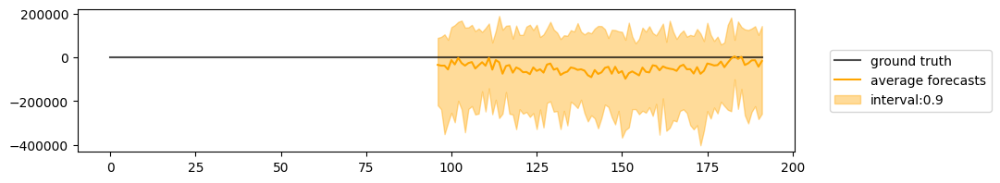

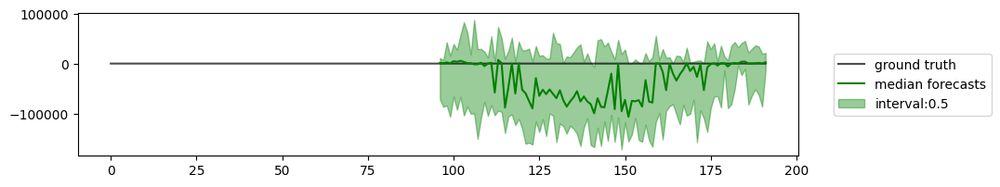

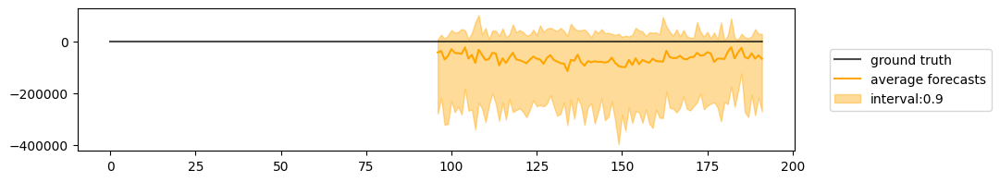

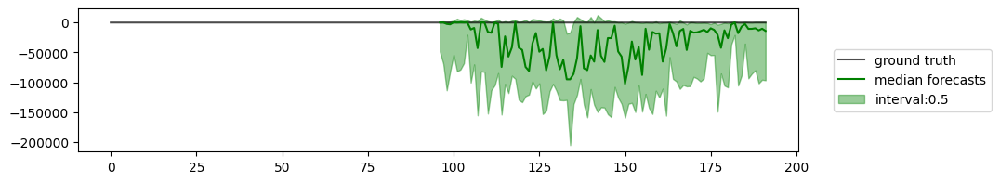

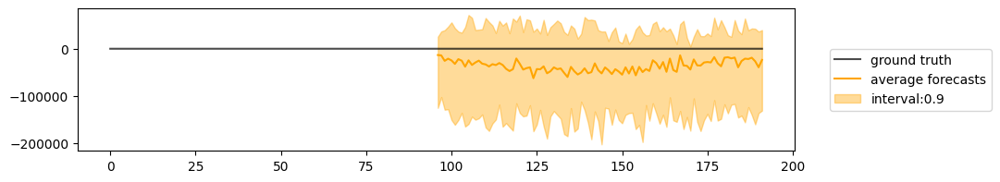

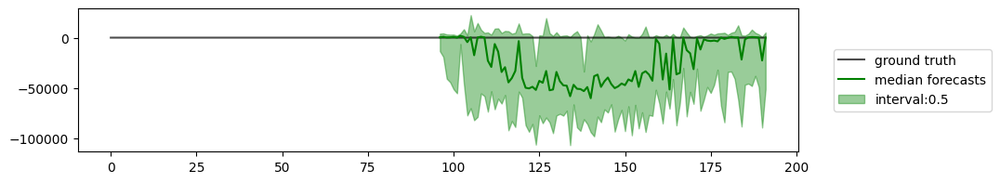

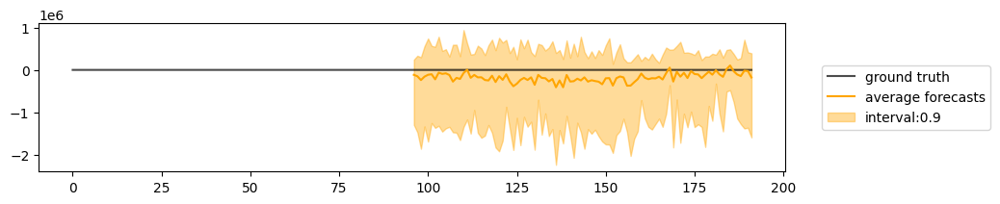

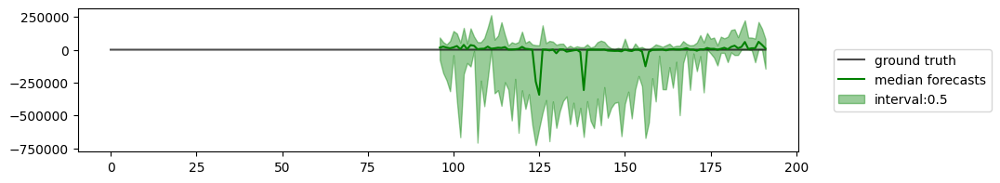

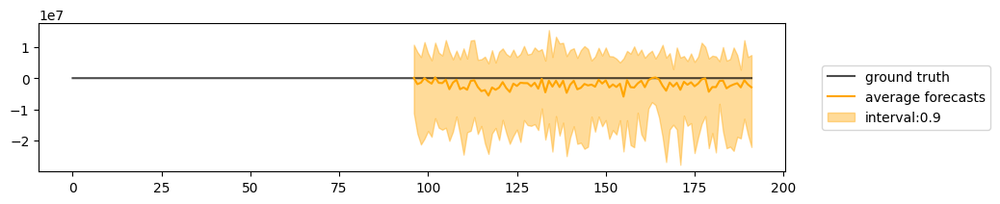

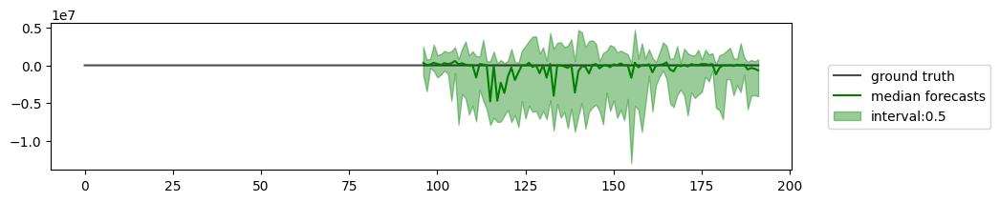

15


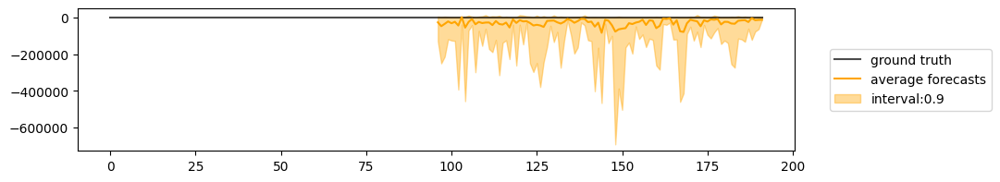

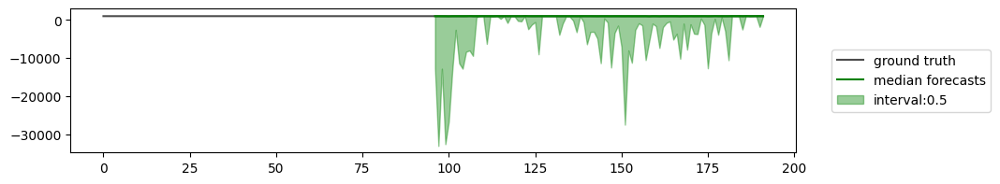

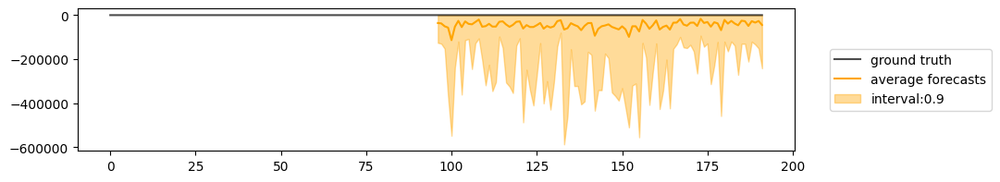

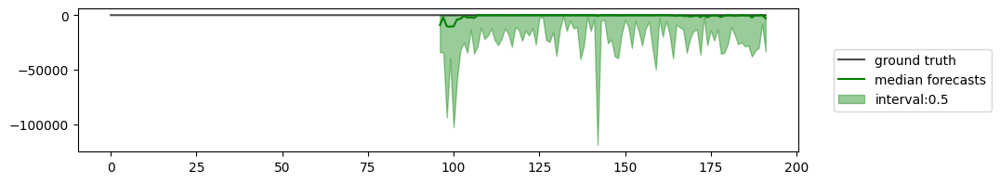

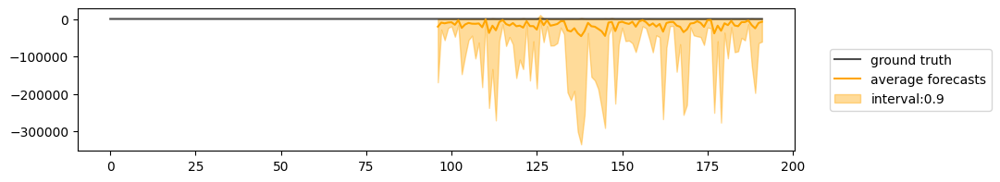

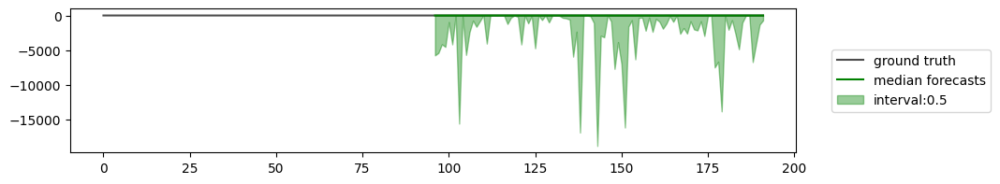

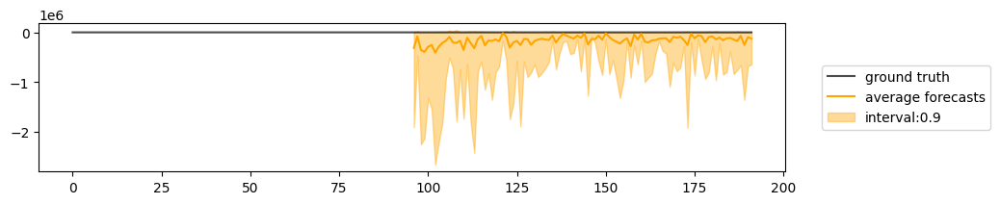

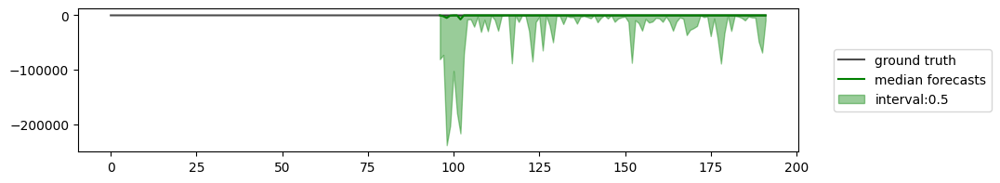

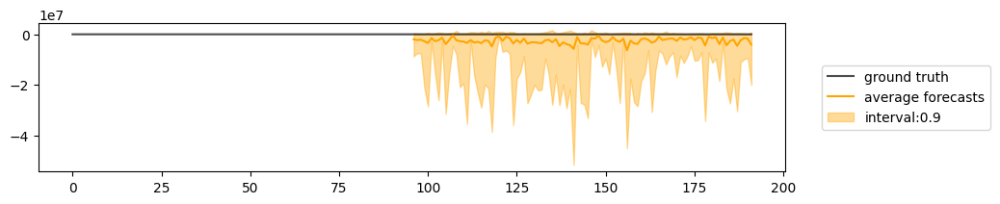

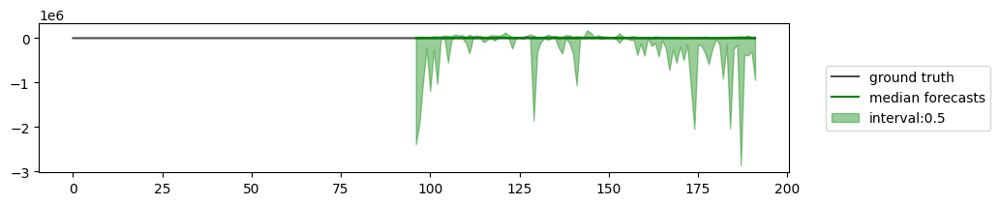

20


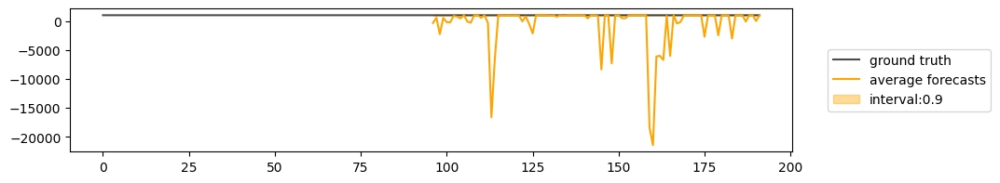

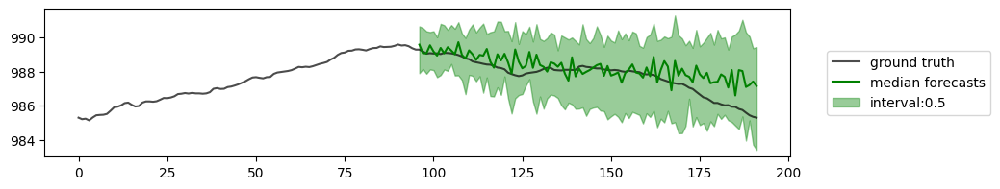

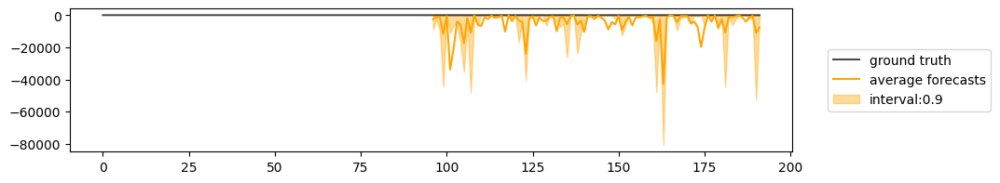

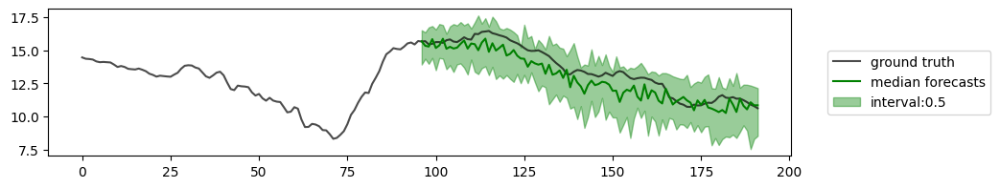

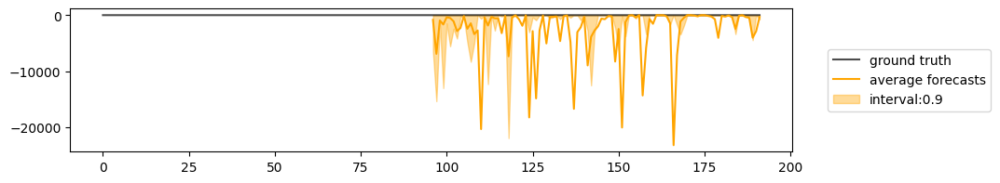

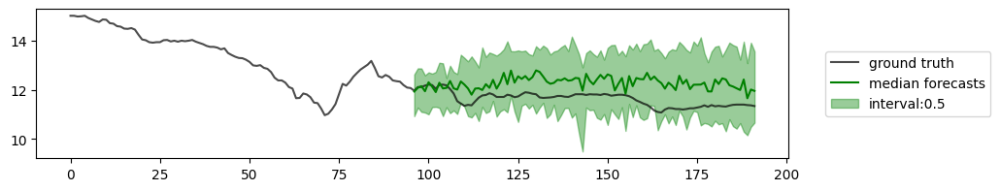

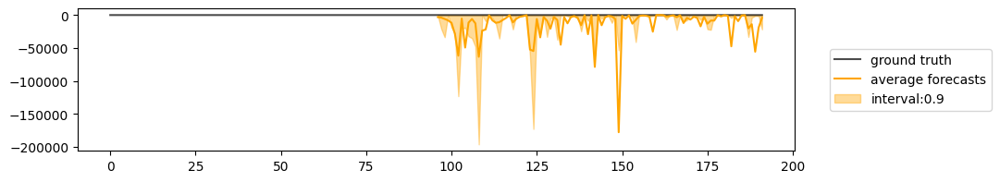

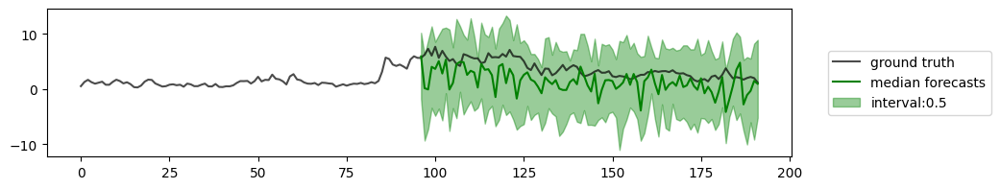

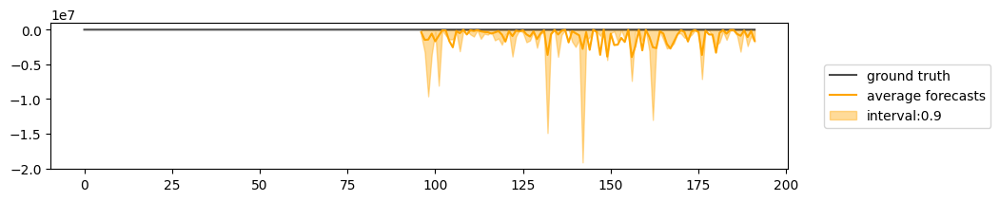

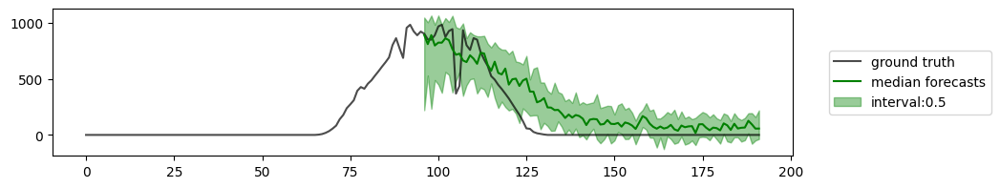

30


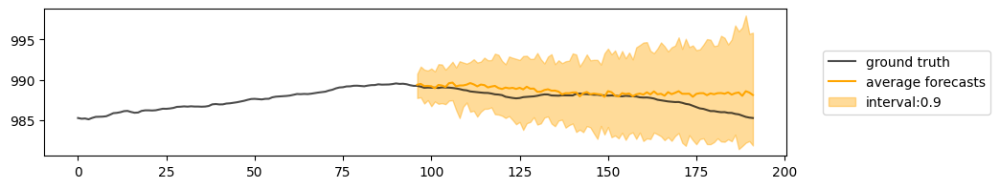

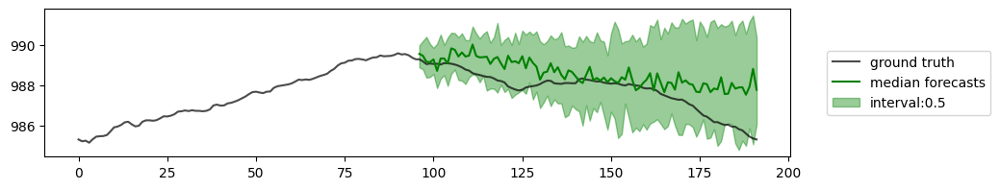

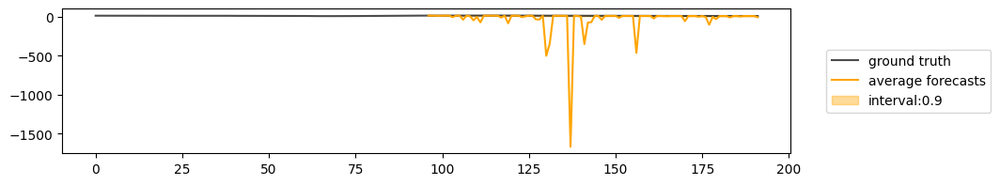

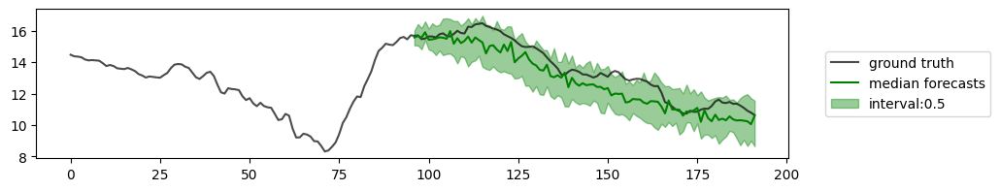

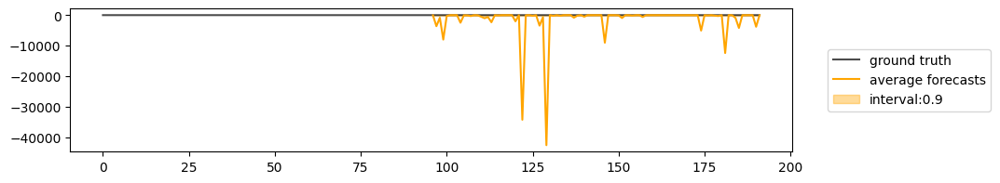

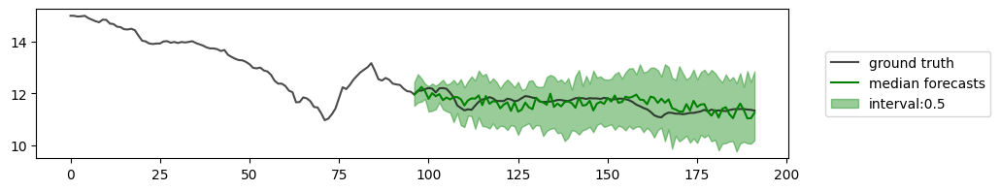

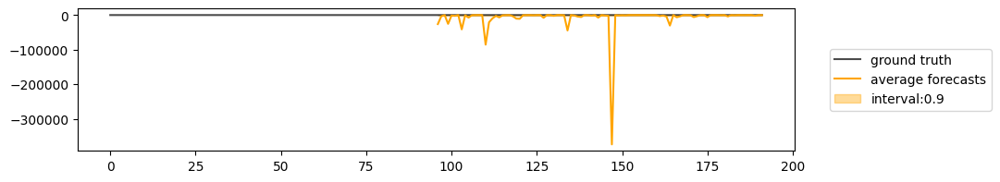

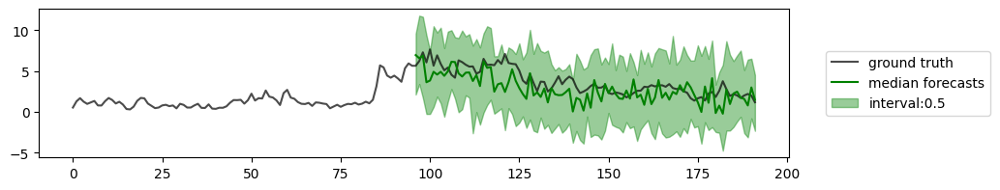

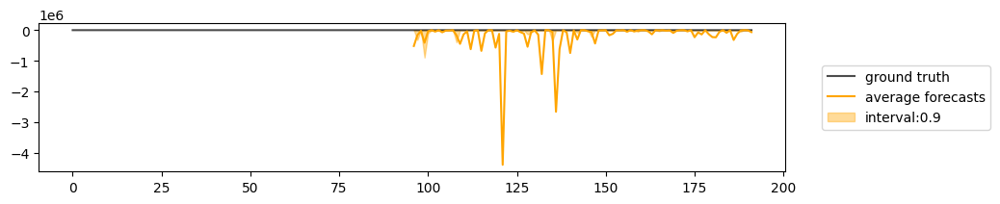

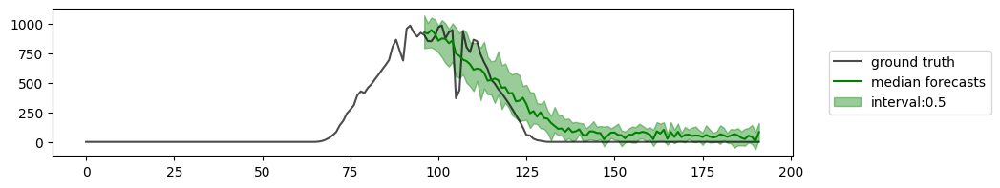

50


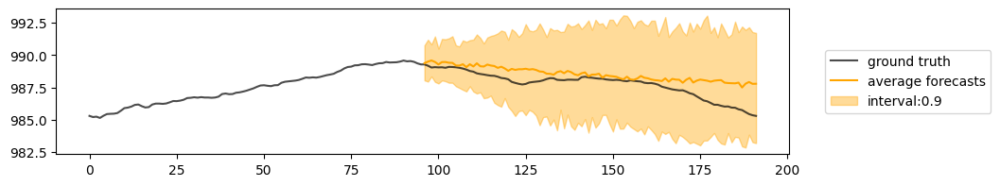

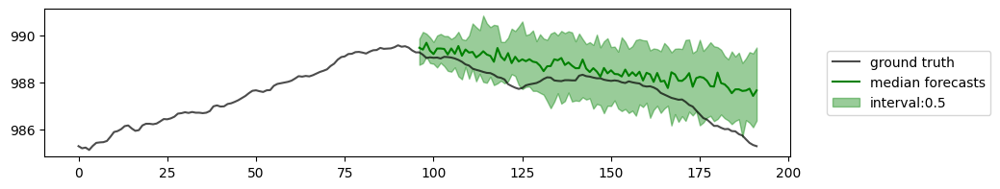

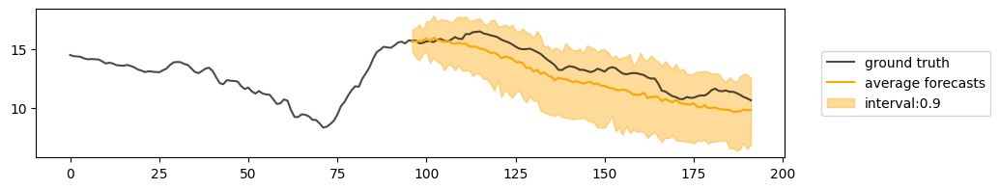

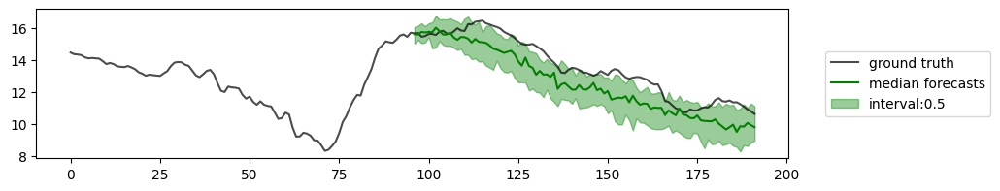

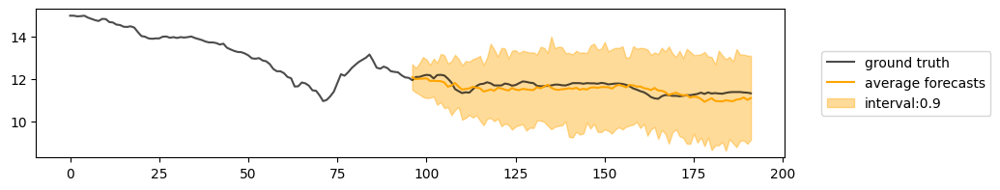

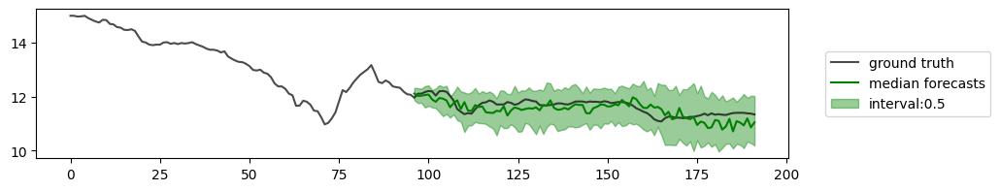

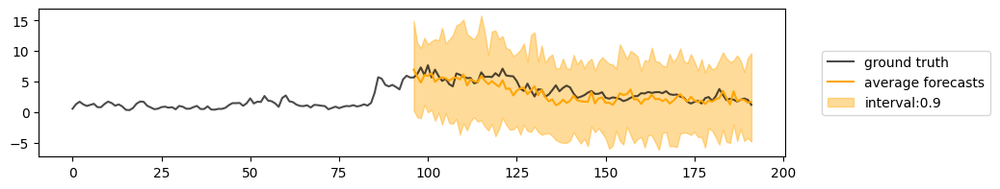

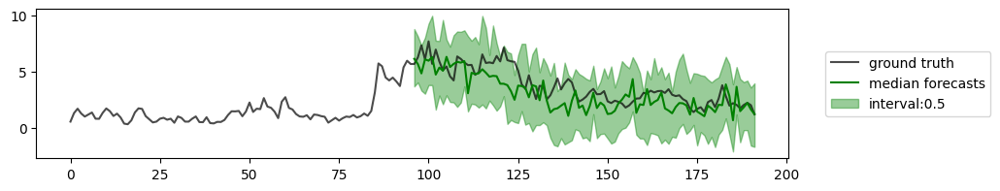

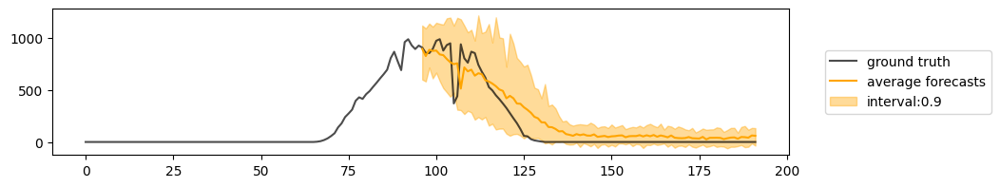

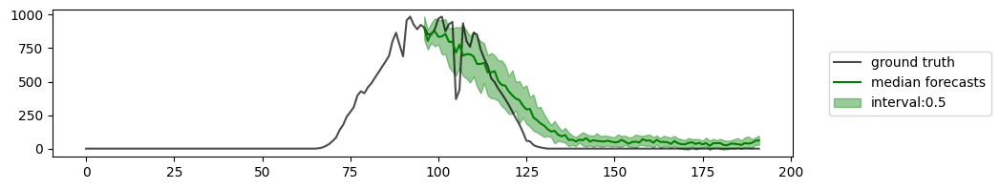

100


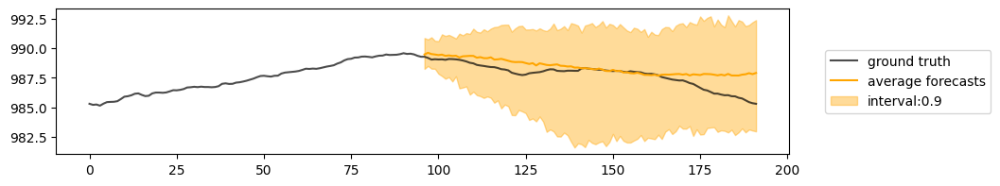

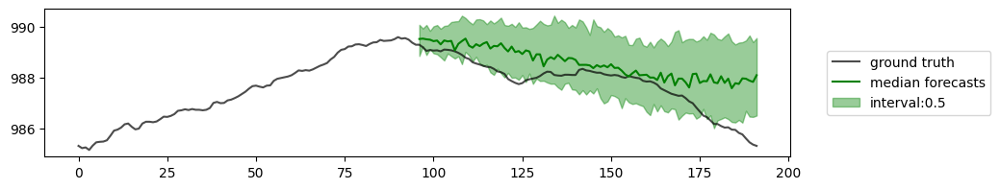

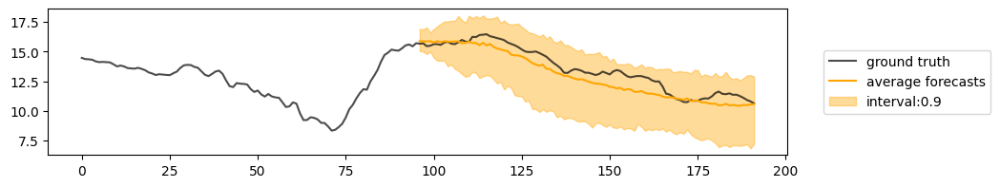

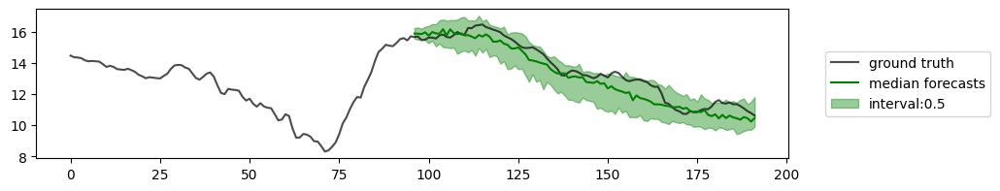

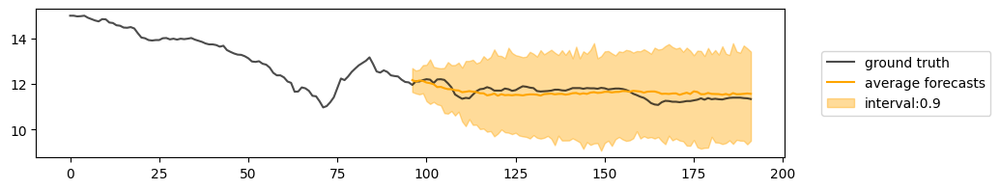

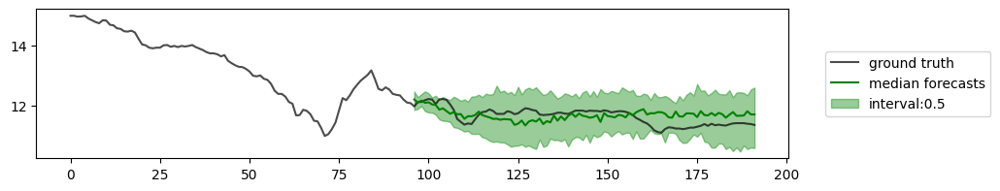

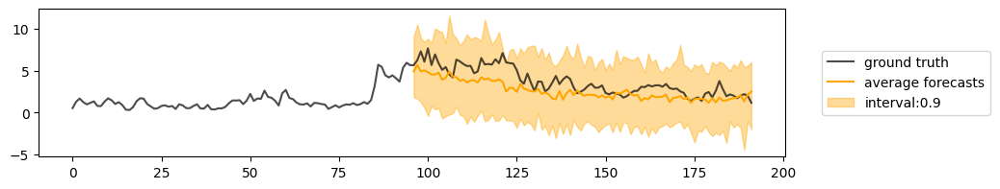

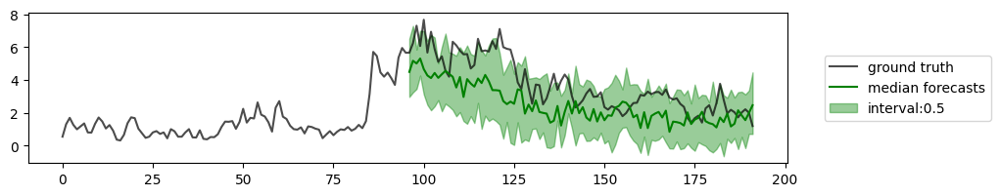

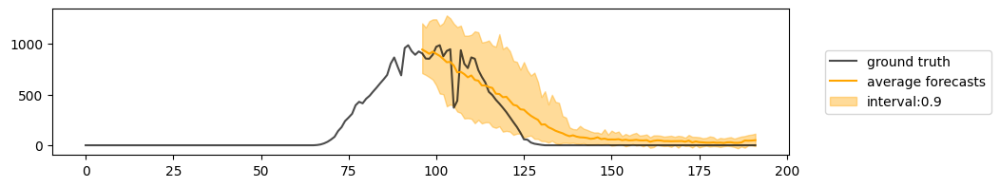

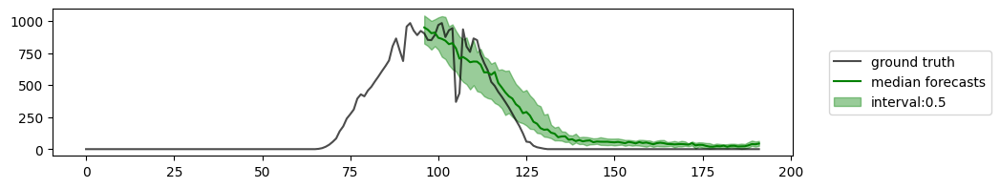

In [48]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96)
    plt.show()

### DDIM, quad

In [49]:
model.forecaster.solver = 'ddim'
model.forecaster.solver_schedule = 'quad'

for batch in test_dataloader:
    break

In [50]:
ddim_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    ddim_time.append(time_for_forecast(batch, model, n_repeats=1))
ddim_time

100%|██████████| 6/6 [00:01<00:00,  4.23it/s]


[0.06176161766052246,
 0.08821845054626465,
 0.12024140357971191,
 0.18413376808166504,
 0.3134450912475586,
 0.6334352493286133]

In [51]:
ddim_quad_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:36<03:04, 36.96s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           49.36538314819336
    96_test_CRPS-Sum         73.67852020263672
      96_test_MASE            16853.091796875
       96_test_MSE             3461256448.0
     96_test_MSE-Sum          256360611840.0
       96_test_ND            53.4776496887207
     96_test_ND-Sum          91.1997299194336
      96_test_NRMSE         347.40582275390625
    96_test_NRMSE-Sum        141.0012969970703
   96_test_weighted_ND       53.4776496887207
 96_test_weighted_ND-Sum     91.1997299194336
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [01:24<02:53, 43.39s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          3.0178403854370117
    96_test_CRPS-Sum         6.161147594451904
      96_test_MASE            1702.9248046875
       96_test_MSE              392110624.0
     96_test_MSE-Sum           12967350272.0
       96_test_ND           2.9289941787719727
     96_test_ND-Sum          6.962484359741211
      96_test_NRMSE         111.74744415283203
    96_test_NRMSE-Sum       30.880659103393555
   96_test_weighted_ND      2.9289941787719727
 96_test_weighted_ND-Sum     6.962484359741211
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [02:23<02:31, 50.39s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.8590007424354553
    96_test_CRPS-Sum        1.7675896883010864
      96_test_MASE           605.4586181640625
       96_test_MSE              171605088.0
     96_test_MSE-Sum           4288023040.0
       96_test_ND           0.8116987943649292
     96_test_ND-Sum         1.8709694147109985
      96_test_NRMSE          69.16242980957031
    96_test_NRMSE-Sum       16.847660064697266
   96_test_weighted_ND      0.8116987943649292
 96_test_weighted_ND-Sum    1.8709694147109985
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [03:43<02:04, 62.17s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2576609253883362
    96_test_CRPS-Sum        0.4831607937812805
      96_test_MASE          183.68963623046875
       96_test_MSE              222553552.0
     96_test_MSE-Sum           4847094784.0
       96_test_ND           0.26180708408355713
     96_test_ND-Sum         0.45134952664375305
      96_test_NRMSE          68.4392318725586
    96_test_NRMSE-Sum       15.370321273803711
   96_test_weighted_ND      0.26180708408355713
 96_test_weighted_ND-Sum    0.45134952664375305
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [05:47<01:24, 84.46s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.15390445291996002
    96_test_CRPS-Sum        0.22253680229187012
      96_test_MASE           95.75994873046875
       96_test_MSE              113642008.0
     96_test_MSE-Sum           2461355520.0
       96_test_ND           0.1722998470067978
     96_test_ND-Sum         0.21908298134803772
      96_test_NRMSE           48.61181640625
    96_test_NRMSE-Sum       10.859421730041504
   96_test_weighted_ND      0.1722998470067978
 96_test_weighted_ND-Sum    0.21908298134803772
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [09:40<00:00, 96.81s/it] 

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.10685142874717712
    96_test_CRPS-Sum        0.11452144384384155
      96_test_MASE          52.657894134521484
       96_test_MSE              297534656.0
     96_test_MSE-Sum           6246954496.0
       96_test_ND           0.1263834685087204
     96_test_ND-Sum         0.11414636671543121
      96_test_NRMSE          65.49332427978516
    96_test_NRMSE-Sum       14.294639587402344
   96_test_weighted_ND      0.1263834685087204
 96_test_weighted_ND-Sum    0.11414636671543121
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [52]:
with open("ddim_quad_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_quad_metrics, fp)

10


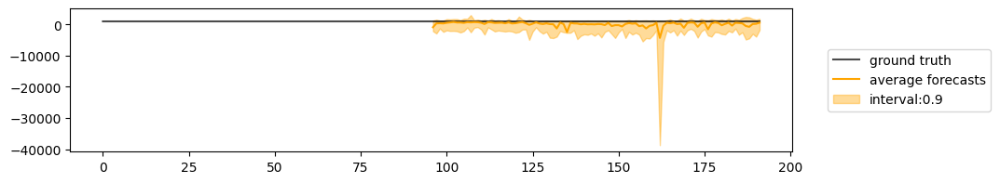

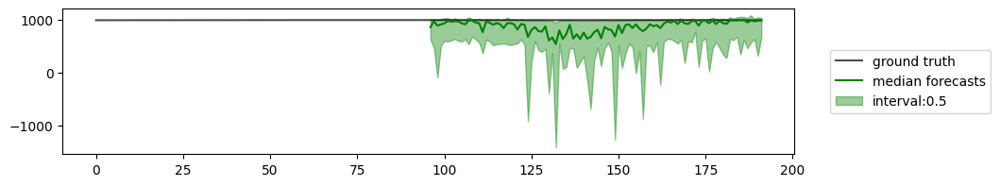

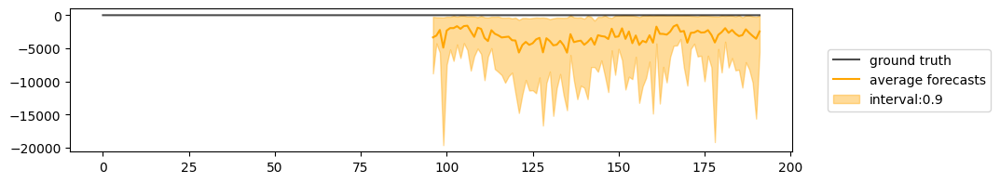

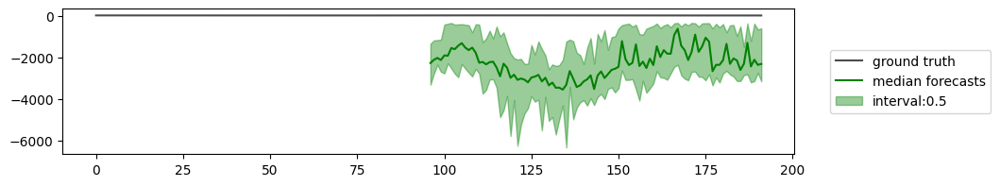

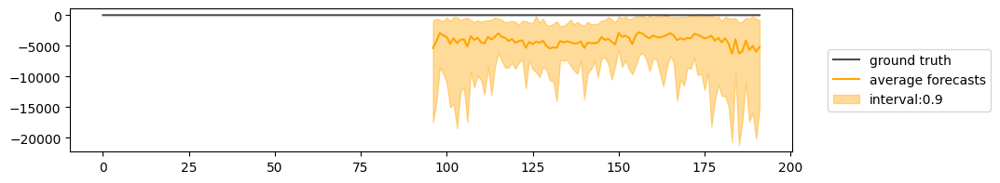

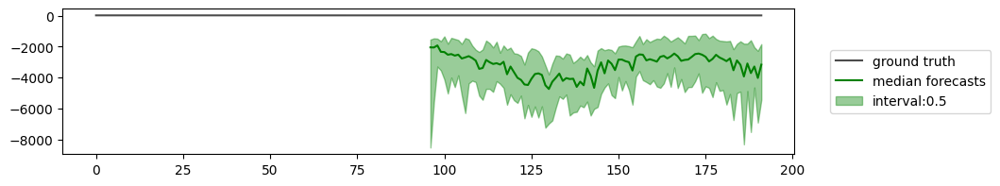

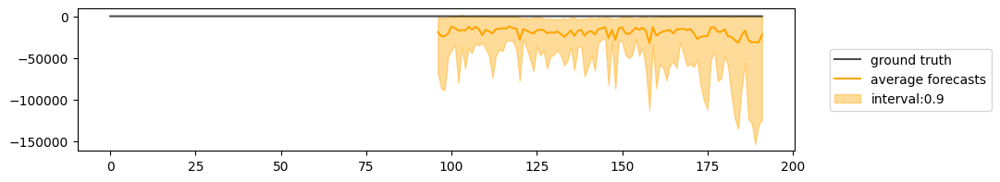

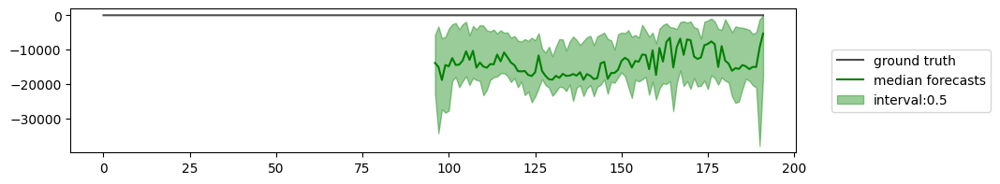

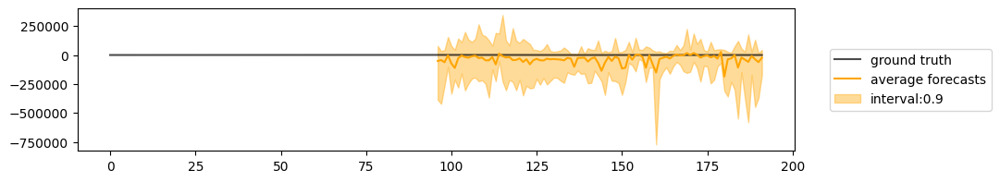

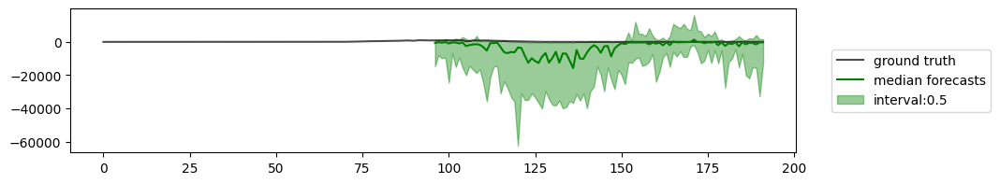

15


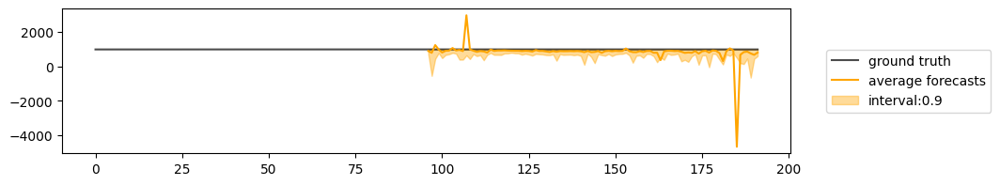

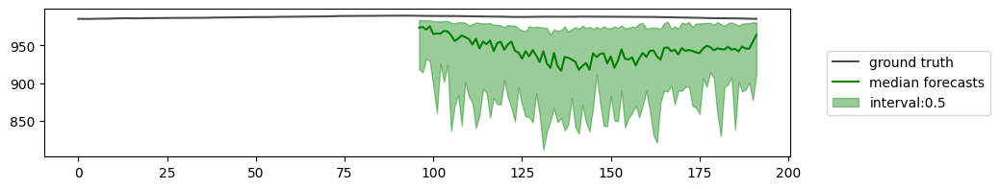

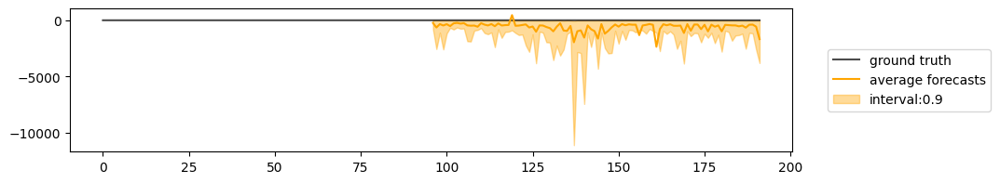

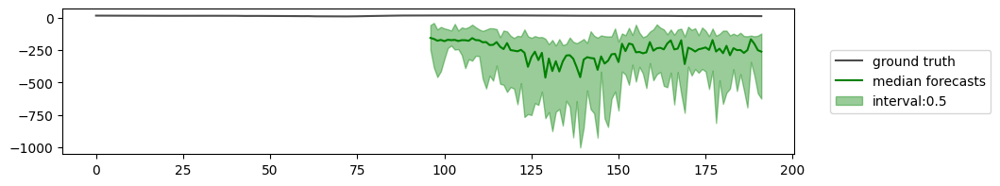

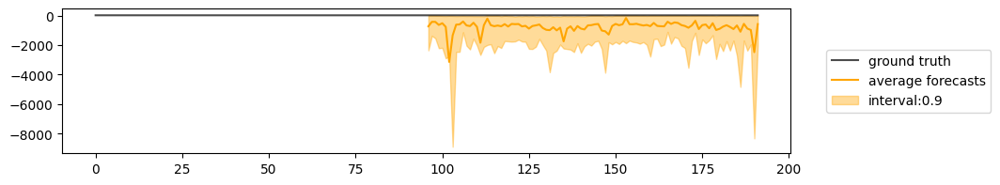

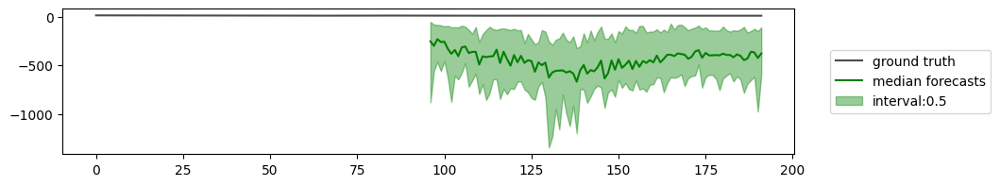

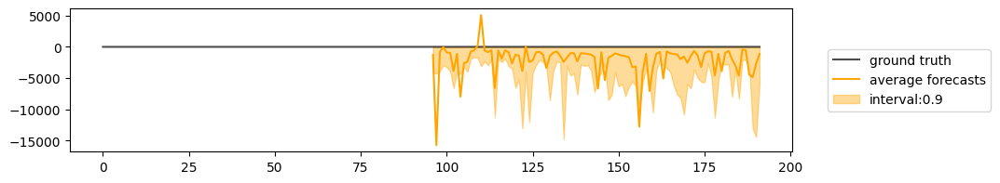

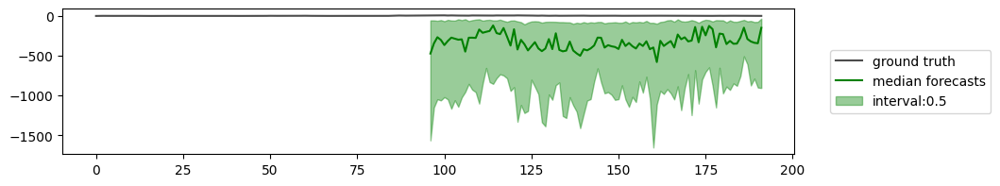

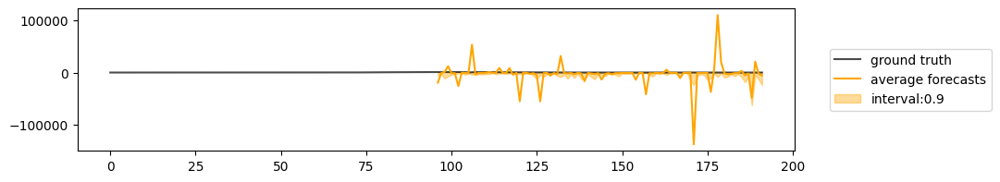

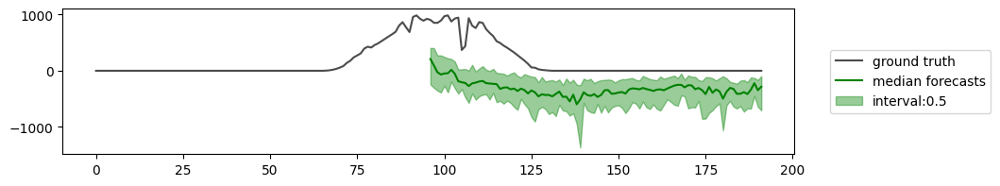

20


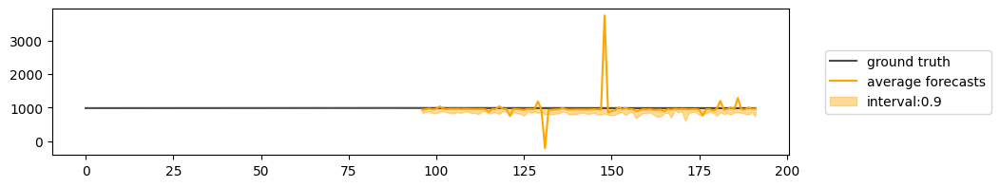

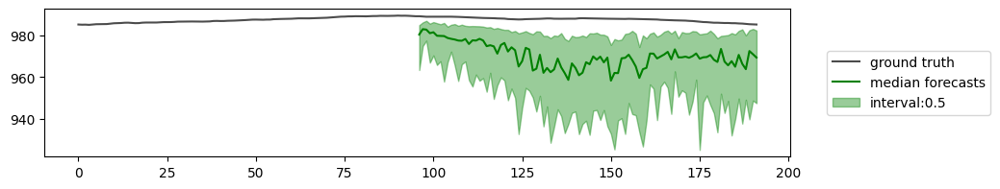

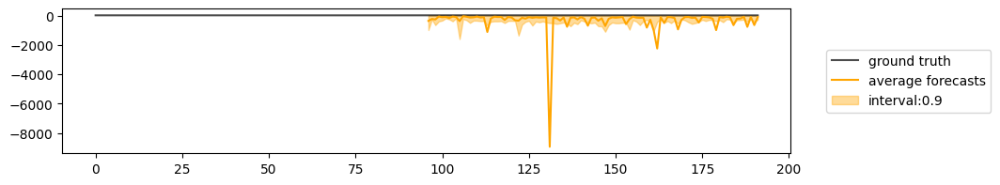

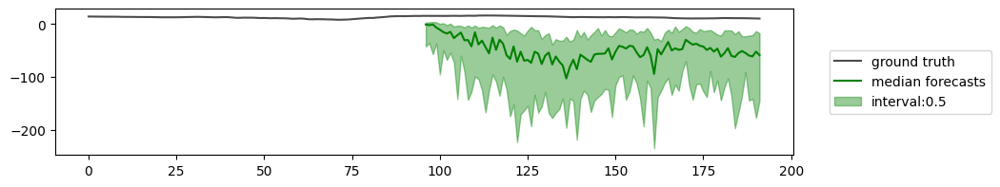

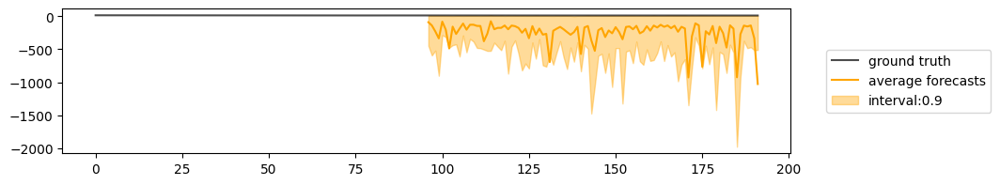

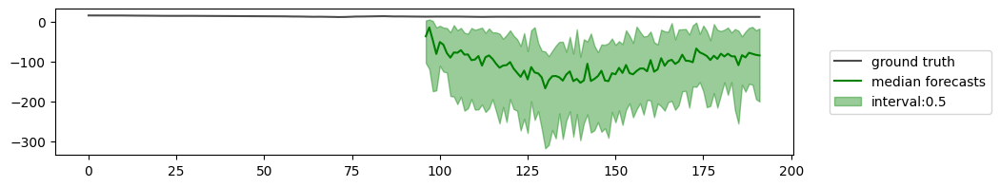

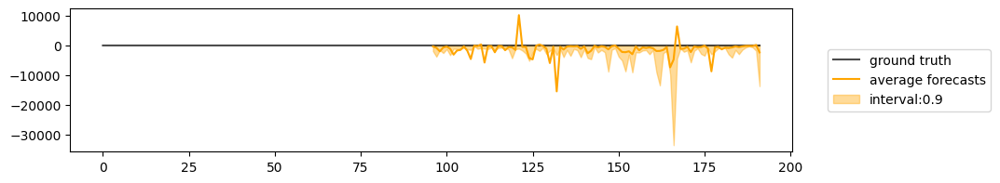

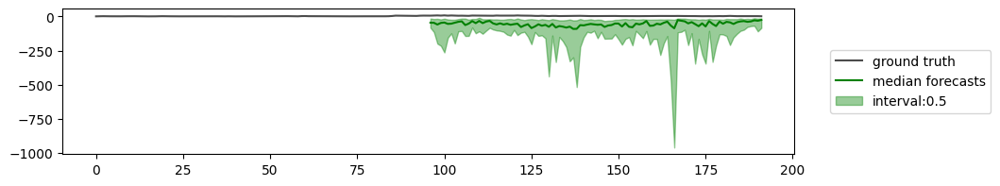

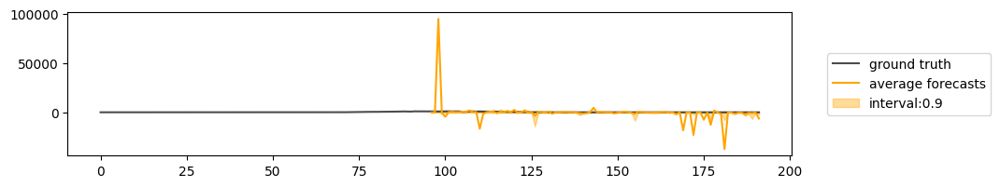

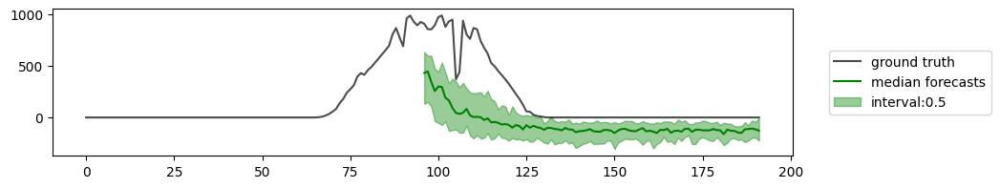

30


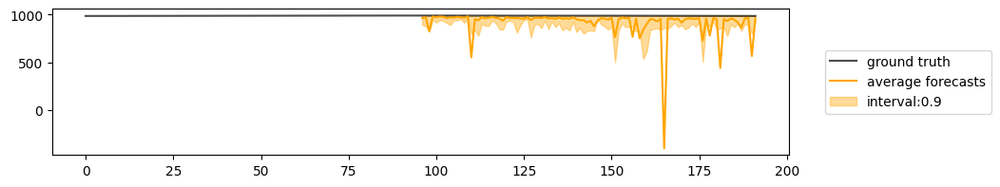

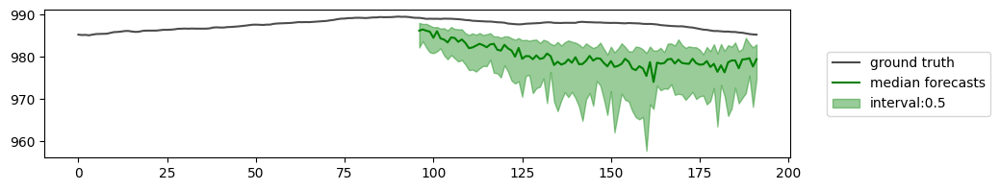

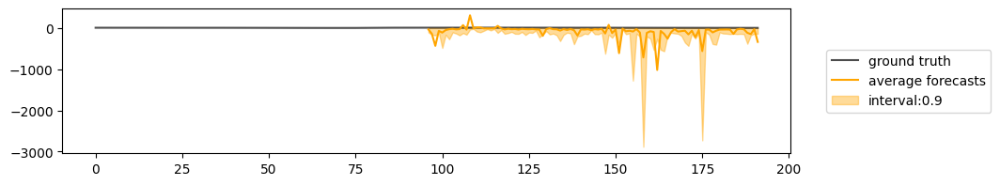

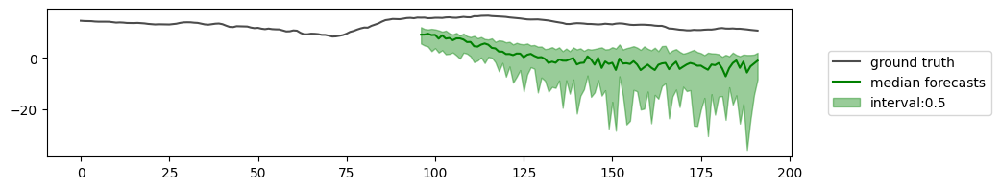

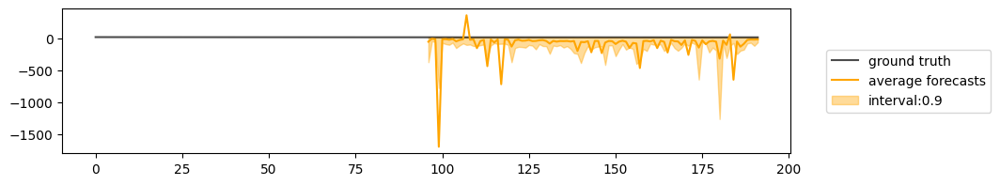

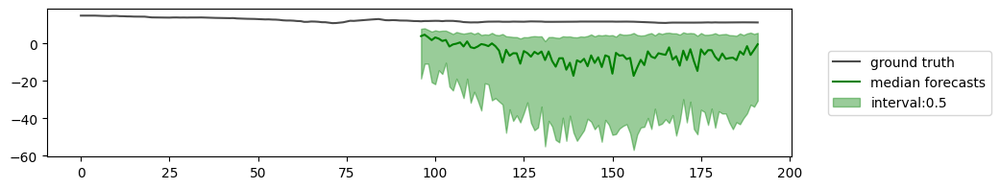

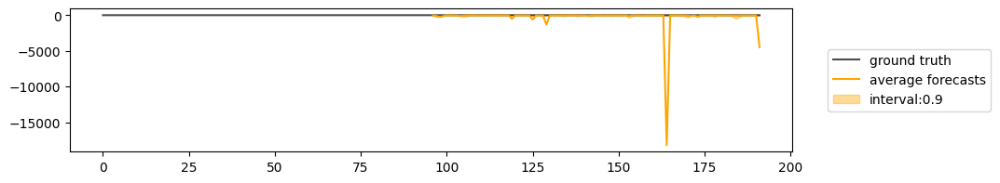

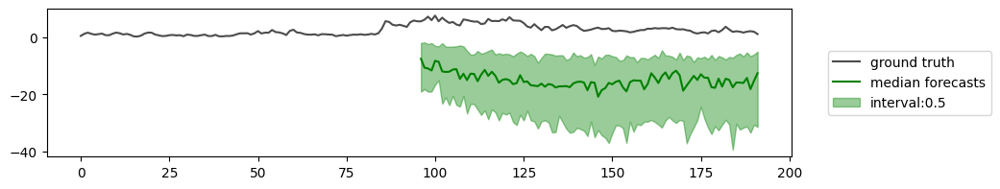

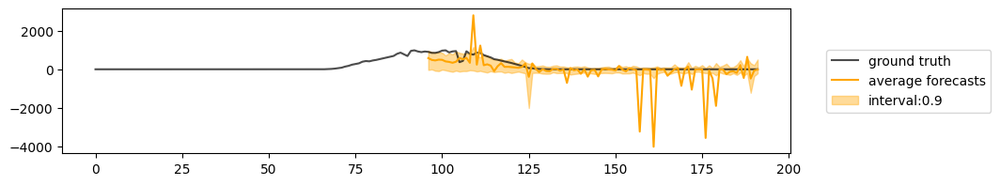

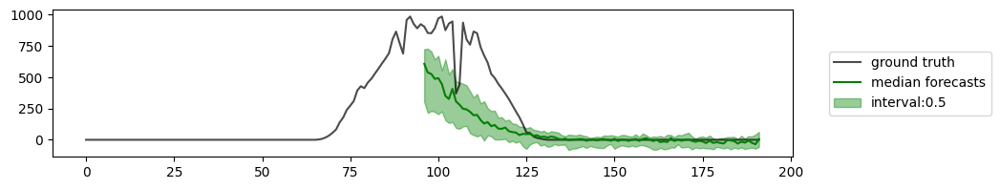

50


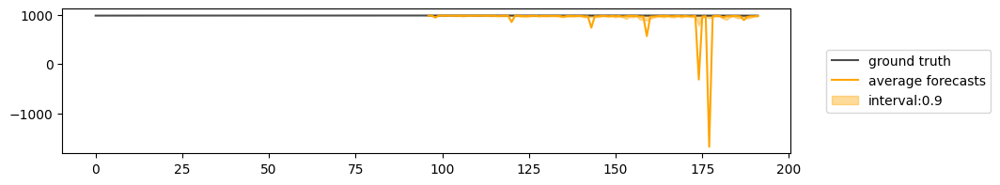

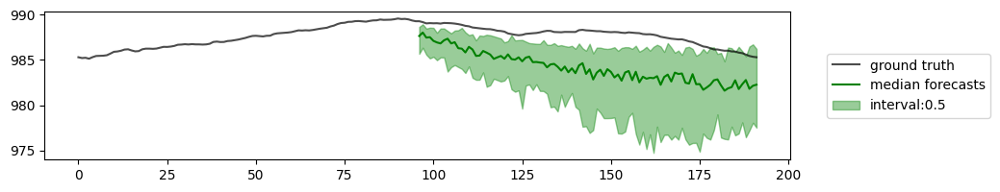

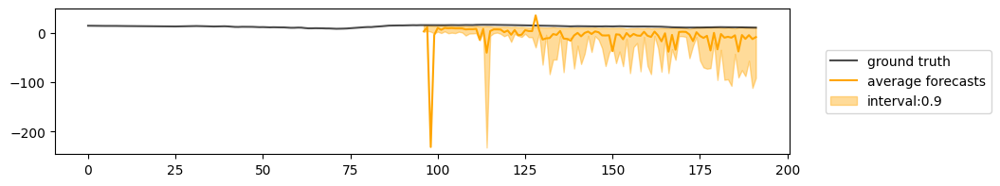

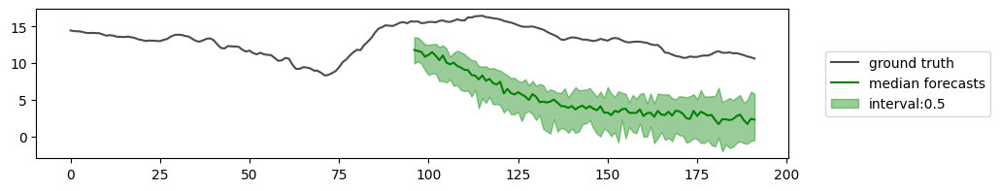

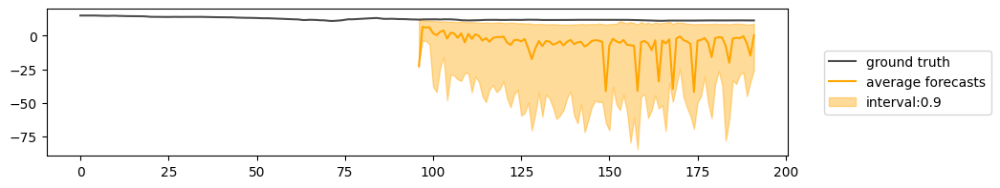

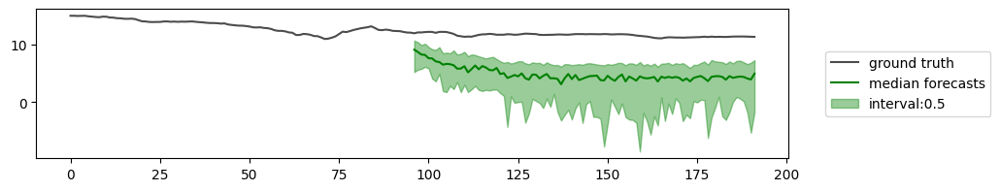

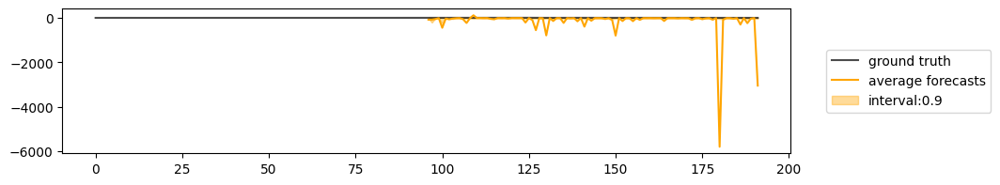

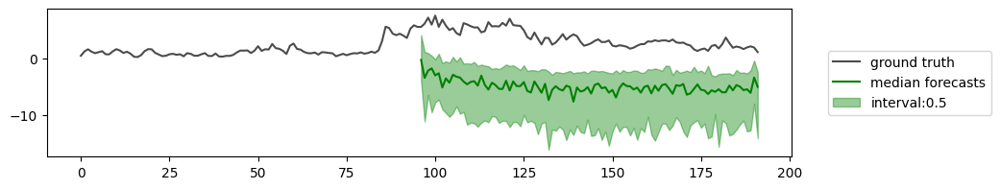

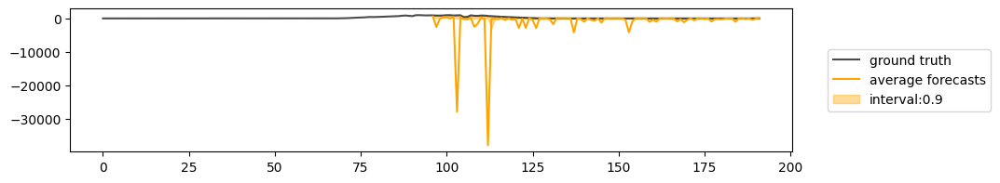

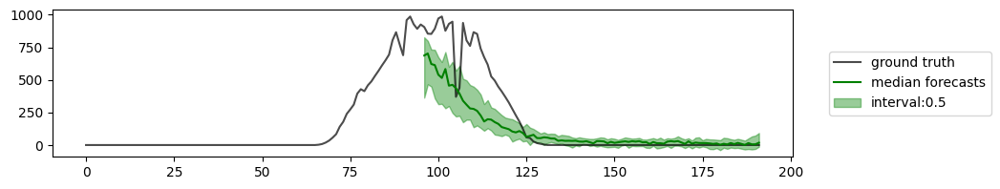

100


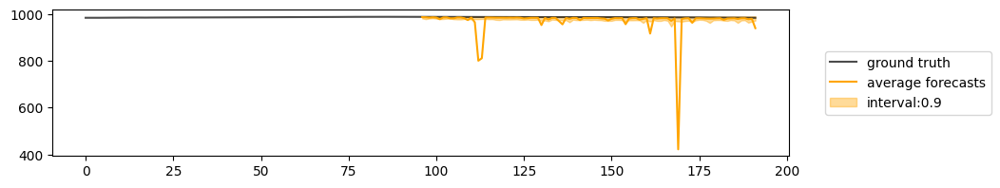

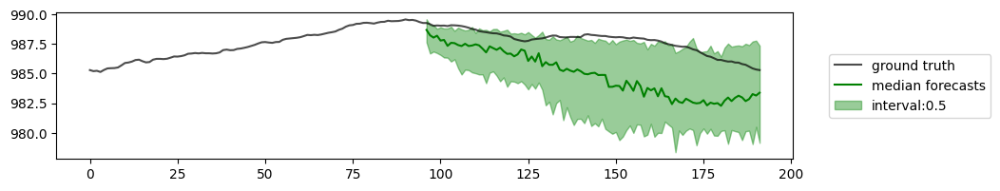

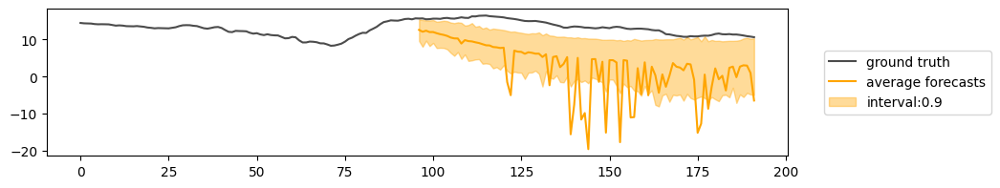

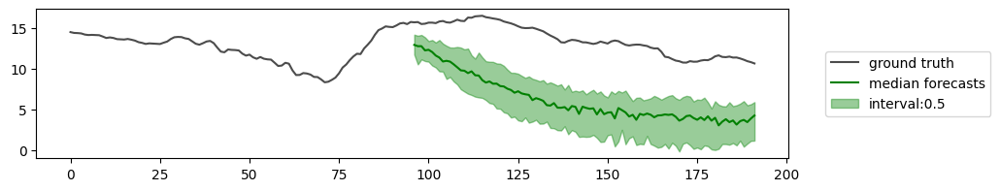

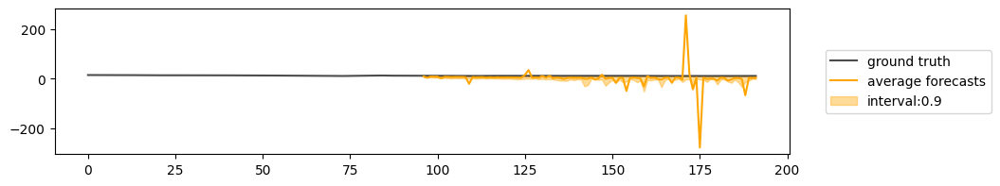

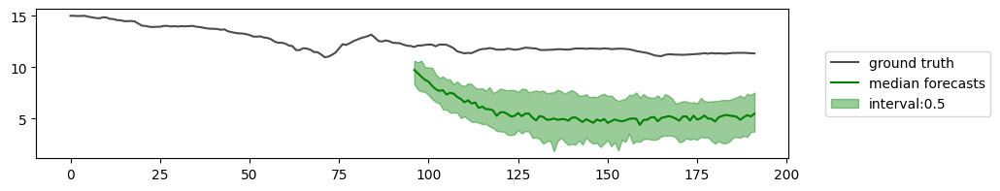

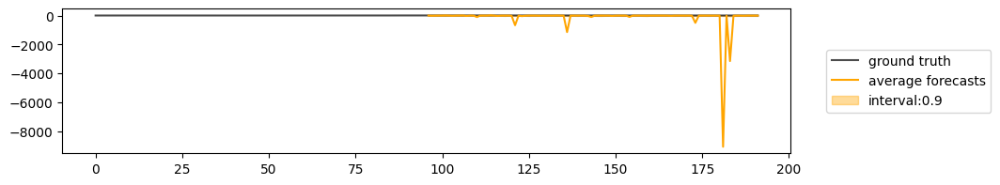

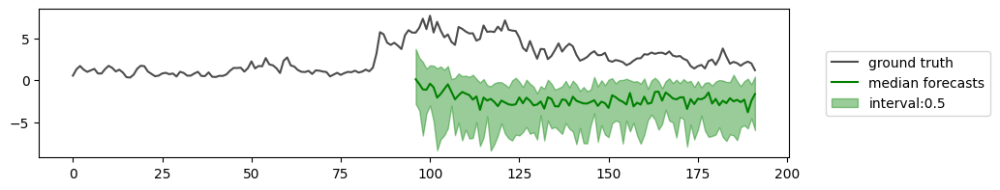

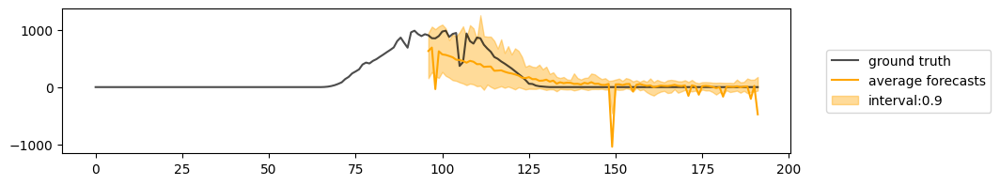

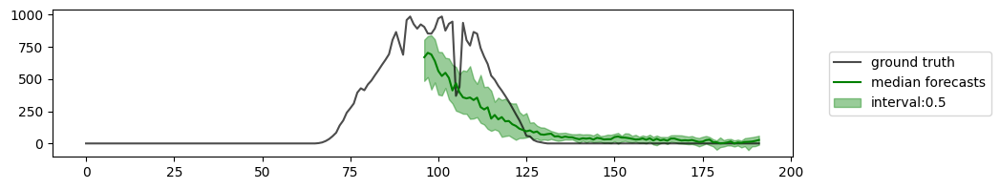

In [53]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96)
    plt.show()

### DDIM, linear

In [29]:
model.forecaster.solver_schedule = 'linear'

10


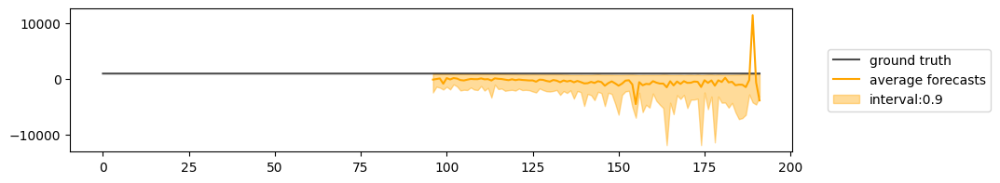

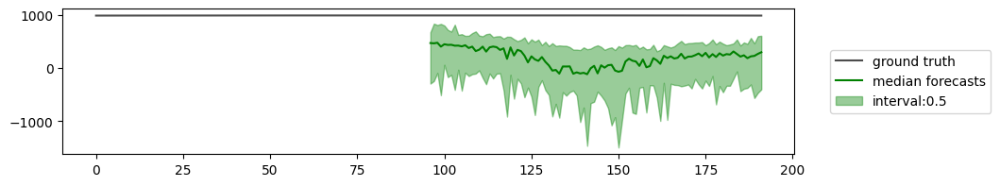

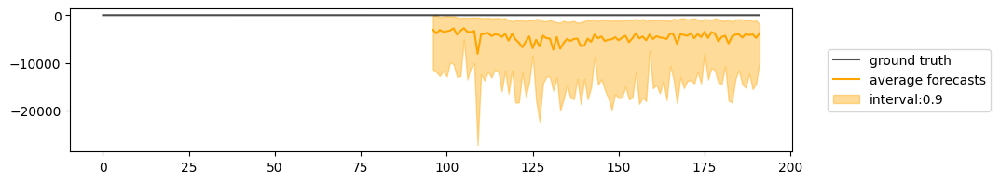

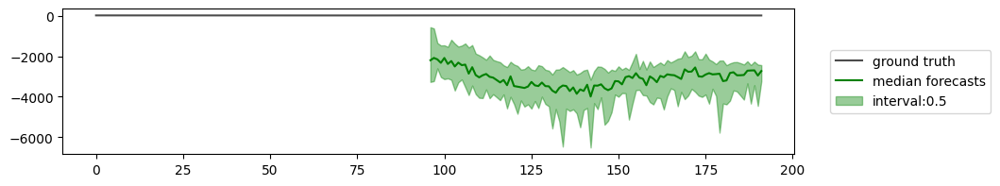

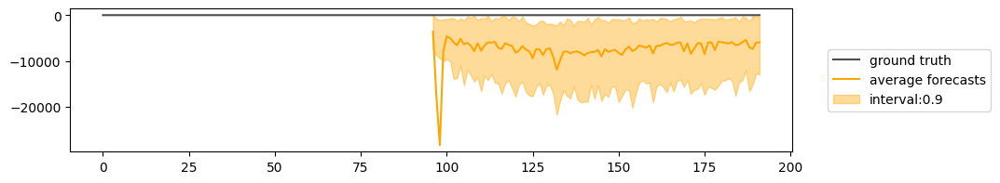

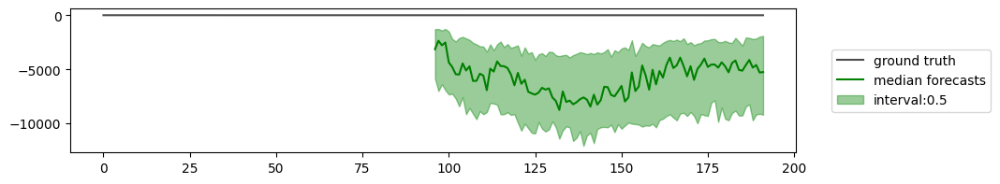

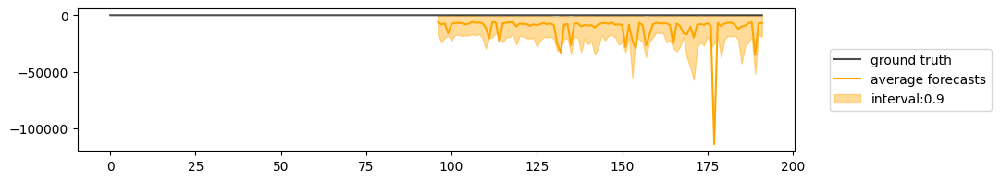

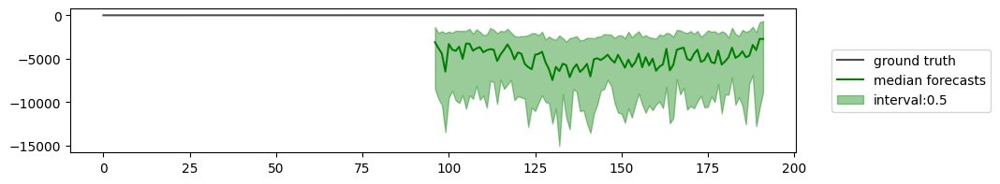

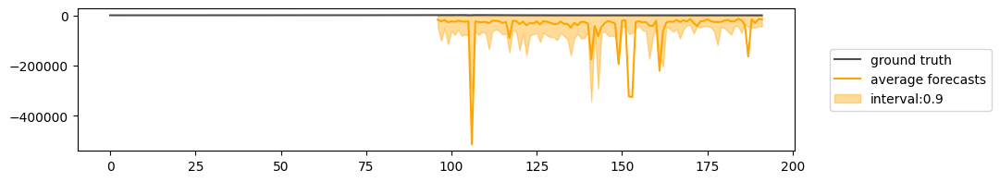

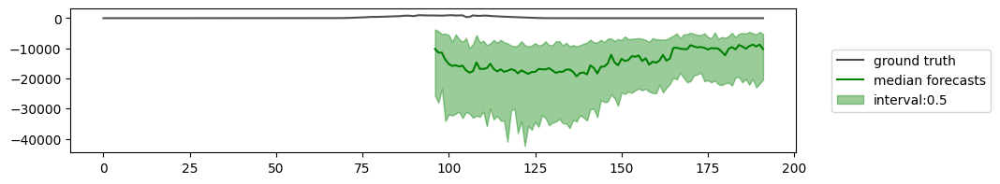

15


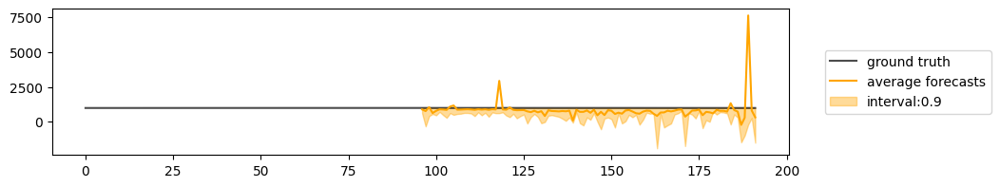

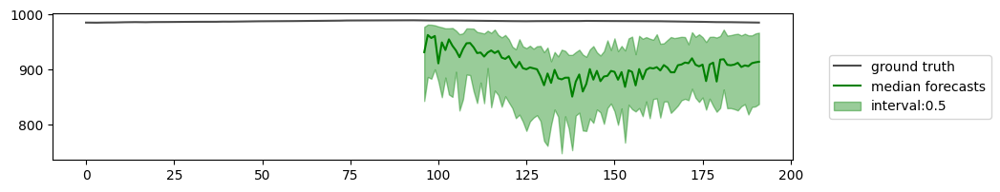

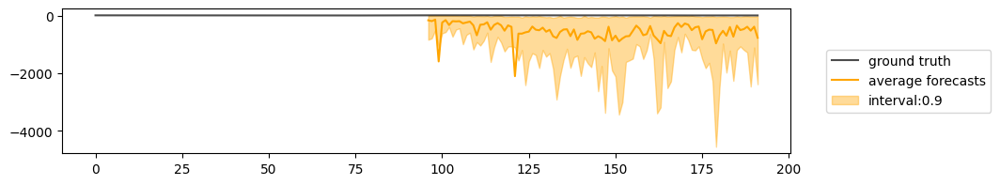

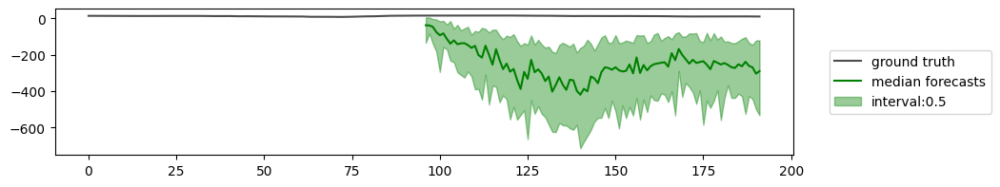

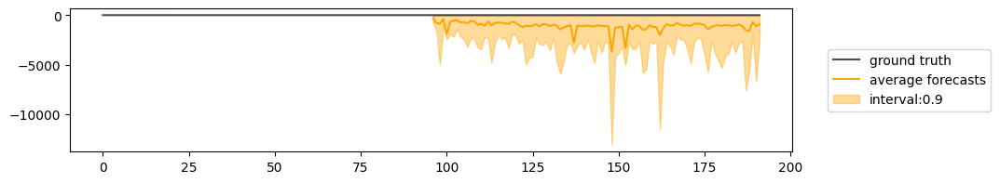

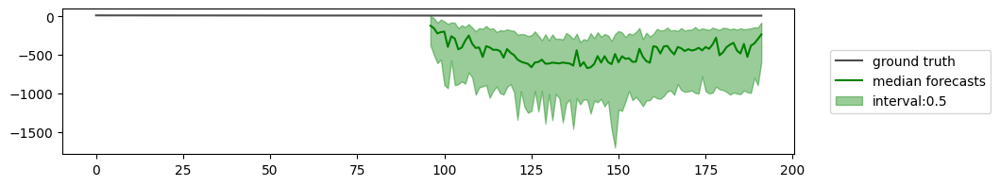

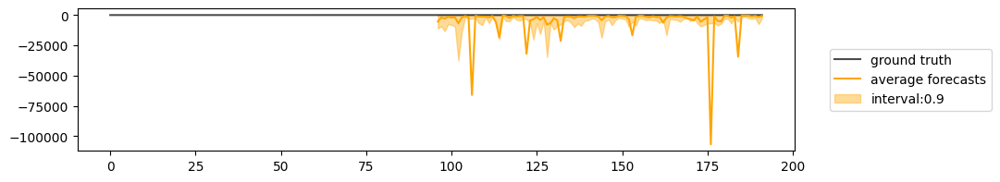

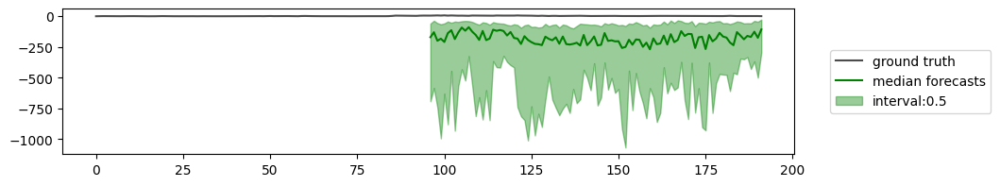

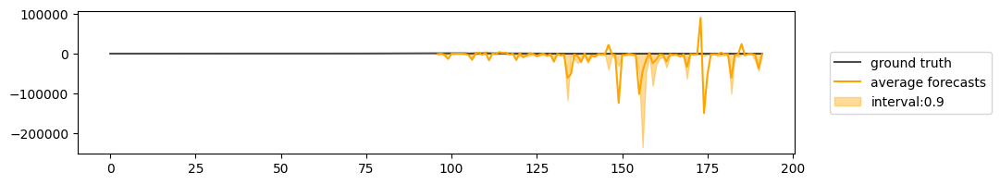

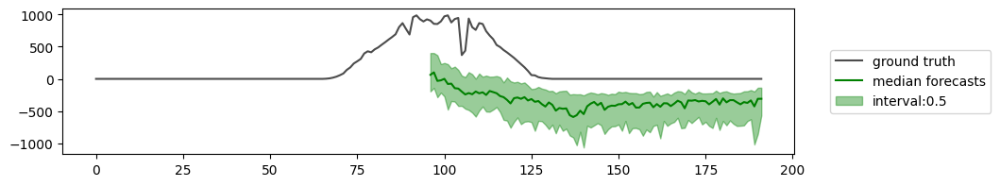

20


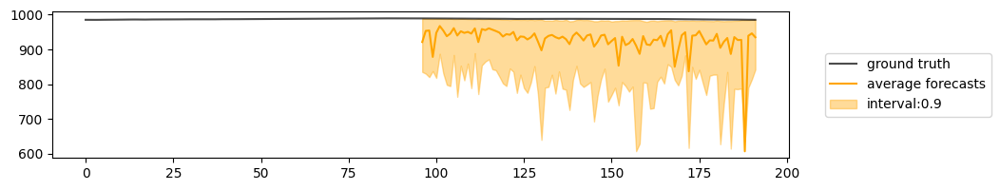

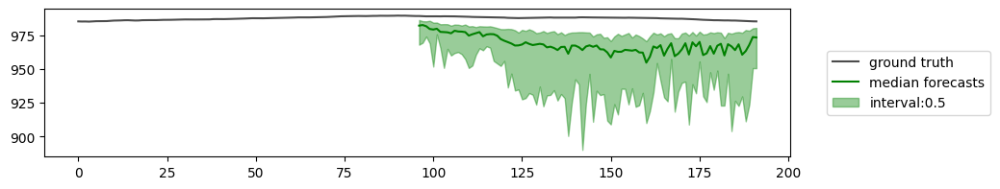

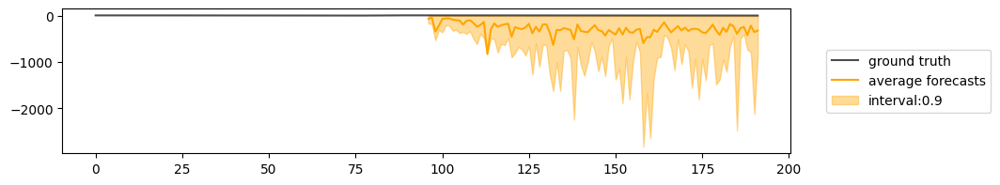

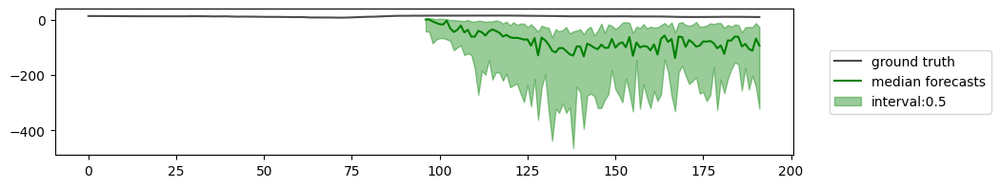

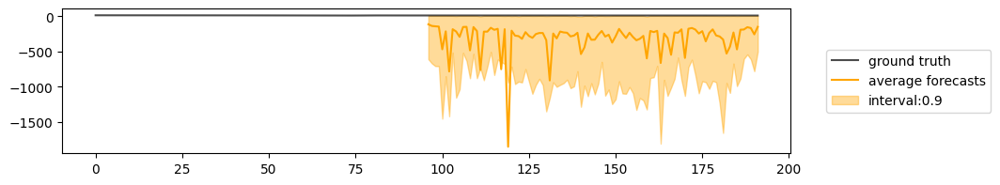

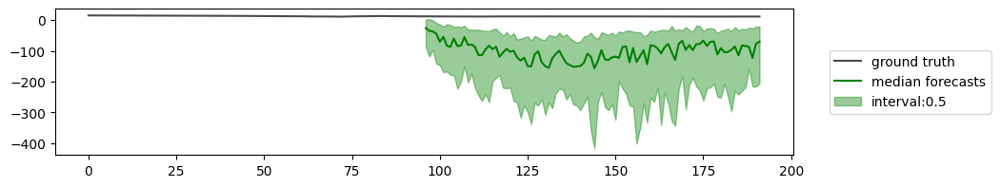

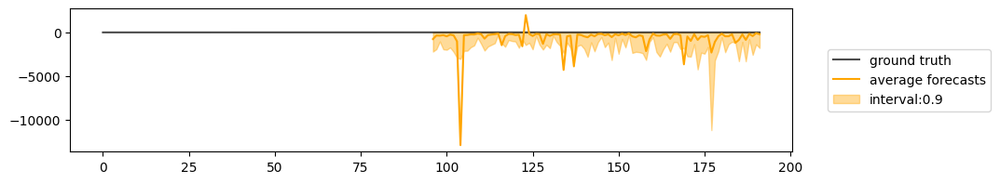

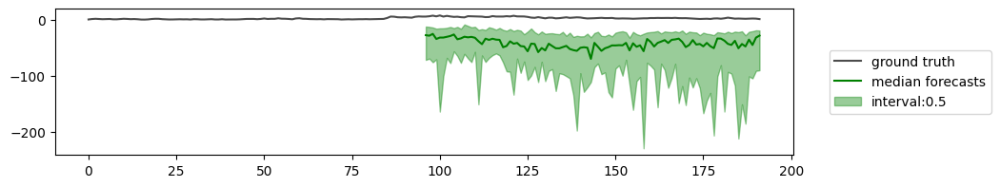

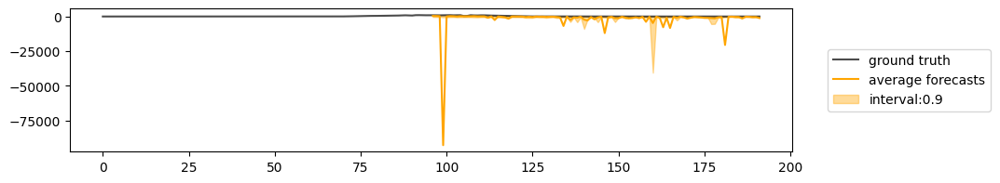

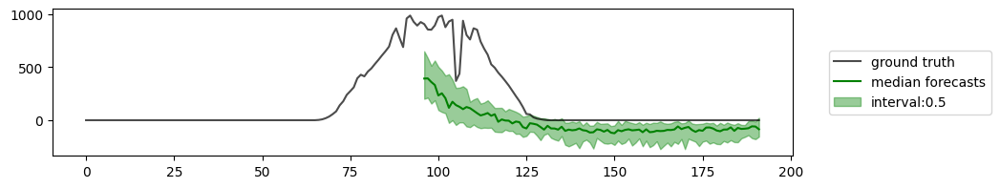

30


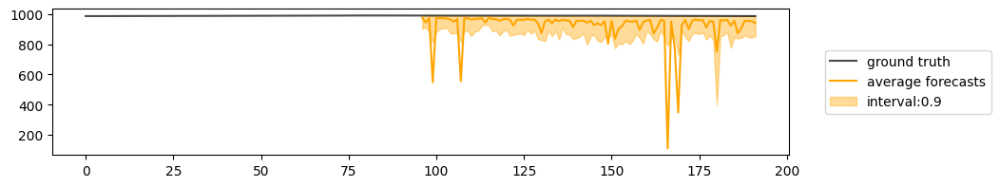

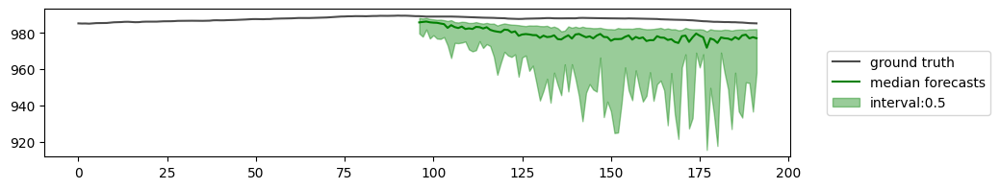

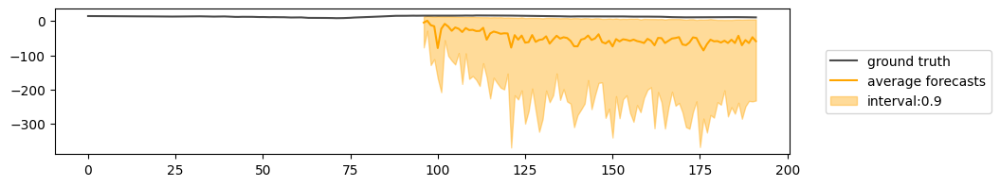

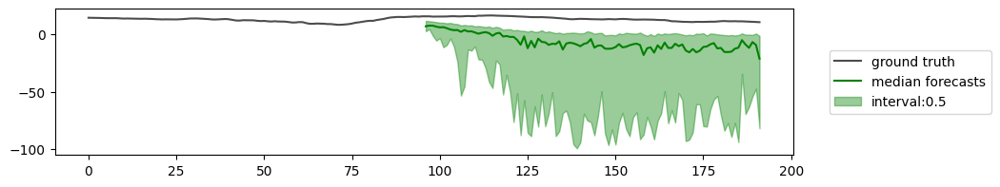

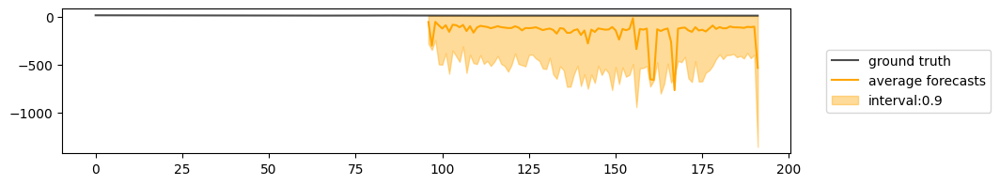

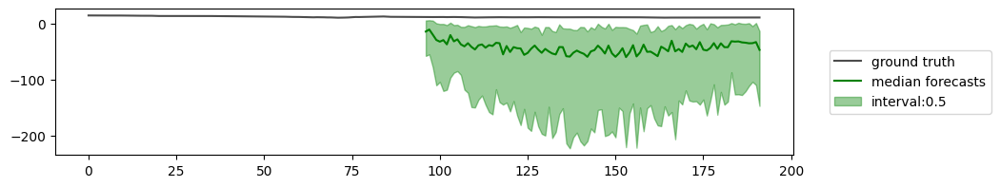

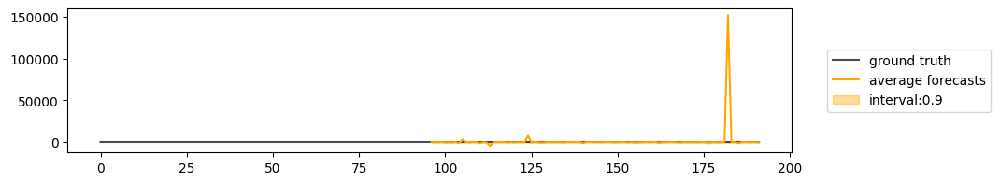

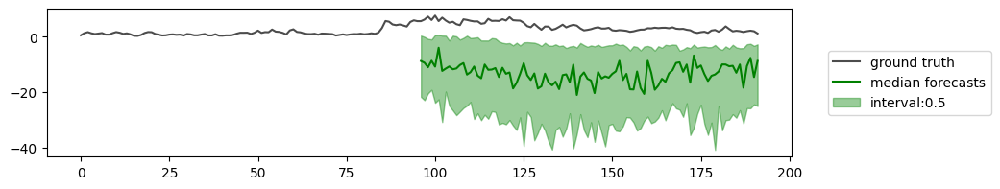

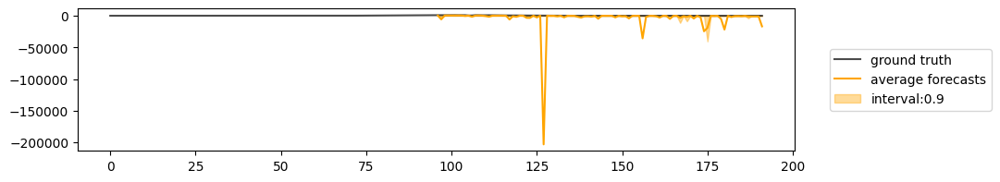

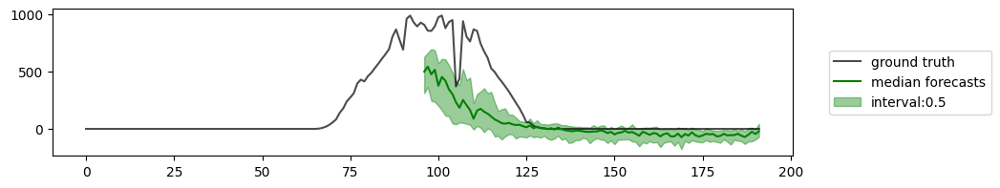

50


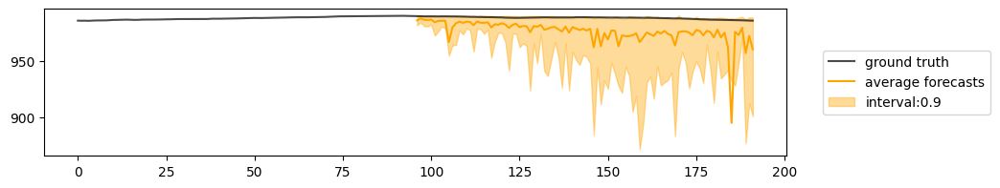

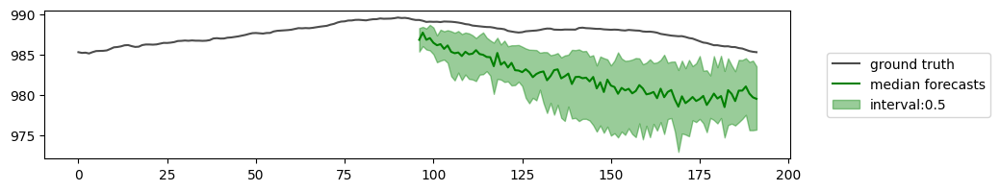

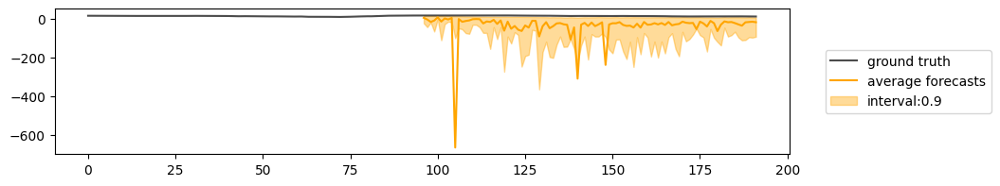

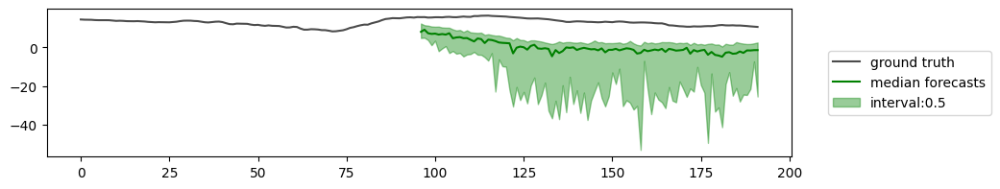

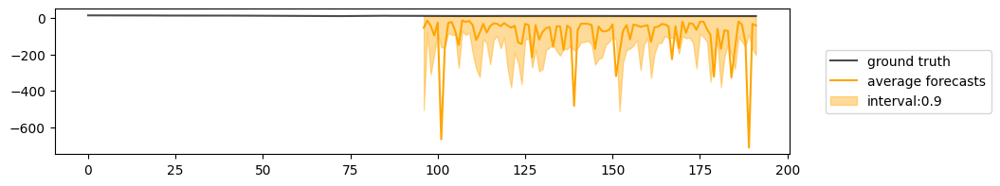

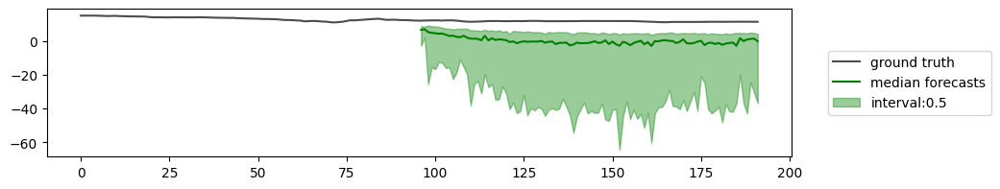

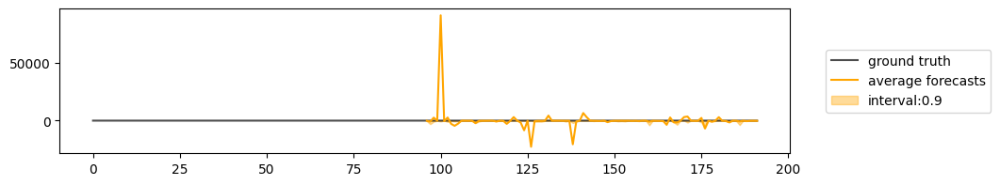

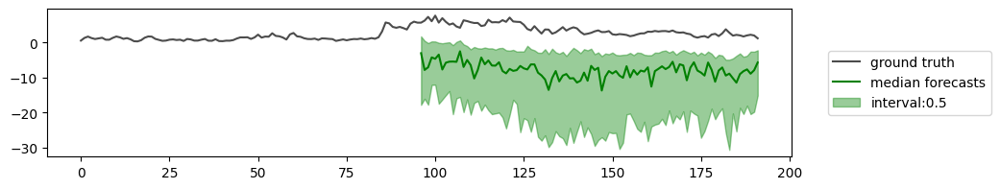

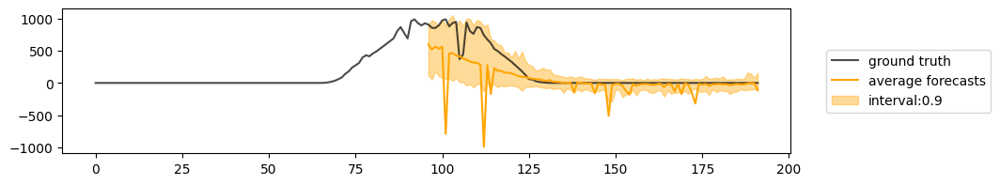

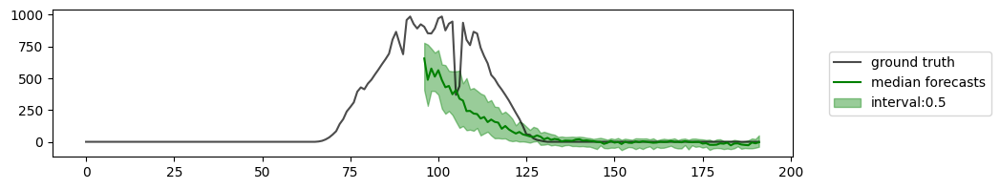

100


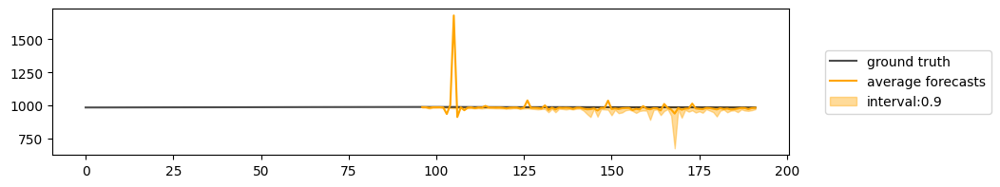

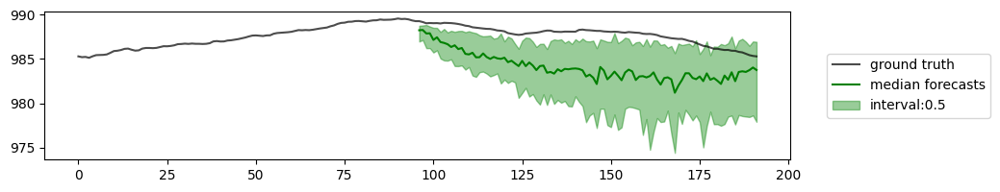

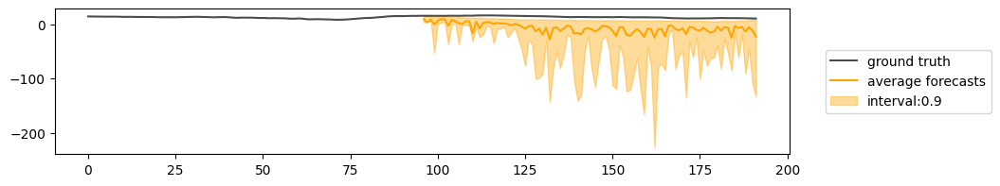

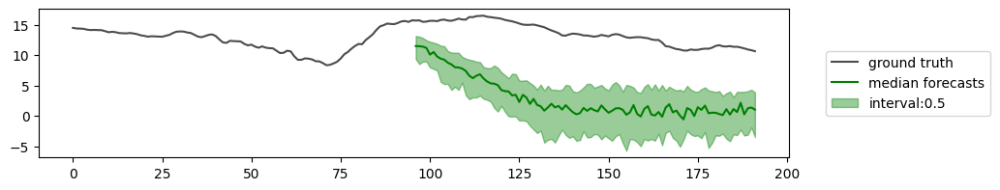

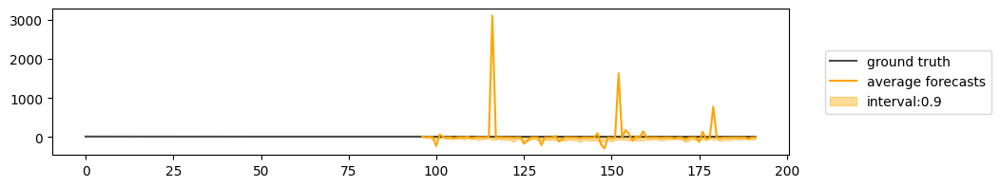

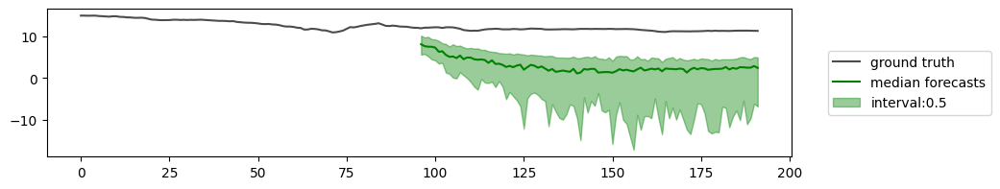

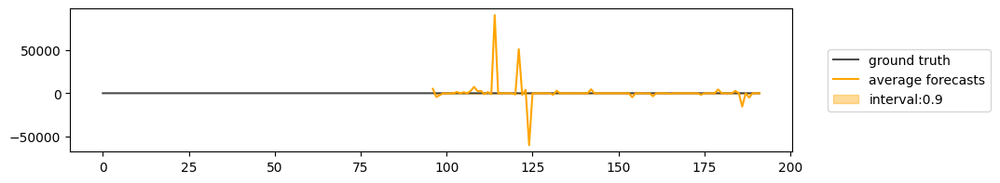

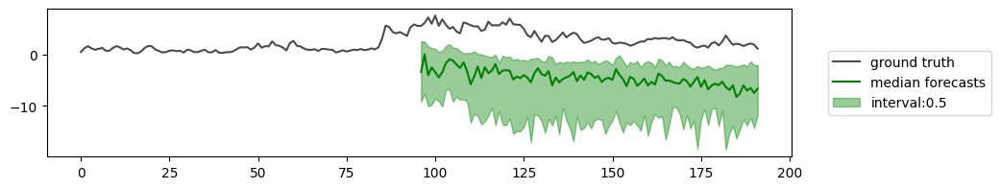

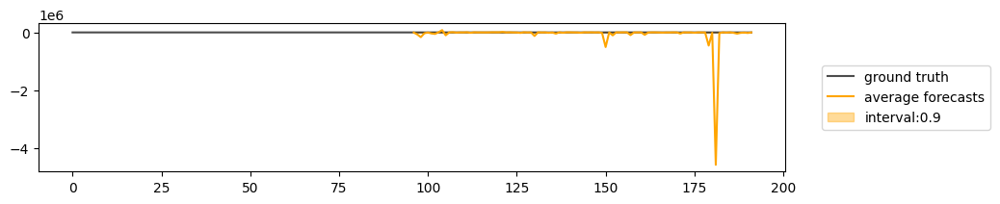

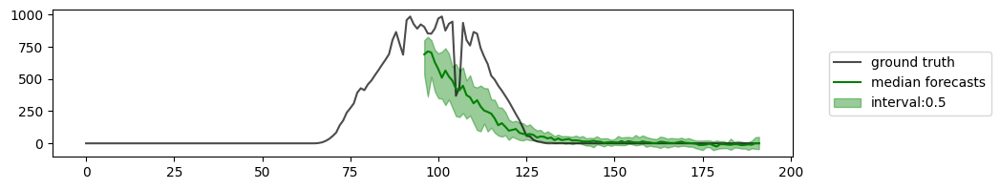

In [54]:
model.forecaster.solver_schedule = 'linear'

for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96)
    plt.show()

In [55]:
ddim_linear_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:37<03:08, 37.68s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           51.06064224243164
    96_test_CRPS-Sum         82.65203857421875
      96_test_MASE            25354.310546875
       96_test_MSE             10094541824.0
     96_test_MSE-Sum          488282750976.0
       96_test_ND            60.90828323364258
     96_test_ND-Sum          99.44268035888672
      96_test_NRMSE          560.8285522460938
    96_test_NRMSE-Sum       192.19979858398438
   96_test_weighted_ND       60.90828323364258
 96_test_weighted_ND-Sum     99.44268035888672
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [01:25<02:53, 43.41s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           4.109650611877441
    96_test_CRPS-Sum         9.272076606750488
      96_test_MASE             3042.60546875
       96_test_MSE             6264101376.0
     96_test_MSE-Sum          143915499520.0
       96_test_ND           3.8956573009490967
     96_test_ND-Sum          10.38866138458252
      96_test_NRMSE          366.6478271484375
    96_test_NRMSE-Sum        87.19242095947266
   96_test_weighted_ND      3.8956573009490967
 96_test_weighted_ND-Sum     10.38866138458252
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [02:23<02:30, 50.25s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          1.3954172134399414
    96_test_CRPS-Sum         3.194004535675049
      96_test_MASE          1334.6480712890625
       96_test_MSE             13745045504.0
     96_test_MSE-Sum          293872861184.0
       96_test_ND            1.314225673675537
     96_test_ND-Sum         3.2986714839935303
      96_test_NRMSE         445.51800537109375
    96_test_NRMSE-Sum        99.43690490722656
   96_test_weighted_ND       1.314225673675537
 96_test_weighted_ND-Sum    3.2986714839935303
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [03:43<02:04, 62.07s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.6246389150619507
    96_test_CRPS-Sum         1.349281668663025
      96_test_MASE           639.9683227539062
       96_test_MSE             5631815168.0
     96_test_MSE-Sum          119968120832.0
       96_test_ND           0.6035036444664001
     96_test_ND-Sum          1.318214774131775
      96_test_NRMSE          310.6190490722656
    96_test_NRMSE-Sum        68.93006896972656
   96_test_weighted_ND      0.6035036444664001
 96_test_weighted_ND-Sum     1.318214774131775
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [05:47<01:24, 84.29s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3420904278755188
    96_test_CRPS-Sum        0.7025797963142395
      96_test_MASE           343.0736999511719
       96_test_MSE             10201362432.0
     96_test_MSE-Sum          212591869952.0
       96_test_ND           0.3365965187549591
     96_test_ND-Sum         0.5750690698623657
      96_test_NRMSE          406.6676330566406
    96_test_NRMSE-Sum        88.83503723144531
   96_test_weighted_ND      0.3365965187549591
 96_test_weighted_ND-Sum    0.5750690698623657
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [09:40<00:00, 96.71s/it] 

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.24096395075321198
    96_test_CRPS-Sum        0.5155400633811951
      96_test_MASE          173.78677368164062
       96_test_MSE             14081082368.0
     96_test_MSE-Sum          297360031744.0
       96_test_ND            0.22205750644207
     96_test_ND-Sum         0.34300920367240906
      96_test_NRMSE          459.4756774902344
    96_test_NRMSE-Sum        100.9977798461914
   96_test_weighted_ND       0.22205750644207
 96_test_weighted_ND-Sum    0.34300920367240906
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [56]:
with open("ddim_linear_metrics.pkl", "wb") as fp:
   pickle.dump(ddim_linear_metrics, fp)

### DPM-Solver-1

In [57]:
model.forecaster.solver = 'dpm1'
model.forecaster.solver_schedule = 'linear'

for batch in test_dataloader:
    break

In [58]:
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:01<00:00,  4.22it/s]


[0.06400871276855469,
 0.08795976638793945,
 0.11983585357666016,
 0.18377184867858887,
 0.31638312339782715,
 0.6305670738220215]

In [59]:
dpm1_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:36<03:02, 36.58s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           51.29053497314453
    96_test_CRPS-Sum         82.4507827758789
      96_test_MASE             25825.6015625
       96_test_MSE             12168701952.0
     96_test_MSE-Sum          534032744448.0
       96_test_ND            61.02327346801758
     96_test_ND-Sum          98.87351989746094
      96_test_NRMSE          593.2697143554688
    96_test_NRMSE-Sum       197.81423950195312
   96_test_weighted_ND       61.02327346801758
 96_test_weighted_ND-Sum     98.87351989746094
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [01:24<02:51, 42.97s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          4.1199870109558105
    96_test_CRPS-Sum         9.383913040161133
      96_test_MASE           3197.31884765625
       96_test_MSE             8739365888.0
     96_test_MSE-Sum          204188893184.0
       96_test_ND            3.935969591140747
     96_test_ND-Sum          10.40394115447998
      96_test_NRMSE          435.6886901855469
    96_test_NRMSE-Sum       103.03118133544922
   96_test_weighted_ND       3.935969591140747
 96_test_weighted_ND-Sum     10.40394115447998
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [02:22<02:29, 49.98s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           1.313128113746643
    96_test_CRPS-Sum         3.196444034576416
      96_test_MASE          1180.2896728515625
       96_test_MSE             15248024576.0
     96_test_MSE-Sum          327908818944.0
       96_test_ND           1.2082406282424927
     96_test_ND-Sum         3.2250499725341797
      96_test_NRMSE         473.02520751953125
    96_test_NRMSE-Sum       105.81465148925781
   96_test_weighted_ND      1.2082406282424927
 96_test_weighted_ND-Sum    3.2250499725341797
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [03:42<02:03, 61.85s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.6191821098327637
    96_test_CRPS-Sum        1.3241742849349976
      96_test_MASE            665.61474609375
       96_test_MSE             13782678528.0
     96_test_MSE-Sum          290603204608.0
       96_test_ND           0.6051418781280518
     96_test_ND-Sum         1.2650288343429565
      96_test_NRMSE         398.04742431640625
    96_test_NRMSE-Sum        87.44200134277344
   96_test_weighted_ND      0.6051418781280518
 96_test_weighted_ND-Sum    1.2650288343429565
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [05:46<01:24, 84.41s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.3452691435813904
    96_test_CRPS-Sum        0.7653361558914185
      96_test_MASE            340.23291015625
       96_test_MSE             18551363584.0
     96_test_MSE-Sum          395285889024.0
       96_test_ND           0.32902634143829346
     96_test_ND-Sum         0.5626696348190308
      96_test_NRMSE           461.77294921875
    96_test_NRMSE-Sum       101.94556427001953
   96_test_weighted_ND      0.32902634143829346
 96_test_weighted_ND-Sum    0.5626696348190308
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [09:39<00:00, 96.56s/it] 

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.2579772472381592
    96_test_CRPS-Sum         0.53396075963974
      96_test_MASE          231.34246826171875
       96_test_MSE             14356267008.0
     96_test_MSE-Sum          302124040192.0
       96_test_ND           0.2529703676700592
     96_test_ND-Sum         0.39955317974090576
      96_test_NRMSE          427.239501953125
    96_test_NRMSE-Sum        93.11463928222656
   96_test_weighted_ND      0.2529703676700592
 96_test_weighted_ND-Sum    0.39955317974090576
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [60]:
with open("dpm1_metrics.pkl", "wb") as fp:
   pickle.dump(dpm1_metrics, fp)

10


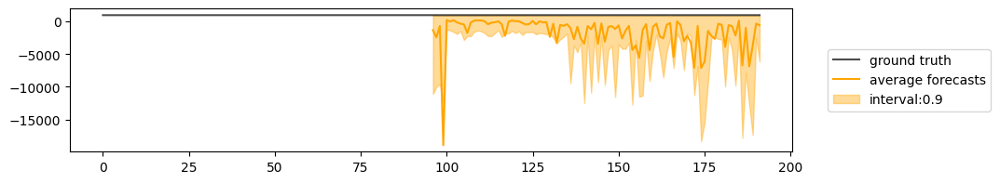

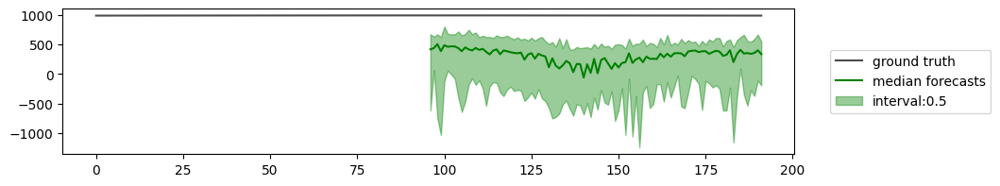

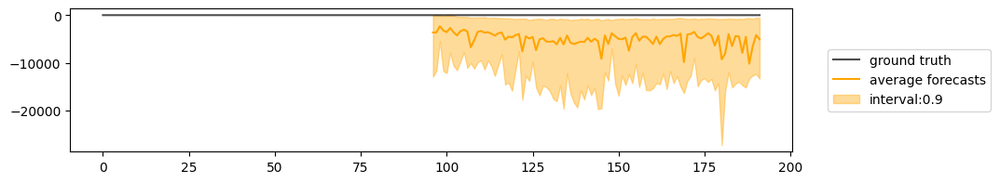

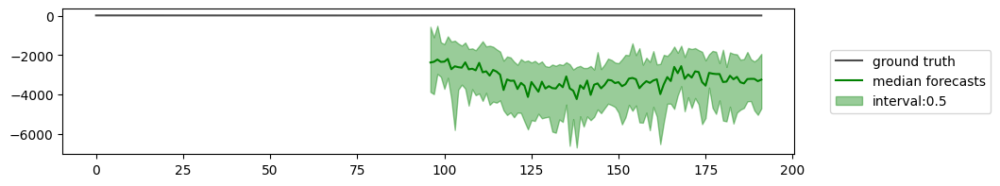

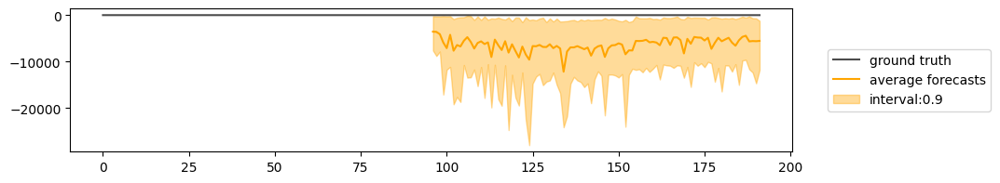

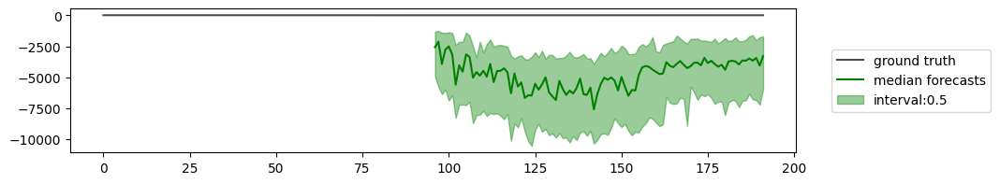

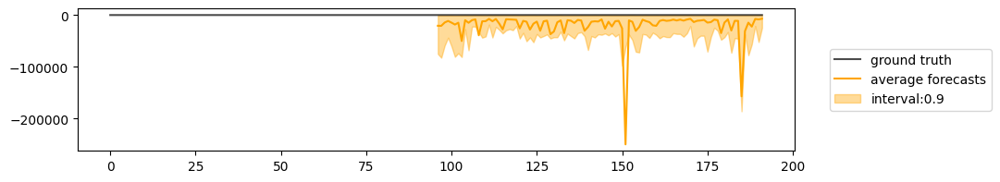

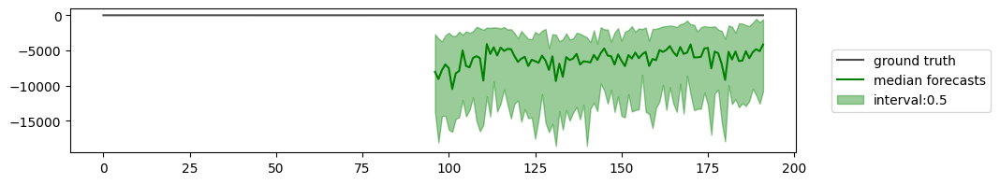

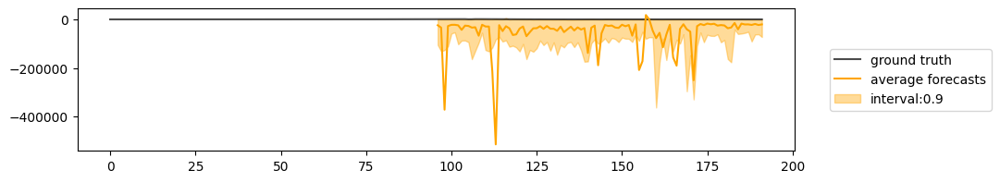

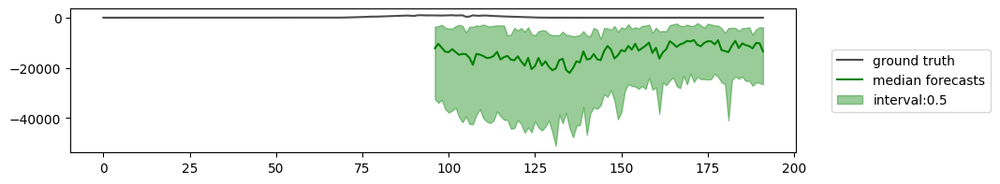

15


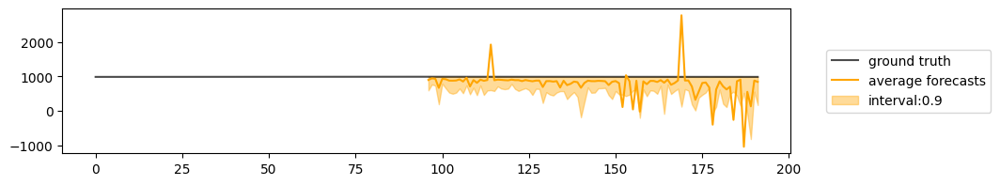

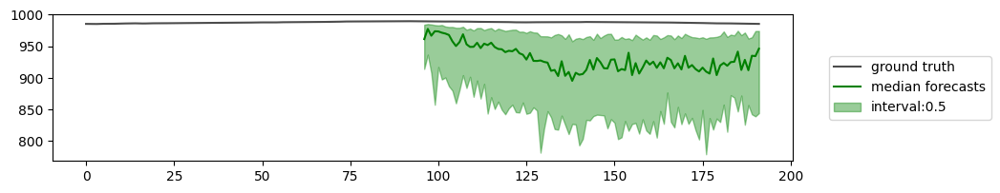

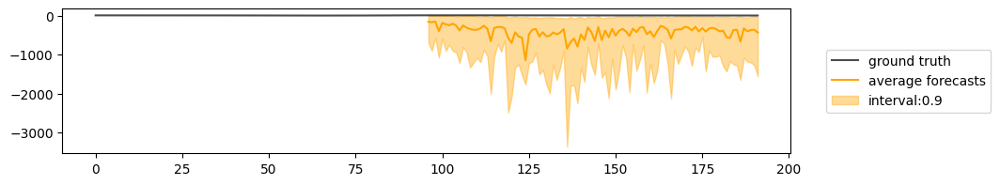

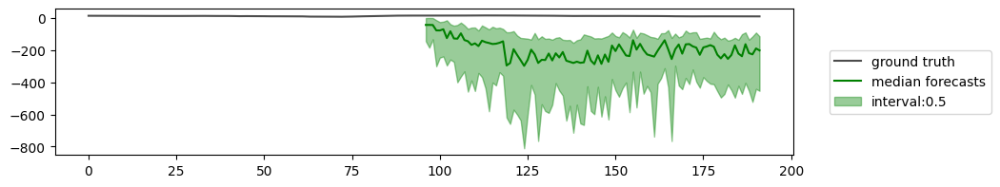

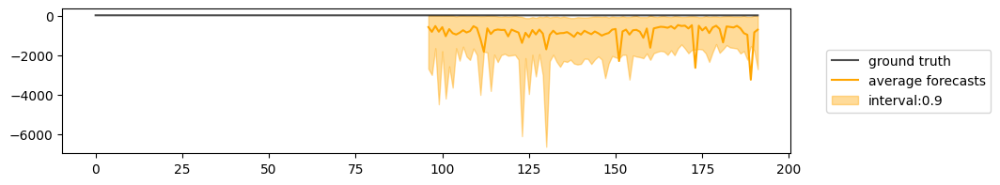

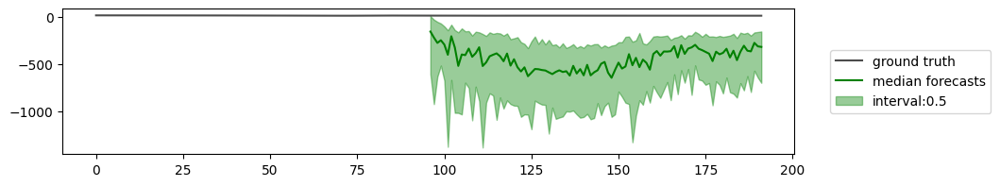

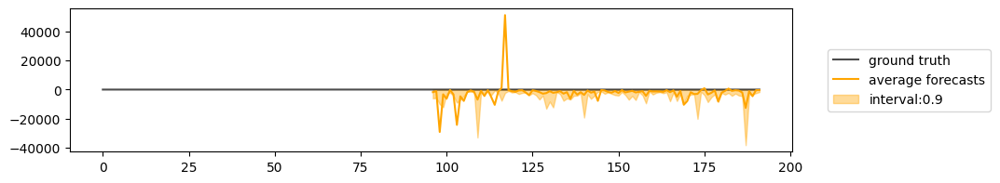

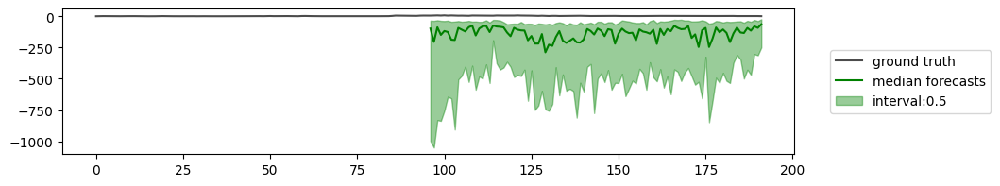

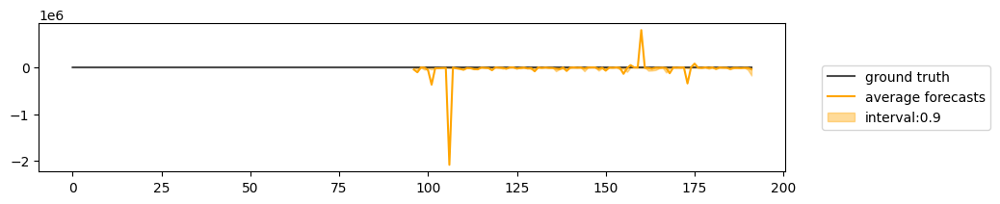

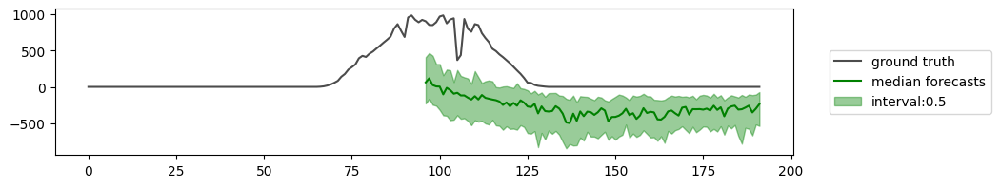

20


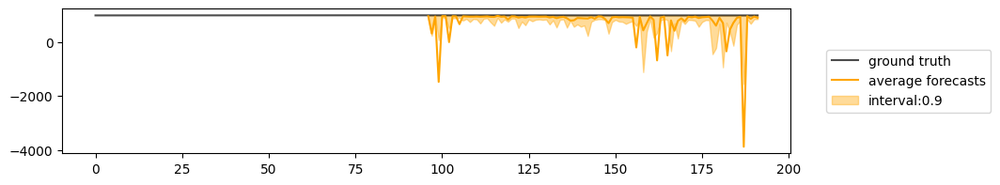

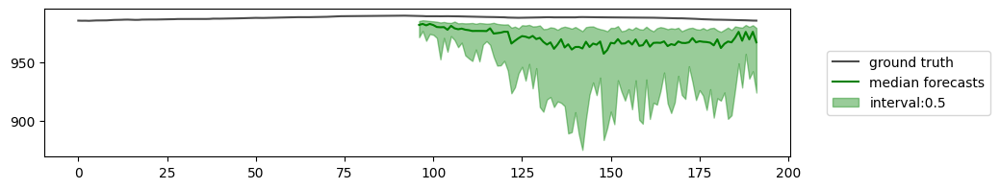

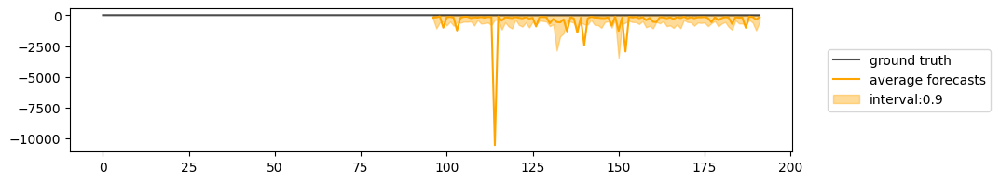

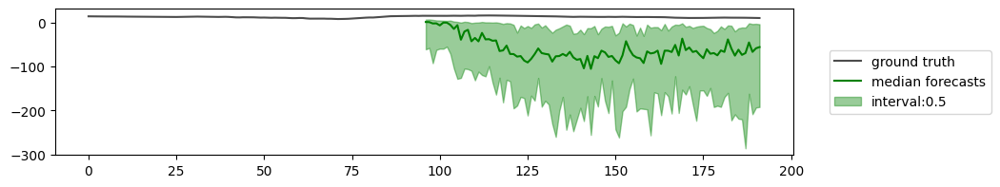

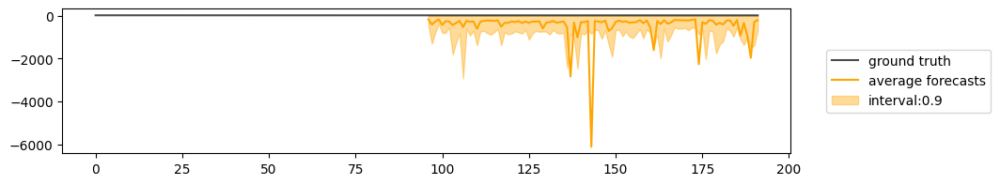

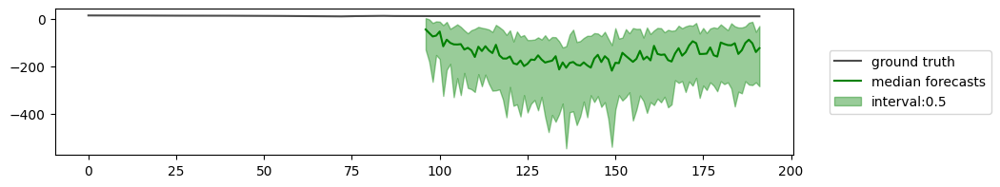

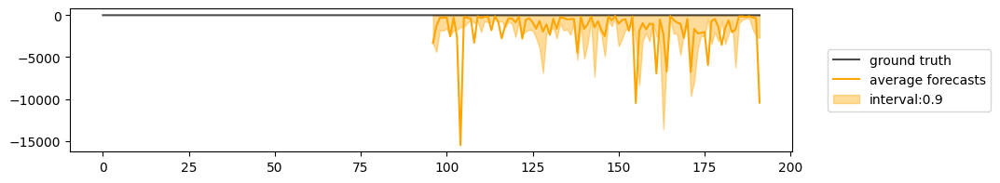

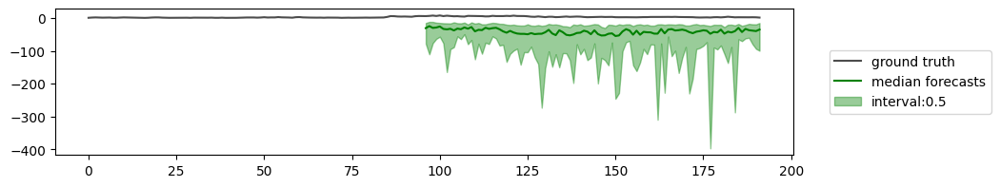

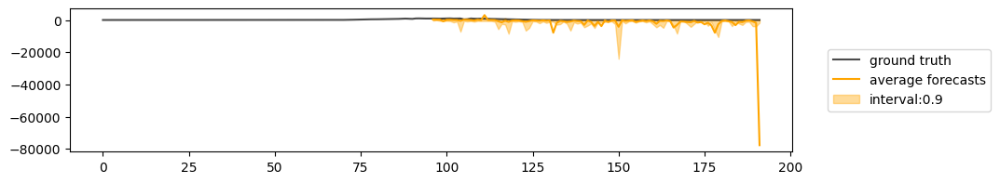

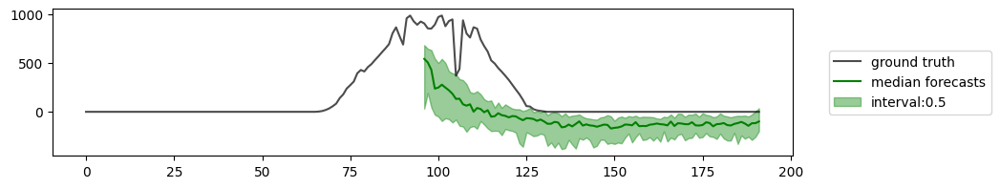

30


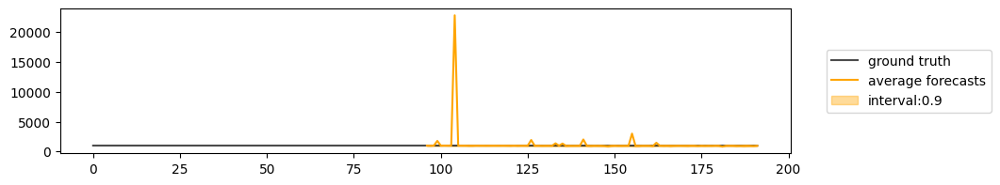

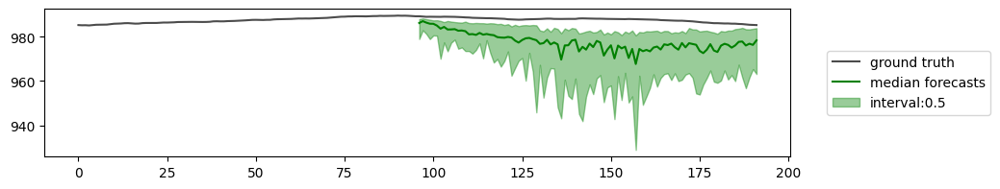

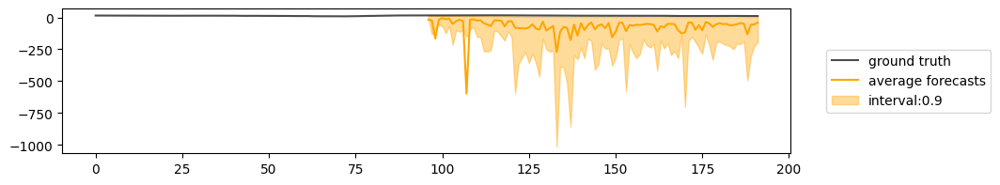

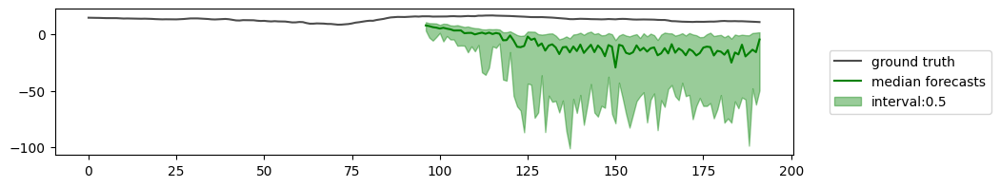

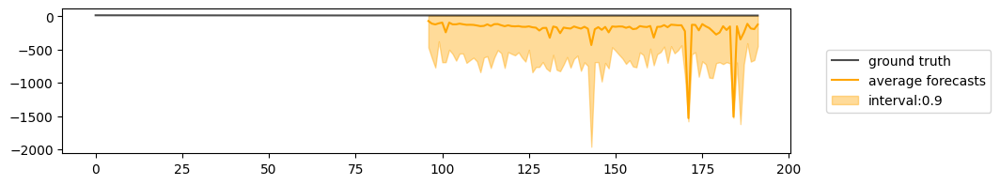

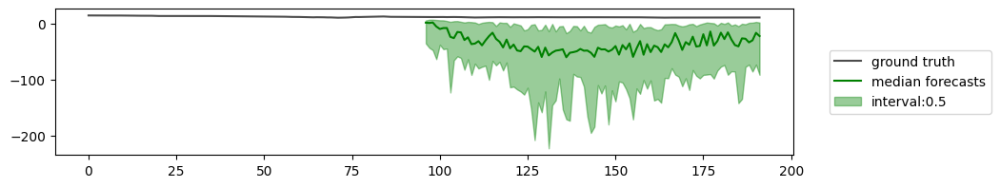

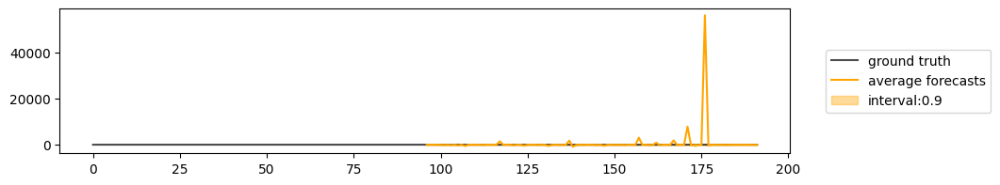

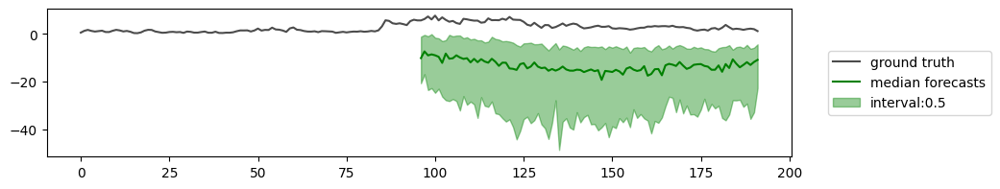

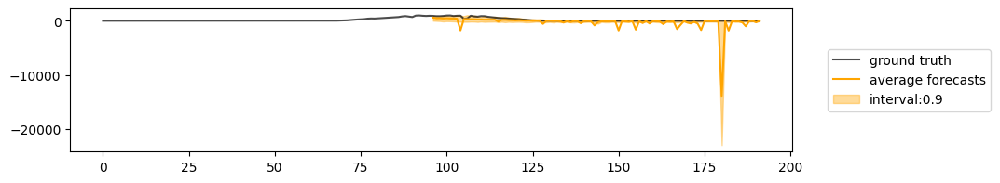

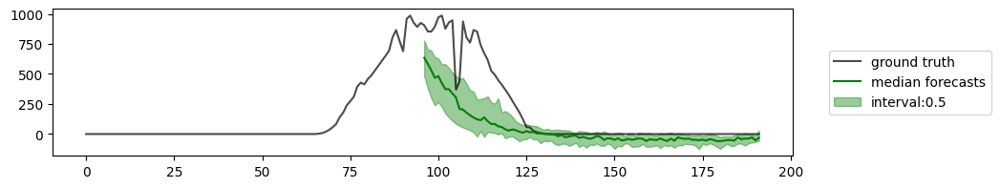

50


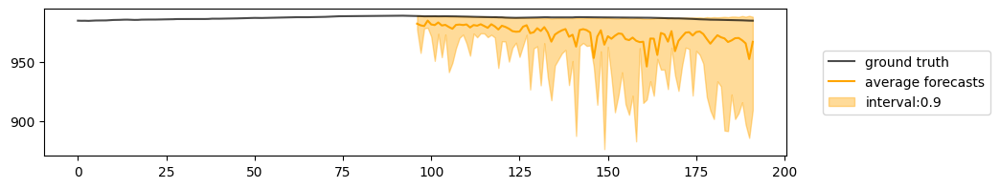

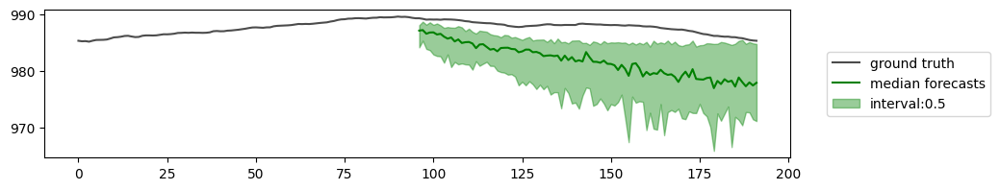

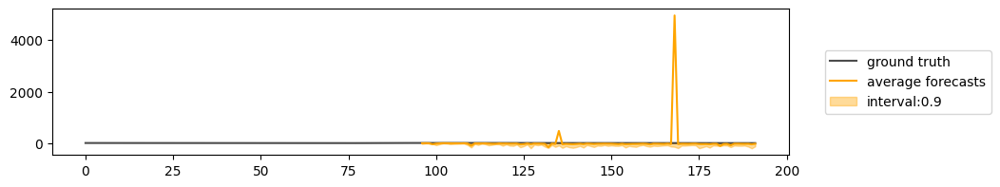

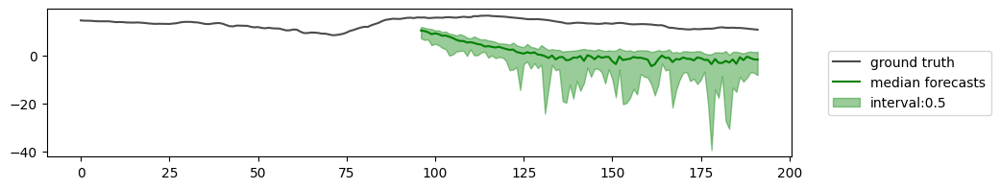

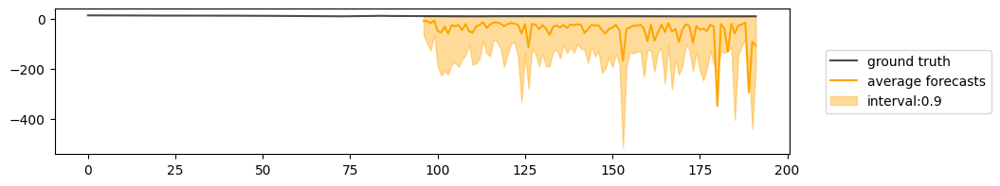

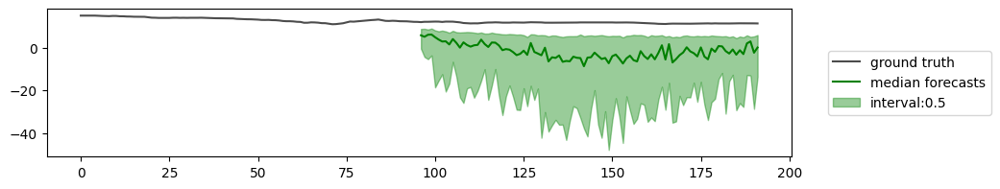

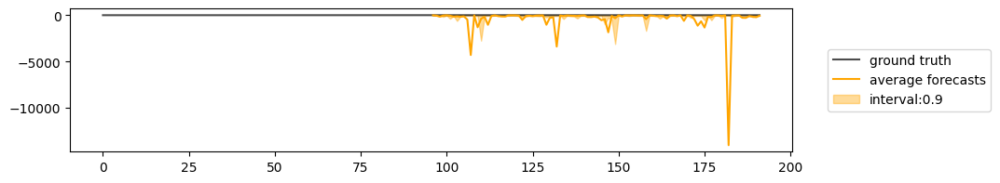

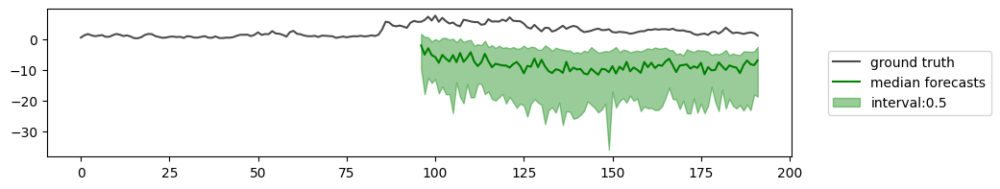

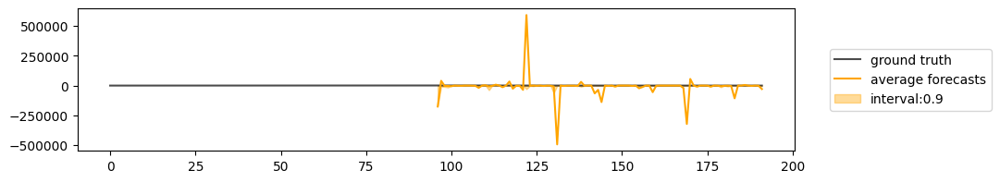

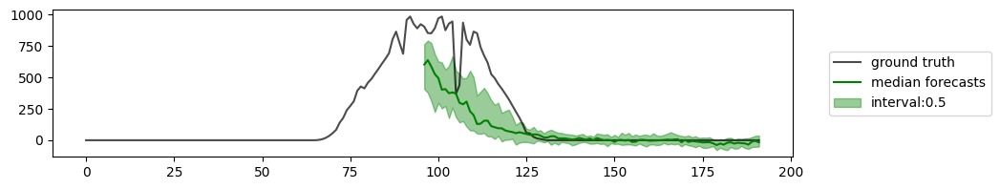

100


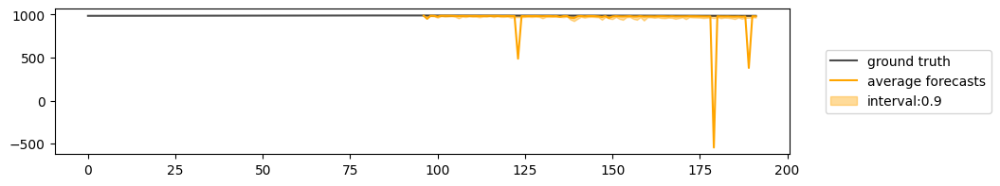

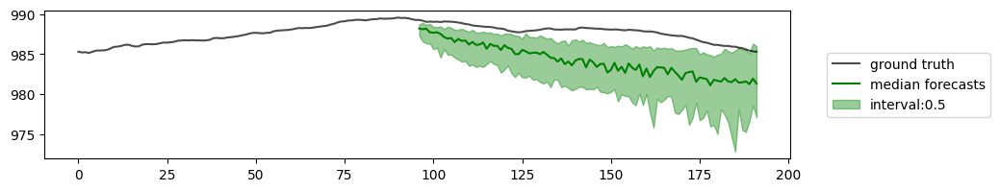

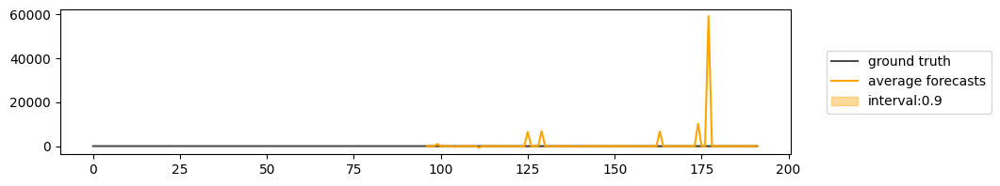

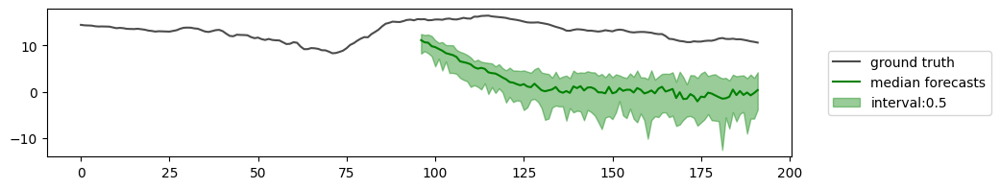

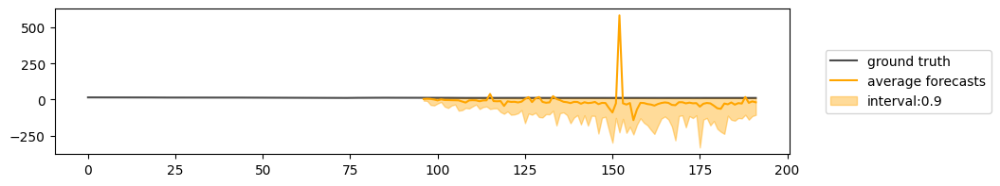

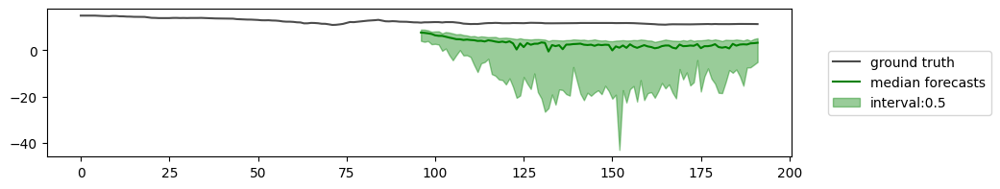

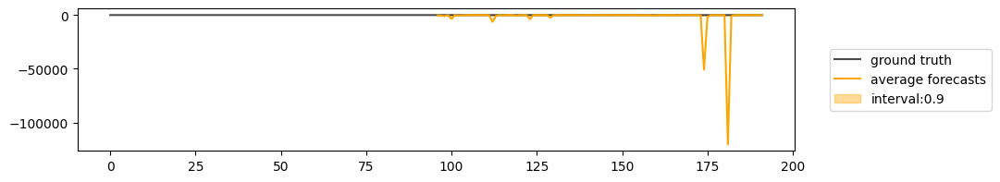

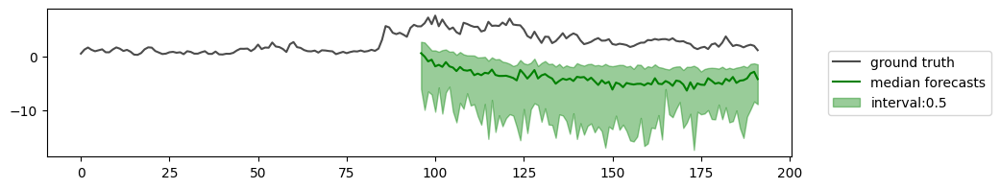

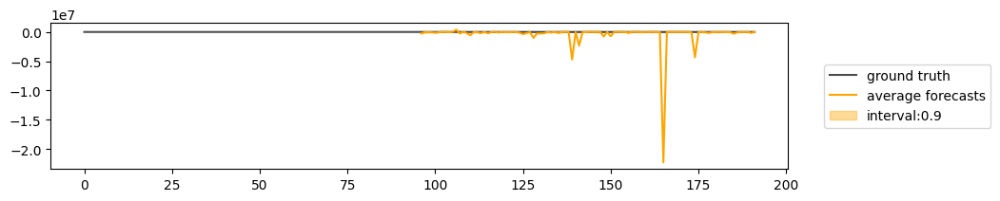

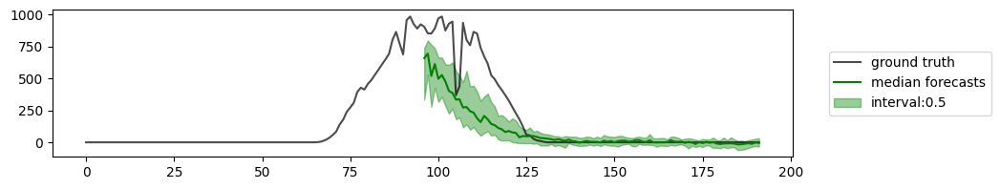

In [61]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96)
    plt.show()

### DPM-Solver-2

In [62]:
model.forecaster.solver = 'dpm2'
model.forecaster.solver_schedule = 'linear'
model.scaler = data_manager.scaler
model.forecaster.solver_num_steps = 15

steps = [10, 15, 20, 30, 50, 100]
for batch in test_dataloader:
    break

In [63]:
dpm_time = []
for num_steps in tqdm(steps):
    model.forecaster.solver_num_steps = num_steps
    dpm_time.append(time_for_forecast(batch, model, n_repeats=1))
dpm_time

100%|██████████| 6/6 [00:02<00:00,  2.11it/s]


[0.12042713165283203,
 0.18341803550720215,
 0.2522122859954834,
 0.37285614013671875,
 0.6304118633270264,
 1.264601707458496]

In [64]:
dpm2_metrics = check_metrics_for_samplers(test_dataloader, model, trainer, steps=steps)

  0%|          | 0/6 [00:00<?, ?it/s]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Testing: |          | 0/? [00:00<?, ?it/s]

 17%|█▋        | 1/6 [00:56<04:42, 56.52s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.30069050192832947
    96_test_CRPS-Sum        0.4765147566795349
      96_test_MASE           50.36427688598633
       96_test_MSE             17984256000.0
     96_test_MSE-Sum          378426392576.0
       96_test_ND           0.3504713773727417
     96_test_ND-Sum         0.41688263416290283
      96_test_NRMSE           471.41357421875
    96_test_NRMSE-Sum       102.99822235107422
   96_test_weighted_ND      0.3504713773727417
 96_test_weighted_ND-Sum    0.41688263416290283
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 33%|███▎      | 2/6 [02:14<04:37, 69.28s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.08905518800020218
    96_test_CRPS-Sum        0.14653244614601135
      96_test_MASE          22.352840423583984
       96_test_MSE             2617171456.0
     96_test_MSE-Sum           55330402304.0
       96_test_ND           0.08926060795783997
     96_test_ND-Sum         0.06019267439842224
      96_test_NRMSE         198.38543701171875
    96_test_NRMSE-Sum        43.45518112182617
   96_test_weighted_ND      0.08926060795783997
 96_test_weighted_ND-Sum    0.06019267439842224
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 50%|█████     | 3/6 [03:55<04:11, 83.82s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.8497926592826843
    96_test_CRPS-Sum         4.101165771484375
      96_test_MASE          57.479183197021484
       96_test_MSE             32607391744.0
     96_test_MSE-Sum          732426862592.0
       96_test_ND           0.12771739065647125
     96_test_ND-Sum         0.5250287652015686
      96_test_NRMSE          844.8364868164062
    96_test_NRMSE-Sum       192.74224853515625
   96_test_weighted_ND      0.12771739065647125
 96_test_weighted_ND-Sum    0.5250287652015686
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 67%|██████▋   | 4/6 [06:17<03:33, 106.71s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.14967918395996094
    96_test_CRPS-Sum        0.16740792989730835
      96_test_MASE          122.05281066894531
       96_test_MSE             1409729536.0
     96_test_MSE-Sum           29653964800.0
       96_test_ND           0.17780861258506775
     96_test_ND-Sum         0.18757835030555725
      96_test_NRMSE          98.9324722290039
    96_test_NRMSE-Sum       21.685087203979492
   96_test_weighted_ND      0.17780861258506775
 96_test_weighted_ND-Sum    0.18757835030555725
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

 83%|████████▎ | 5/6 [10:05<02:30, 150.30s/it]LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS          0.7501147389411926
    96_test_CRPS-Sum        0.7218512296676636
      96_test_MASE           418.1401672363281
       96_test_MSE              657271296.0
     96_test_MSE-Sum           13762386944.0
       96_test_ND           0.8793731331825256
     96_test_ND-Sum         0.8586205244064331
      96_test_NRMSE          64.36978149414062
    96_test_NRMSE-Sum        14.2626371383667
   96_test_weighted_ND      0.8793731331825256
 96_test_weighted_ND-Sum    0.8586205244064331
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


Testing: |          | 0/? [00:00<?, ?it/s]

100%|██████████| 6/6 [17:30<00:00, 175.04s/it]

────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
       Test metric             DataLoader 0
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────
      96_test_CRPS           6.222957611083984
    96_test_CRPS-Sum         4.293374538421631
      96_test_MASE           3200.563720703125
       96_test_MSE              190066608.0
     96_test_MSE-Sum           4283890944.0
       96_test_ND            7.515340328216553
     96_test_ND-Sum          5.08374547958374
      96_test_NRMSE         26.376340866088867
    96_test_NRMSE-Sum        7.537856578826904
   96_test_weighted_ND       7.515340328216553
 96_test_weighted_ND-Sum     5.08374547958374
────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────


In [65]:
import pickle
with open("dpm2_metrics.pkl", "wb") as fp:
   pickle.dump(dpm2_metrics, fp)

10


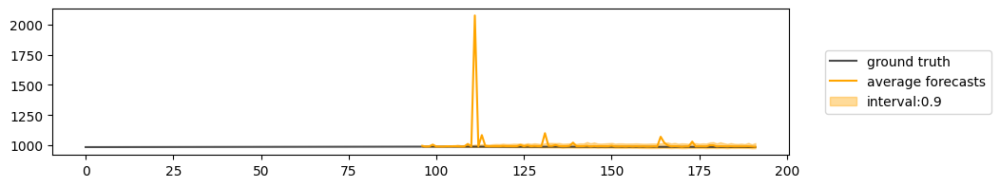

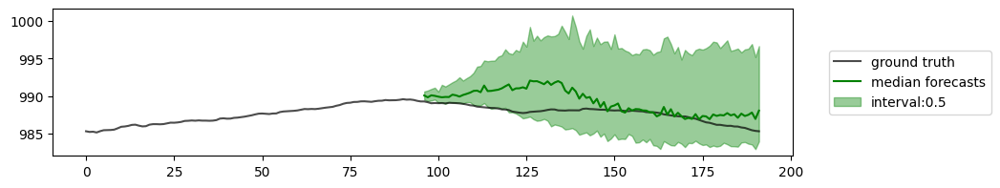

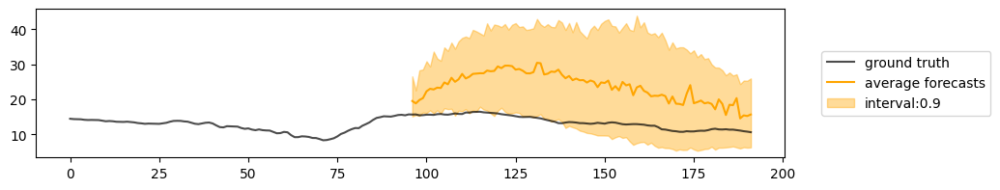

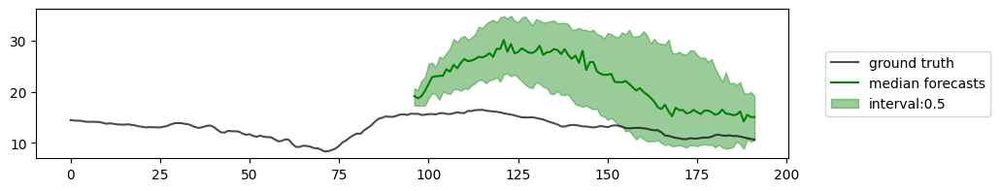

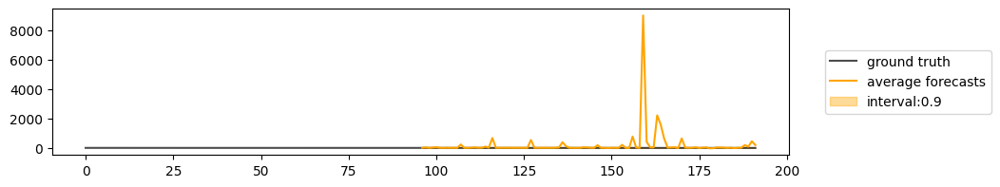

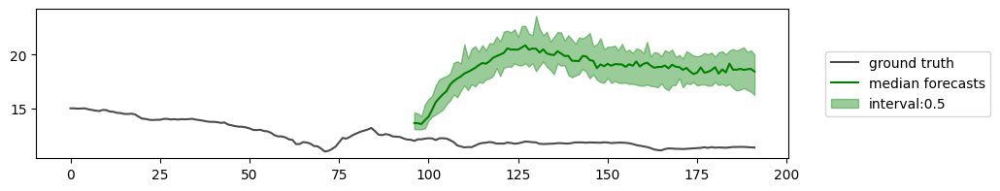

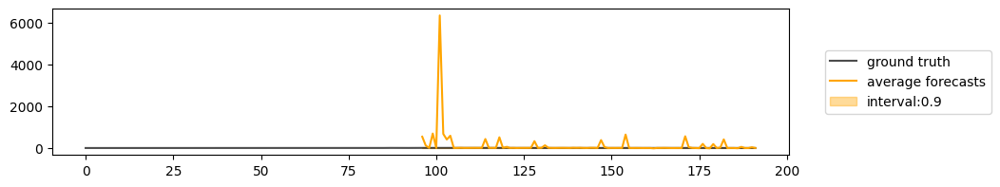

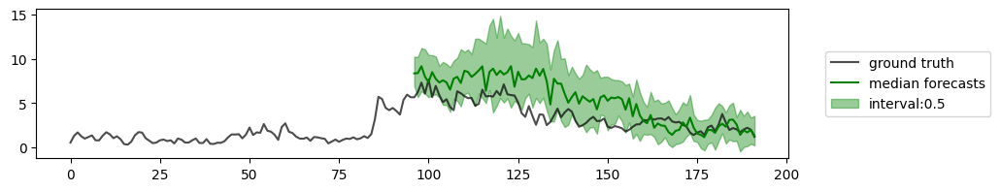

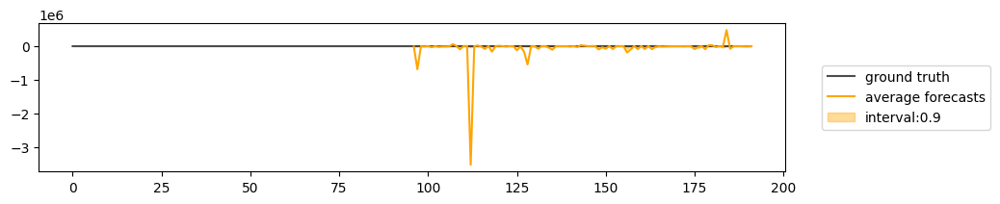

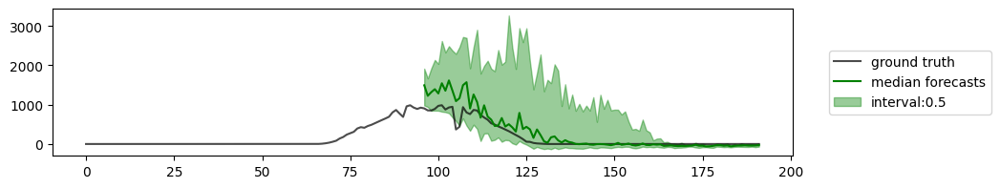

15


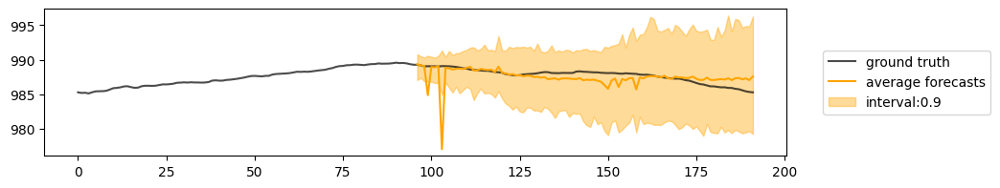

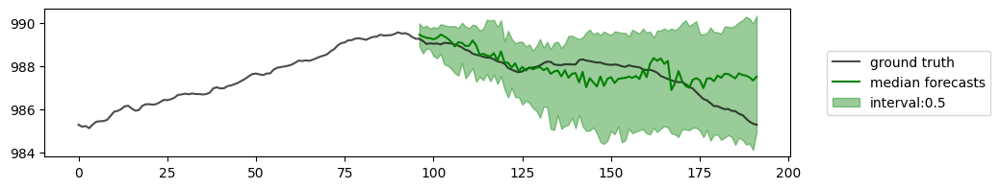

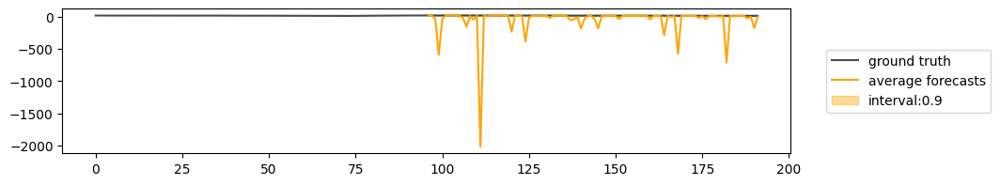

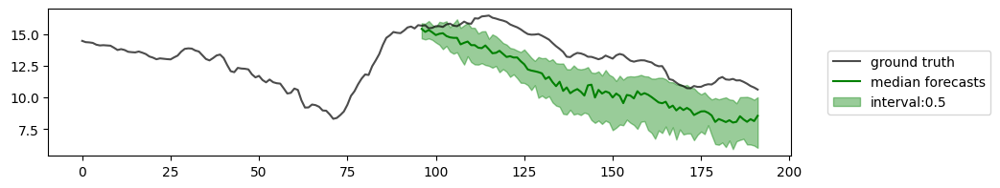

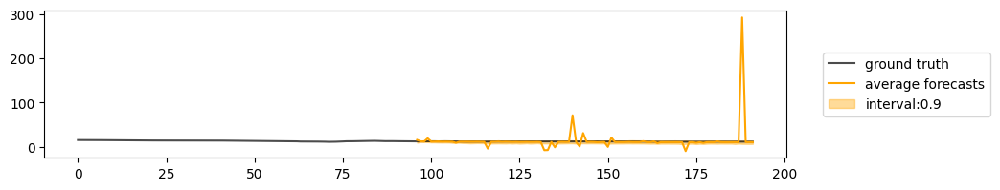

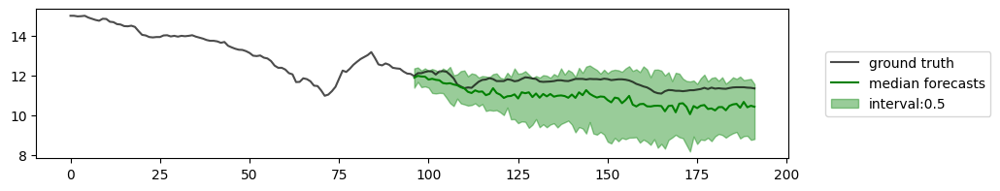

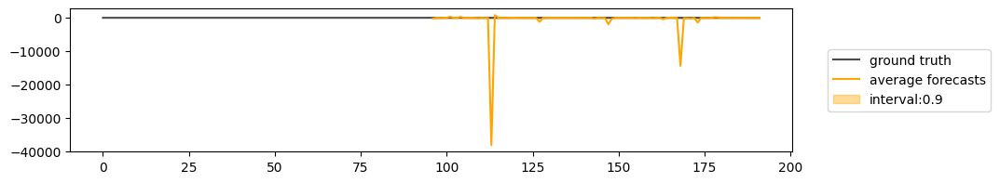

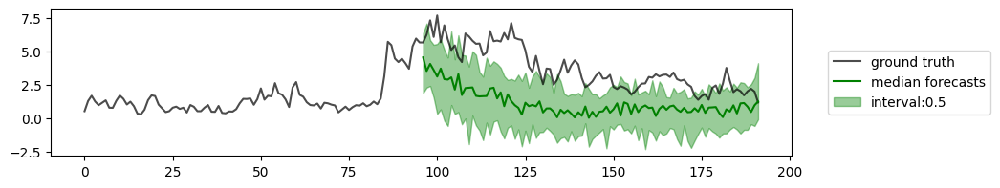

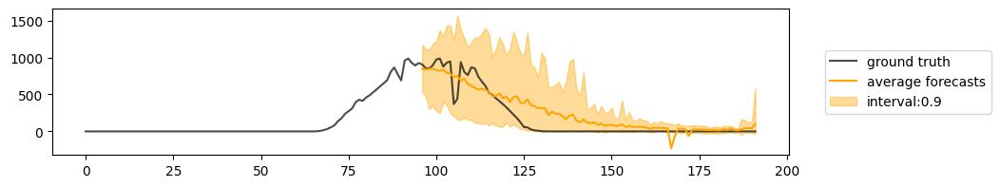

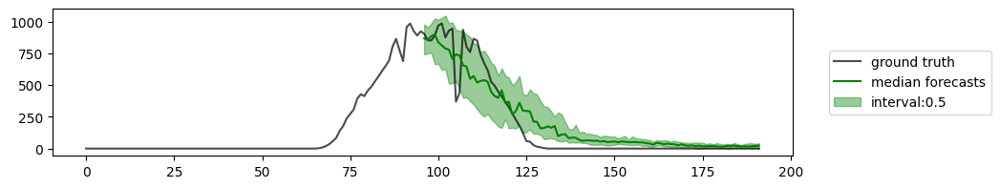

20


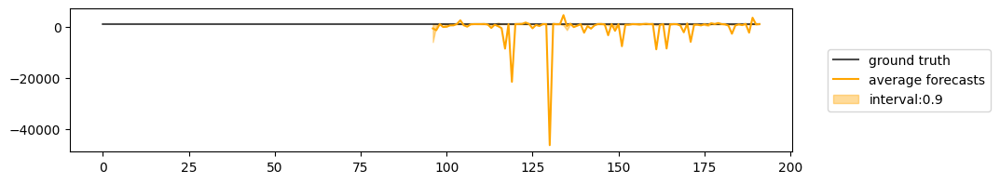

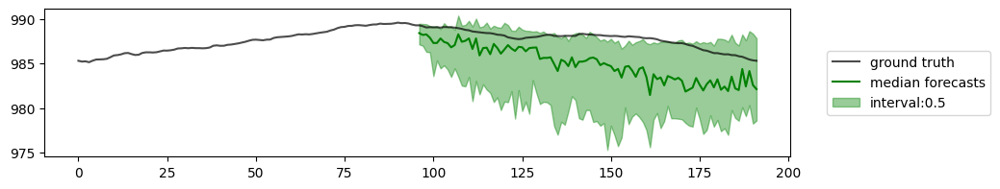

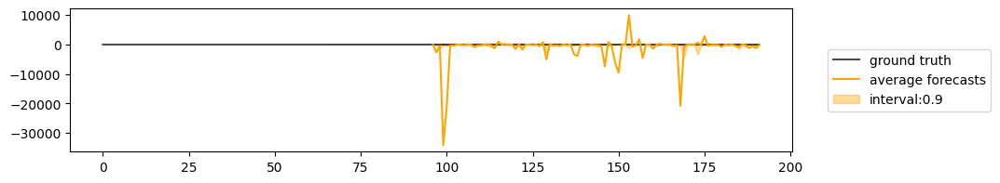

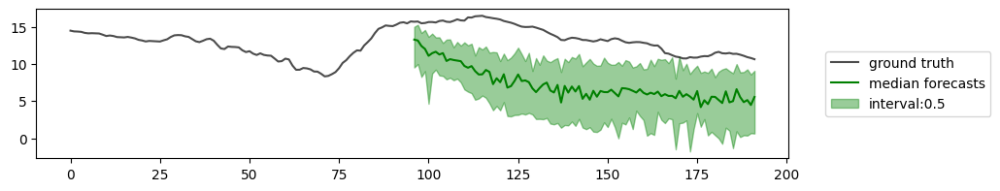

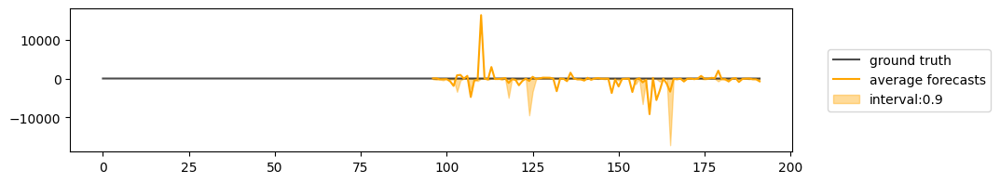

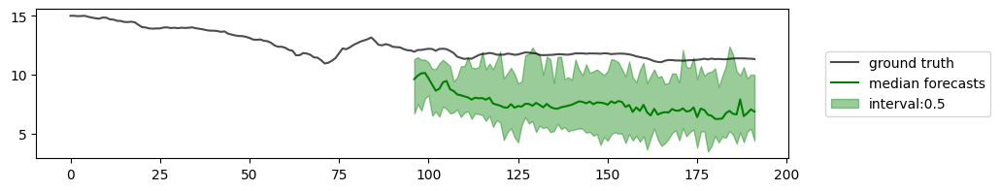

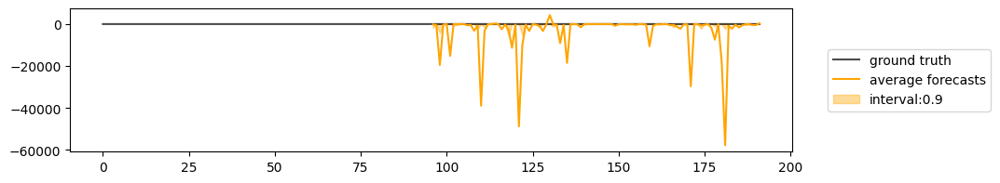

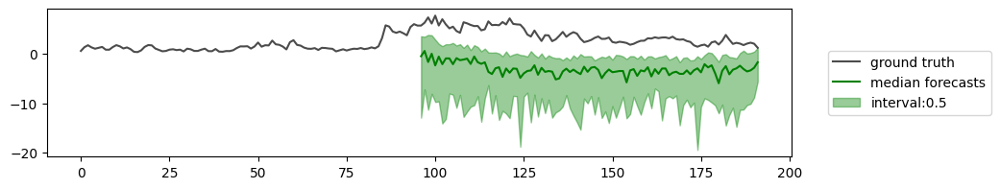

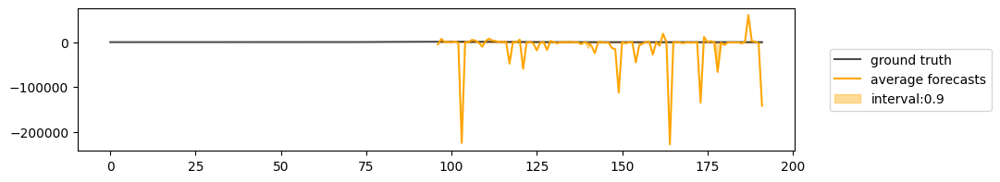

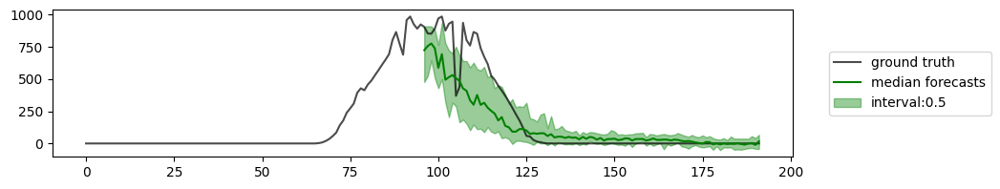

30


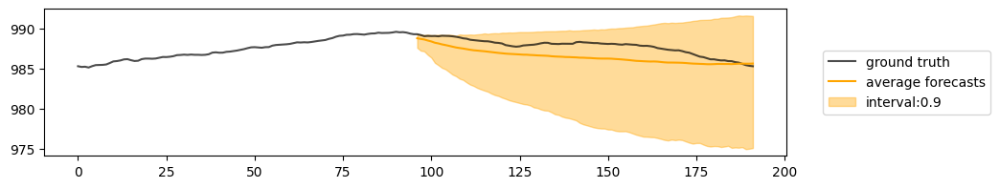

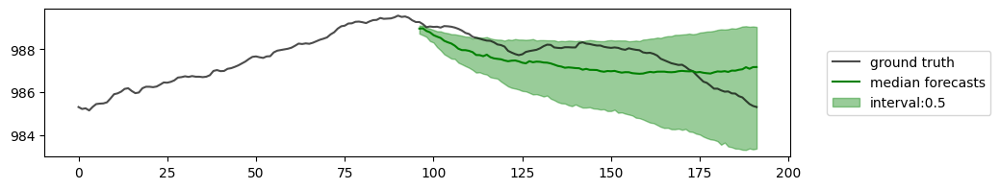

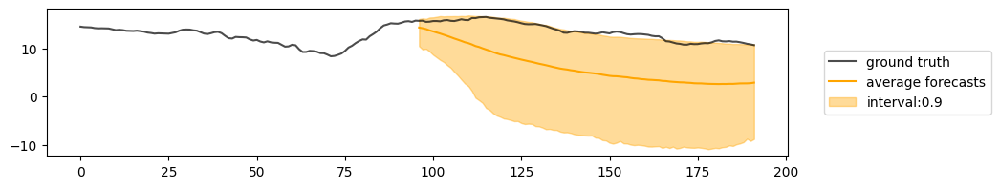

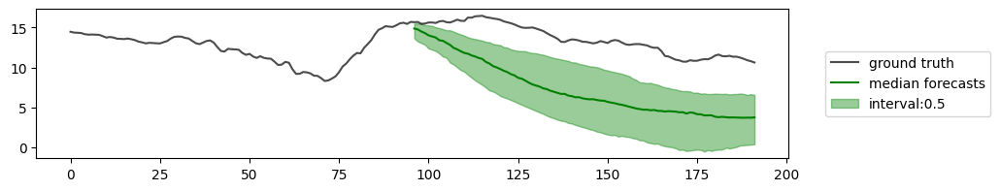

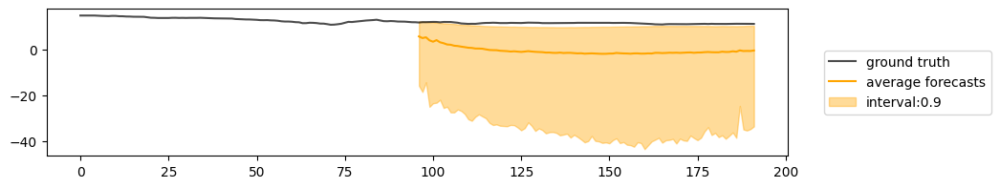

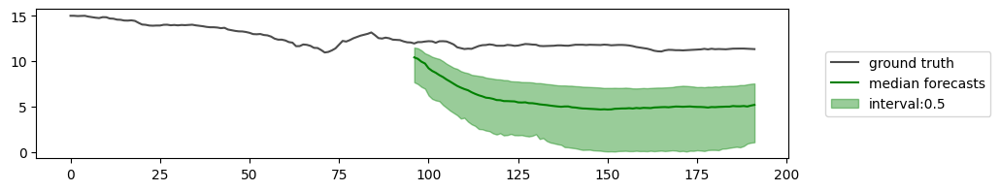

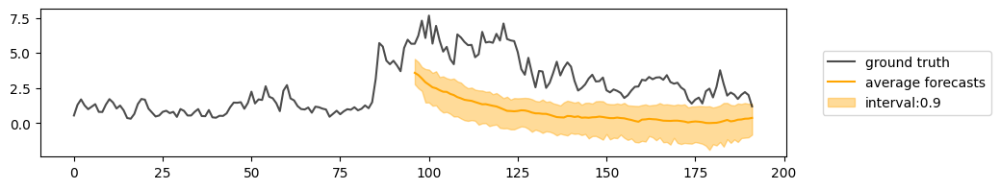

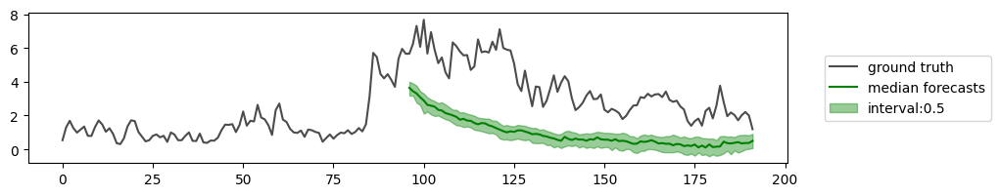

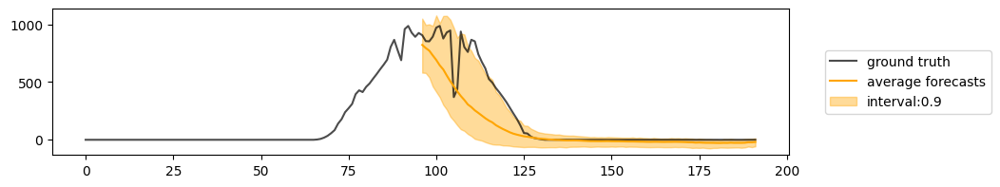

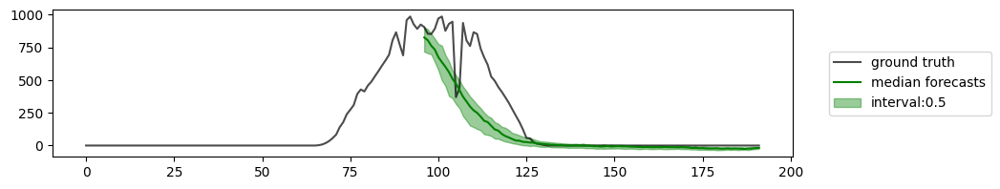

50


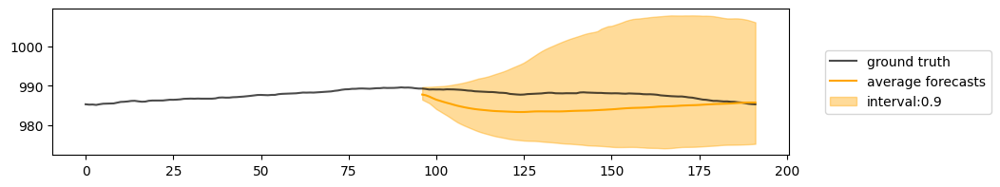

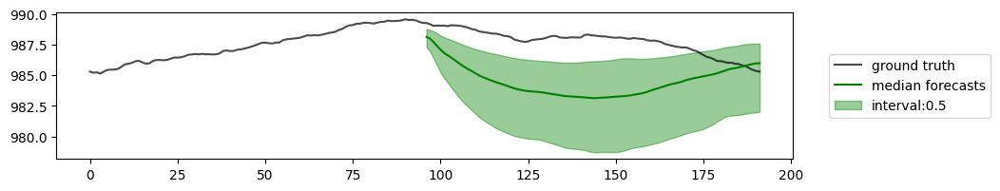

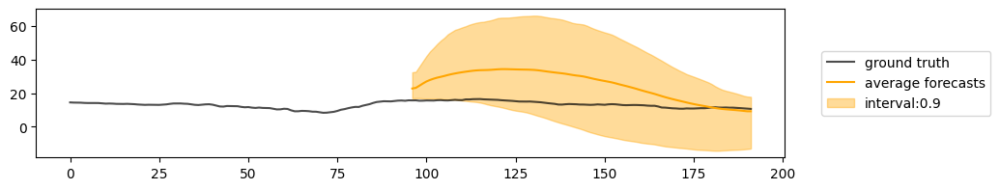

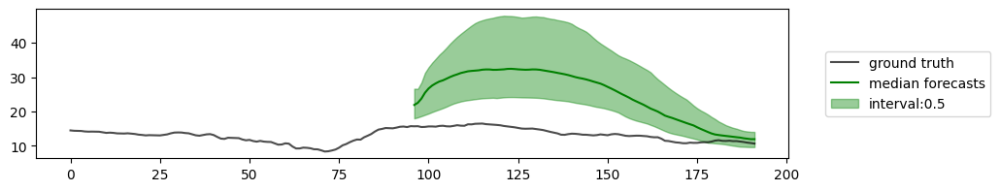

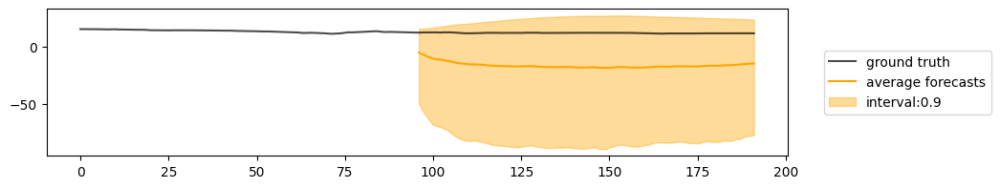

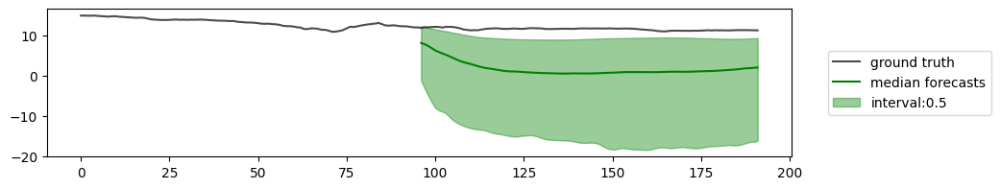

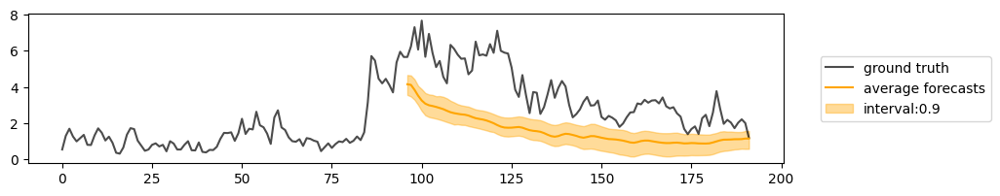

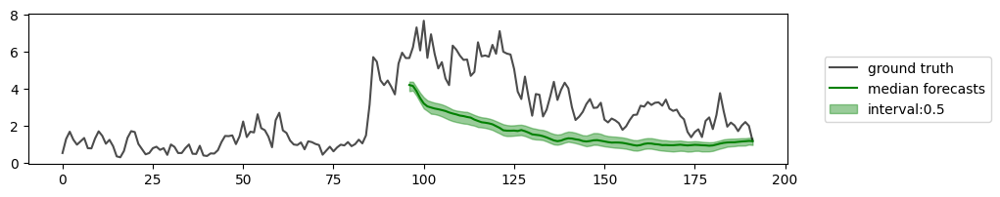

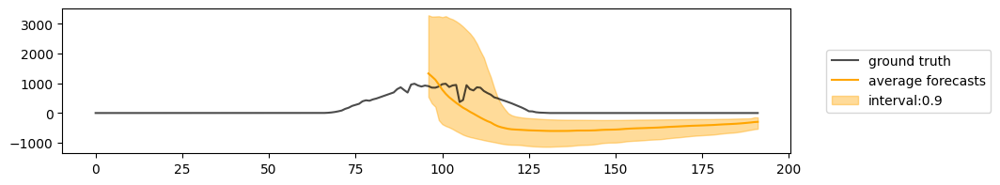

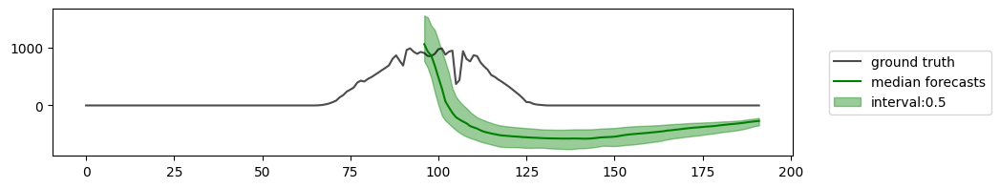

100


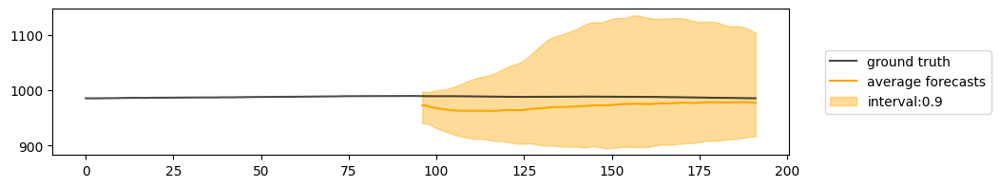

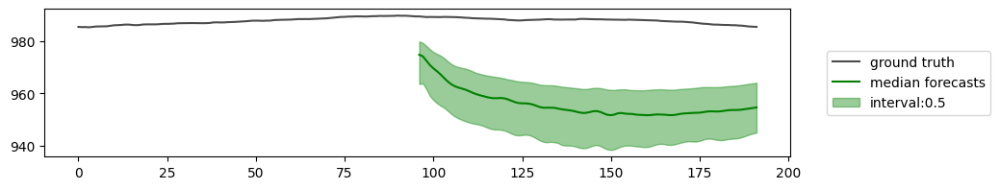

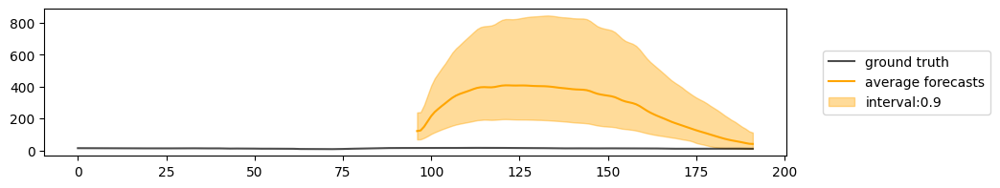

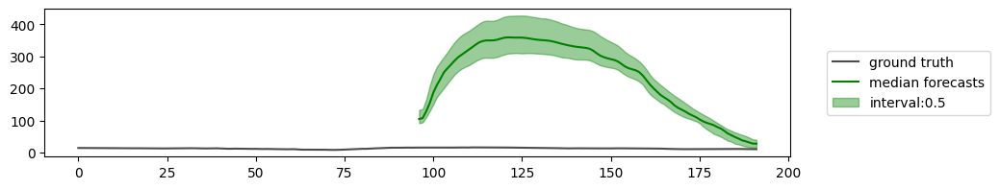

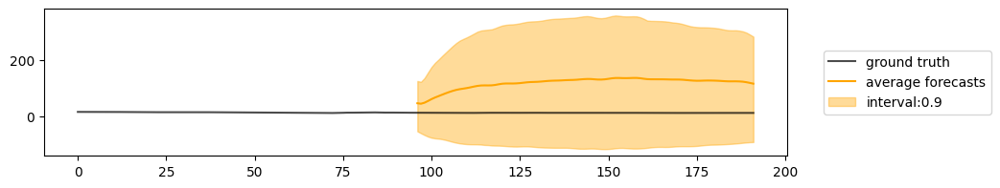

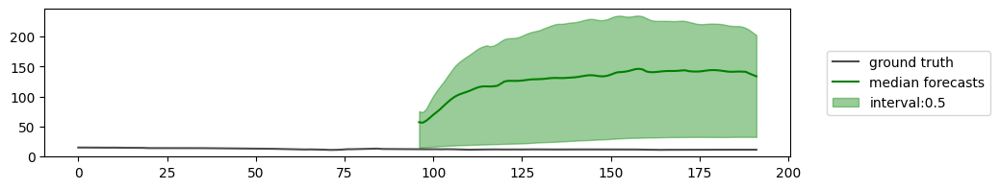

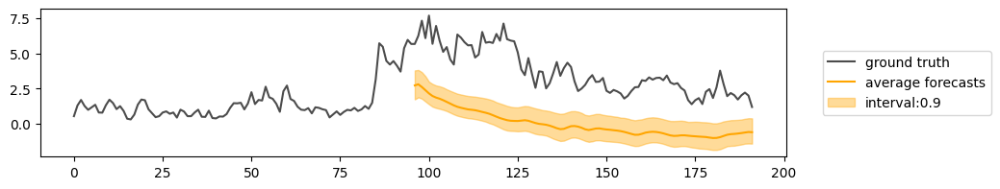

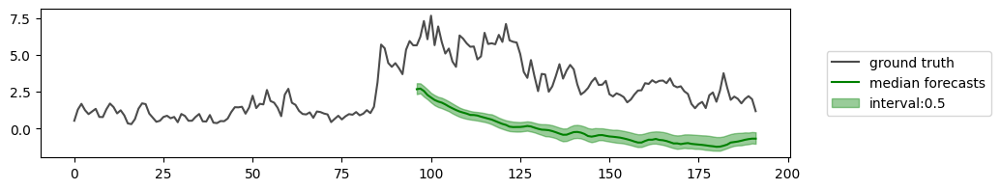

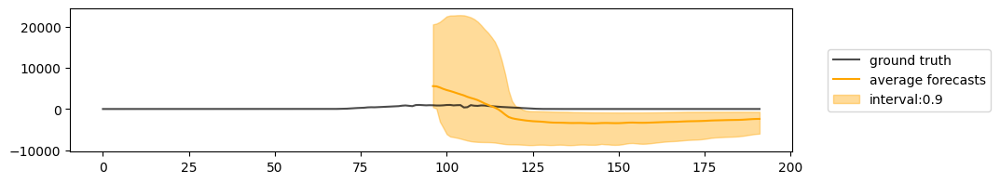

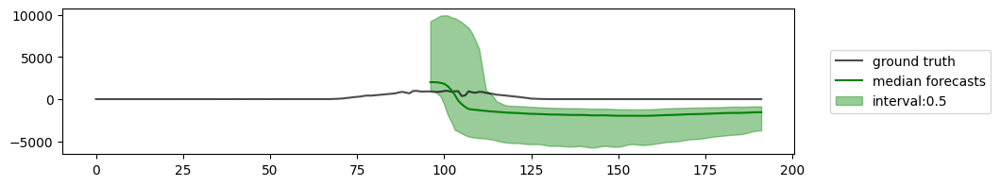

In [66]:
for num_steps in steps:
    print(num_steps)
    model.forecaster.solver_num_steps = num_steps
    forecast_and_visualize(batch, model, num_chan=[0, 1, 6, 11, 18], num_samples=50, batch_idx=7, context_length=96, prediction_length=96)
    plt.show()

### Plot results

In [67]:
import pickle
import os

metrics = {}
samplers_name = ['DDIM, linear', 'DDIM, quad', 'DPM-Solver-1', 'DPM-Solver-2', 'Euler', 'Heun']
for i, file in enumerate(sorted(os.listdir("samplers_res/"))):
    with open(f"samplers_res/{file}", "rb") as fp:
        metrics[samplers_name[i]] = pickle.load(fp)

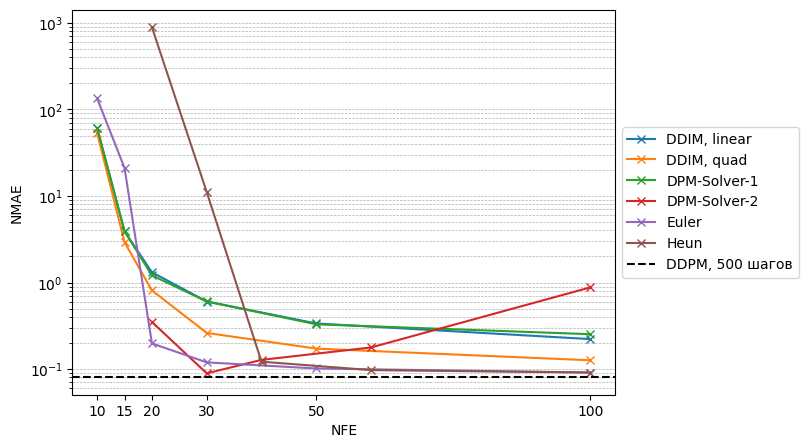

In [82]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
nfe_2_ord = [2 * x for x in nfe][:-1]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(nfe_2_ord, nmae[:-1], marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(nfe, nmae, marker='x', linestyle='-', label=sampler)
    
plt.axhline(y=0.08051588386297226 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('NMAE')
# plt.yticks(np.arange(0.1, 0.31, 0.05))
# plt.ylim(0, 1)
plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
# plt.grid(True, which='minor', ls="--", linewidth=0.5)

plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

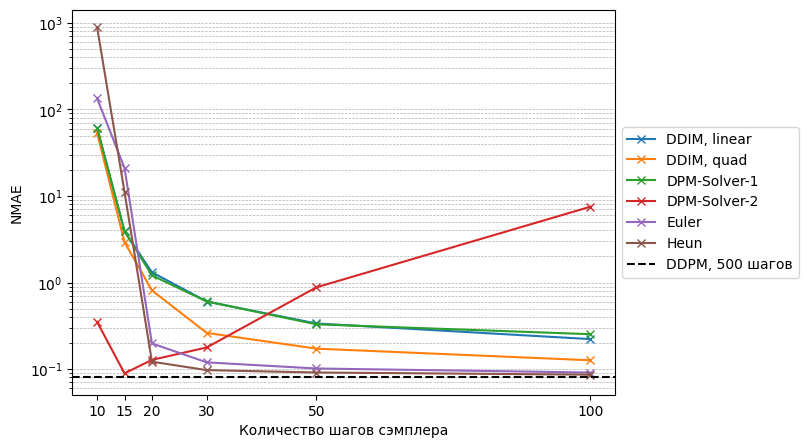

In [81]:
solver_steps = [10, 15, 20, 30, 50, 100]

plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    nmae = [run['96_test_ND'] for run in runs]
    plt.plot(solver_steps, nmae, marker='x', linestyle='-', label=sampler)
    
plt.axhline(y=0.08051588386297226 , linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('NMAE')
# plt.yticks(np.arange(0.1, 0.271, 0.05))
# plt.ylim(0, 100)
plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

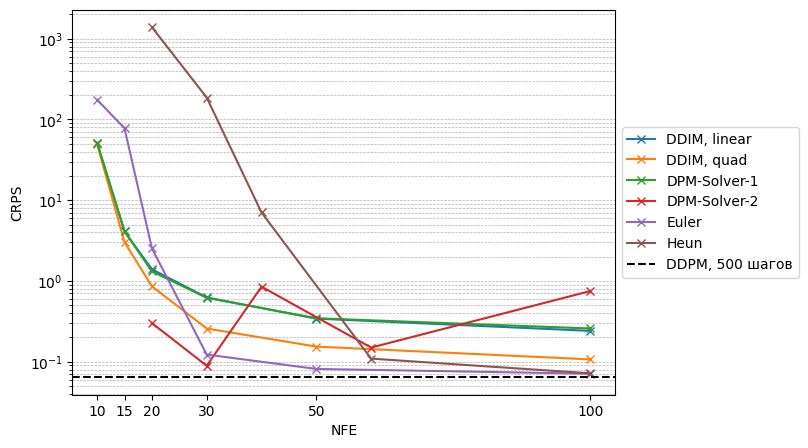

In [83]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    if sampler in ['Heun', 'DPM-Solver-2']:
        plt.plot(nfe_2_ord, crps[:-1], marker='x', linestyle='-', label=sampler)
    else:
        plt.plot(nfe, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.06427552551031113, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('NFE')
plt.xticks(nfe)
plt.ylabel('CRPS')
# plt.ylim(0.05, 0.25)
# plt.yticks(np.arange(0.05, 0.251, 0.05))
plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));

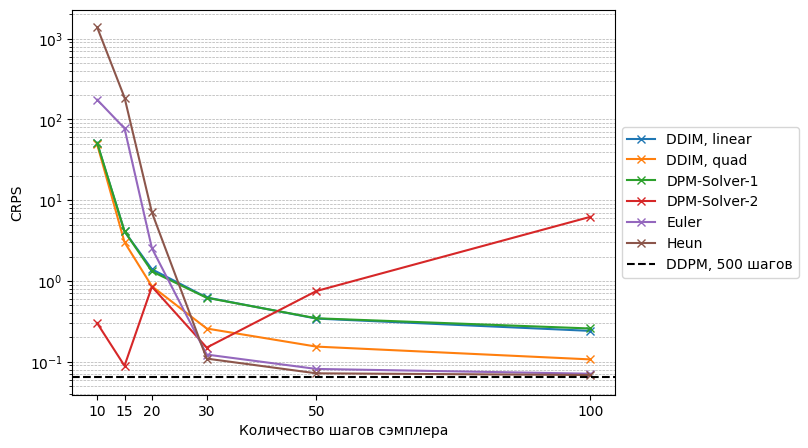

In [84]:
import matplotlib.pyplot as plt
import numpy as np

nfe = [10, 15, 20, 30, 50, 100]
plt.figure(figsize=(7, 5))

for sampler in metrics:
    runs = metrics[sampler]
    crps = [run['96_test_CRPS'] for run in runs]
    plt.plot(solver_steps, crps, marker='x', linestyle='-', label=sampler)

plt.axhline(y=0.06427552551031113, linestyle='--', label='DDPM, 500 шагов', c='black')

plt.xlabel('Количество шагов сэмплера')
plt.xticks(nfe)
plt.ylabel('CRPS')
# plt.ylim(0.05, 0.25)
# plt.yticks(np.arange(0.05, 0.251, 0.05))
plt.yscale('log')
plt.grid(True, which="both", ls="--", linewidth=0.5, axis='y')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5));